In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn import Conv2d, GroupNorm, ReLU
from torch.utils.data import Dataset, DataLoader

# Define DSConv class
class DSConv(nn.Module):
    def __init__(self, in_ch, out_ch, kernel_size, extend_scope, morph, if_offset, device):
        super(DSConv, self).__init__()
        self.offset_conv = nn.Conv2d(in_ch, 2 * kernel_size, 3, padding=1)
        self.bn = nn.BatchNorm2d(2 * kernel_size)
        self.kernel_size = kernel_size
        self.dsc_conv_x = nn.Conv2d(
            in_ch,
            out_ch,
            kernel_size=(kernel_size, 1),
            stride=(kernel_size, 1),
            padding=0,
        )
        self.dsc_conv_y = nn.Conv2d(
            in_ch,
            out_ch,
            kernel_size=(1, kernel_size),
            stride=(1, kernel_size),
            padding=0,
        )
        self.gn = nn.GroupNorm(out_ch // 4, out_ch)
        self.relu = nn.ReLU(inplace=True)
        self.extend_scope = extend_scope
        self.morph = morph
        self.if_offset = if_offset
        self.device = device

    def forward(self, f):
        offset = self.offset_conv(f)
        offset = self.bn(offset)
        offset = torch.tanh(offset)
        input_shape = f.shape
        dsc = DSC(input_shape, self.kernel_size, self.extend_scope, self.morph, self.device)
        deformed_feature = dsc.deform_conv(f, offset, self.if_offset)
        if self.morph == 0:
            x = self.dsc_conv_x(deformed_feature)
            x = self.gn(x)
            x = self.relu(x)
            return x
        else:
            x = self.dsc_conv_y(deformed_feature)
            x = self.gn(x)
            x = self.relu(x)
            return x

class DSC(object):
    def __init__(self, input_shape, kernel_size, extend_scope, morph, device):
        self.num_points = kernel_size
        self.width = input_shape[2]
        self.height = input_shape[3]
        self.morph = morph
        self.device = device
        self.extend_scope = extend_scope
        self.num_batch = input_shape[0]
        self.num_channels = input_shape[1]

    def _coordinate_map_3D(self, offset, if_offset):
        y_offset, x_offset = torch.split(offset, self.num_points, dim=1)
        y_center = torch.arange(0, self.width).repeat([self.height])
        y_center = y_center.reshape(self.height, self.width)
        y_center = y_center.permute(1, 0)
        y_center = y_center.reshape([-1, self.width, self.height])
        y_center = y_center.repeat([self.num_points, 1, 1]).float()
        y_center = y_center.unsqueeze(0)
        x_center = torch.arange(0, self.height).repeat([self.width])
        x_center = x_center.reshape(self.width, self.height)
        x_center = x_center.permute(0, 1)
        x_center = x_center.reshape([-1, self.width, self.height])
        x_center = x_center.repeat([self.num_points, 1, 1]).float()
        x_center = x_center.unsqueeze(0)
        if self.morph == 0:
            y = torch.linspace(0, 0, 1)
            x = torch.linspace(-int(self.num_points // 2), int(self.num_points // 2), int(self.num_points))
            y, x = torch.meshgrid(y, x)
            y_spread = y.reshape(-1, 1)
            x_spread = x.reshape(-1, 1)
            y_grid = y_spread.repeat([1, self.width * self.height])
            y_grid = y_grid.reshape([self.num_points, self.width, self.height])
            y_grid = y_grid.unsqueeze(0)
            x_grid = x_spread.repeat([1, self.width * self.height])
            x_grid = x_grid.reshape([self.num_points, self.width, self.height])
            x_grid = x_grid.unsqueeze(0)
            y_new = y_center + y_grid
            x_new = x_center + x_grid
            y_new = y_new.repeat(self.num_batch, 1, 1, 1).to(self.device)
            x_new = x_new.repeat(self.num_batch, 1, 1, 1).to(self.device)
            y_offset_new = y_offset.detach().clone()
            if if_offset:
                y_offset = y_offset.permute(1, 0, 2, 3)
                y_offset_new = y_offset_new.permute(1, 0, 2, 3)
                center = int(self.num_points // 2)
                y_offset_new[center] = 0
                for index in range(1, center):
                    y_offset_new[center + index] = (y_offset_new[center + index - 1] + y_offset[center + index])
                    y_offset_new[center - index] = (y_offset_new[center - index + 1] + y_offset[center - index])
                y_offset_new = y_offset_new.permute(1, 0, 2, 3).to(self.device)
                y_new = y_new.add(y_offset_new.mul(self.extend_scope))
            y_new = y_new.reshape([self.num_batch, self.num_points, 1, self.width, self.height])
            y_new = y_new.permute(0, 3, 1, 4, 2)
            y_new = y_new.reshape([self.num_batch, self.num_points * self.width, 1 * self.height])
            x_new = x_new.reshape([self.num_batch, self.num_points, 1, self.width, self.height])
            x_new = x_new.permute(0, 3, 1, 4, 2)
            x_new = x_new.reshape([self.num_batch, self.num_points * self.width, 1 * self.height])
            return y_new, x_new
        else:
            y = torch.linspace(-int(self.num_points // 2), int(self.num_points // 2), int(self.num_points))
            x = torch.linspace(0, 0, 1)
            y, x = torch.meshgrid(y, x)
            y_spread = y.reshape(-1, 1)
            x_spread = x.reshape(-1, 1)
            y_grid = y_spread.repeat([1, self.width * self.height])
            y_grid = y_grid.reshape([self.num_points, self.width, self.height])
            y_grid = y_grid.unsqueeze(0)
            x_grid = x_spread.repeat([1, self.width * self.height])
            x_grid = x_grid.reshape([self.num_points, self.width, self.height])
            x_grid = x_grid.unsqueeze(0)
            y_new = y_center + y_grid
            x_new = x_center + x_grid
            y_new = y_new.repeat(self.num_batch, 1, 1, 1)
            x_new = x_new.repeat(self.num_batch, 1, 1, 1)
            y_new = y_new.to(self.device)
            x_new = x_new.to(self.device)
            x_offset_new = x_offset.detach().clone()
            if if_offset:
                x_offset = x_offset.permute(1, 0, 2, 3)
                x_offset_new = x_offset_new.permute(1, 0, 2, 3)
                center = int(self.num_points // 2)
                x_offset_new[center] = 0
                for index in range(1, center):
                    x_offset_new[center + index] = (x_offset_new[center + index - 1] + x_offset[center + index])
                    x_offset_new[center - index] = (x_offset_new[center - index + 1] + x_offset[center - index])
                x_offset_new = x_offset_new.permute(1, 0, 2, 3).to(self.device)
                x_new = x_new.add(x_offset_new.mul(self.extend_scope))
            y_new = y_new.reshape([self.num_batch, 1, self.num_points, self.width, self.height])
            y_new = y_new.permute(0, 3, 1, 4, 2)
            y_new = y_new.reshape([self.num_batch, 1 * self.width, self.num_points * self.height])
            x_new = x_new.reshape([self.num_batch, 1, self.num_points, self.width, self.height])
            x_new = x_new.permute(0, 3, 1, 4, 2)
            x_new = x_new.reshape([self.num_batch, 1 * self.width, self.num_points * self.height])
            return y_new, x_new

    def _bilinear_interpolate_3D(self, input_feature, y, x):
        y = y.reshape([-1]).float()
        x = x.reshape([-1]).float()
        zero = torch.zeros([]).int()
        max_y = self.width - 1
        max_x = self.height - 1
        y0 = torch.floor(y).int()
        y1 = y0 + 1
        x0 = torch.floor(x).int()
        x1 = x0 + 1
        y0 = torch.clamp(y0, zero, max_y)
        y1 = torch.clamp(y1, zero, max_y)
        x0 = torch.clamp(x0, zero, max_x)
        x1 = torch.clamp(x1, zero, max_x)
        input_feature_flat = input_feature.flatten()
        input_feature_flat = input_feature_flat.reshape(self.num_batch, self.num_channels, self.width, self.height)
        input_feature_flat = input_feature_flat.permute(0, 2, 3, 1)
        input_feature_flat = input_feature_flat.reshape(-1, self.num_channels)
        dimension = self.height * self.width
        base = torch.arange(self.num_batch) * dimension
        base = base.reshape([-1, 1]).float()
        repeat = torch.ones([self.num_points * self.width * self.height]).unsqueeze(0)
        repeat = repeat.float()
        base = torch.matmul(base, repeat)
        base = base.reshape([-1])
        base = base.to(self.device)
        base_y0 = base + y0 * self.height
        base_y1 = base + y1 * self.height
        index_a0 = base_y0 - base + x0
        index_c0 = base_y0 - base + x1
        index_a1 = base_y1 - base + x0
        index_c1 = base_y1 - base + x1
        value_a0 = input_feature_flat[index_a0.type(torch.int64)].to(self.device)
        value_c0 = input_feature_flat[index_c0.type(torch.int64)].to(self.device)
        value_a1 = input_feature_flat[index_a1.type(torch.int64)].to(self.device)
        value_c1 = input_feature_flat[index_c1.type(torch.int64)].to(self.device)
        y0 = torch.floor(y).int()
        y1 = y0 + 1
        x0 = torch.floor(x).int()
        x1 = x0 + 1
        y0 = torch.clamp(y0, zero, max_y + 1)
        y1 = torch.clamp(y1, zero, max_y + 1)
        x0 = torch.clamp(x0, zero, max_x + 1)
        x1 = torch.clamp(x1, zero, max_x + 1)
        x0_float = x0.float()
        x1_float = x1.float()
        y0_float = y0.float()
        y1_float = y1.float()
        vol_a0 = ((y1_float - y) * (x1_float - x)).unsqueeze(-1).to(self.device)
        vol_c0 = ((y1_float - y) * (x - x0_float)).unsqueeze(-1).to(self.device)
        vol_a1 = ((y - y0_float) * (x1_float - x)).unsqueeze(-1).to(self.device)
        vol_c1 = ((y - y0_float) * (x - x0_float)).unsqueeze(-1).to(self.device)
        outputs = (value_a0 * vol_a0 + value_c0 * vol_c0 + value_a1 * vol_a1 + value_c1 * vol_c1)
        if self.morph == 0:
            outputs = outputs.reshape([self.num_batch, self.num_points * self.width, 1 * self.height, self.num_channels])
            outputs = outputs.permute(0, 3, 1, 2)
        else:
            outputs = outputs.reshape([self.num_batch, 1 * self.width, self.num_points * self.height, self.num_channels])
            outputs = outputs.permute(0, 3, 1, 2)
        return outputs

    def deform_conv(self, input, offset, if_offset):
        y, x = self._coordinate_map_3D(offset, if_offset)
        deformed_feature = self._bilinear_interpolate_3D(input, y, x)
        return deformed_feature

In [ ]:
import torch
from torch import nn, cat



# Define EncoderConv class
class EncoderConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(EncoderConv, self).__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.gn = nn.GroupNorm(out_ch // 4, out_ch)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.gn(x)
        x = self.relu(x)
        return x

# Define DecoderConv class
class DecoderConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(DecoderConv, self).__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.gn = nn.GroupNorm(out_ch // 4, out_ch)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        x = self.conv(x)
        x = self.gn(x)
        x = self.relu(x)
        return x

# Define DSCNet class
class DSCNet(nn.Module):
    def __init__(
        self,
        n_channels,
        n_classes,
        kernel_size,
        extend_scope,
        if_offset,
        device,
        number,
        dim,
        pretrained_weights=None
    ):
        super(DSCNet, self).__init__()
        self.device = device
        self.kernel_size = kernel_size
        self.extend_scope = extend_scope
        self.if_offset = if_offset
        self.relu = nn.ReLU(inplace=True)
        self.number = number
        self.dim = dim
        self.conv00 = EncoderConv(n_channels, self.number)
        self.conv0x = DSConv(
            n_channels,
            self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv0y = DSConv(
            n_channels,
            self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv1 = EncoderConv(3 * self.number, self.number)
        self.conv20 = EncoderConv(self.number, 2 * self.number)
        self.conv2x = DSConv(
            self.number,
            2 * self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv2y = DSConv(
            self.number,
            2 * self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv3 = EncoderConv(6 * self.number, 2 * self.number)
        self.conv40 = EncoderConv(2 * self.number, 4 * self.number)
        self.conv4x = DSConv(
            2 * self.number,
            4 * self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv4y = DSConv(
            2 * self.number,
            4 * self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv5 = EncoderConv(12 * self.number, 4 * self.number)
        self.conv60 = EncoderConv(4 * self.number, 8 * self.number)
        self.conv6x = DSConv(
            4 * self.number,
            8 * self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv6y = DSConv(
            4 * self.number,
            8 * self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv7 = EncoderConv(24 * self.number, 8 * self.number)
        self.conv120 = EncoderConv(12 * self.number, 4 * self.number)
        self.conv12x = DSConv(
            12 * self.number,
            4 * self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv12y = DSConv(
            12 * self.number,
            4 * self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv13 = EncoderConv(12 * self.number, 4 * self.number)
        self.conv140 = DecoderConv(6 * self.number, 2 * self.number)
        self.conv14x = DSConv(
            6 * self.number,
            2 * self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv14y = DSConv(
            6 * self.number,
            2 * self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv15 = DecoderConv(6 * self.number, 2 * self.number)
        self.conv160 = DecoderConv(3 * self.number, self.number)
        self.conv16x = DSConv(
            3 * self.number,
            self.number,
            self.kernel_size,
            self.extend_scope,
            0,
            self.if_offset,
            self.device,
        )
        self.conv16y = DSConv(
            3 * self.number,
            self.number,
            self.kernel_size,
            self.extend_scope,
            1,
            self.if_offset,
            self.device,
        )
        self.conv17 = DecoderConv(3 * self.number, self.number)
        self.out_conv = nn.Conv2d(self.number, n_classes, 1)
        self.maxpooling = nn.MaxPool2d(2)
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.sigmoid = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)
        self.dropout = nn.Dropout(0.5)

    def forward(self, x):
        # block0
        x_00_0 = self.conv00(x)
        x_0x_0 = self.conv0x(x)
        x_0y_0 = self.conv0y(x)
        x_0_1 = self.conv1(torch.cat([x_00_0, x_0x_0, x_0y_0], dim=1))
        print(f"Block 0 Output: {x_0_1.mean()}, {x_0_1.min()}, {x_0_1.max()}")  # Debug

        # block1
        x = self.maxpooling(x_0_1)
        x_20_0 = self.conv20(x)
        x_2x_0 = self.conv2x(x)
        x_2y_0 = self.conv2y(x)
        x_1_1 = self.conv3(torch.cat([x_20_0, x_2x_0, x_2y_0], dim=1))
        print(f"Block 1 Output: {x_1_1.mean()}, {x_1_1.min()}, {x_1_1.max()}")  # Debug

        # block2
        x = self.maxpooling(x_1_1)
        x_40_0 = self.conv40(x)
        x_4x_0 = self.conv4x(x)
        x_4y_0 = self.conv4y(x)
        x_2_1 = self.conv5(torch.cat([x_40_0, x_4x_0, x_4y_0], dim=1))
        print(f"Block 2 Output: {x_2_1.mean()}, {x_2_1.min()}, {x_2_1.max()}")  # Debug

        # block3
        x = self.maxpooling(x_2_1)
        x_60_0 = self.conv60(x)
        x_6x_0 = self.conv6x(x)
        x_6y_0 = self.conv6y(x)
        x_3_1 = self.conv7(torch.cat([x_60_0, x_6x_0, x_6y_0], dim=1))
        print(f"Block 3 Output: {x_3_1.mean()}, {x_3_1.min()}, {x_3_1.max()}")  # Debug

        # block4
        x = self.up(x_3_1)
        x_120_2 = self.conv120(torch.cat([x, x_2_1], dim=1))
        x_12x_2 = self.conv12x(torch.cat([x, x_2_1], dim=1))
        x_12y_2 = self.conv12y(torch.cat([x, x_2_1], dim=1))
        x_2_3 = self.conv13(torch.cat([x_120_2, x_12x_2, x_12y_2], dim=1))
        print(f"Block 4 Output: {x_2_3.mean()}, {x_2_3.min()}, {x_2_3.max()}")  # Debug

        # block5
        x = self.up(x_2_3)
        x_140_2 = self.conv140(torch.cat([x, x_1_1], dim=1))
        x_14x_2 = self.conv14x(torch.cat([x, x_1_1], dim=1))
        x_14y_2 = self.conv14y(torch.cat([x, x_1_1], dim=1))
        x_1_3 = self.conv15(torch.cat([x_140_2, x_14x_2, x_14y_2], dim=1))
        print(f"Block 5 Output: {x_1_3.mean()}, {x_1_3.min()}, {x_1_3.max()}")  # Debug

        # block6
        x = self.up(x_1_3)
        x_160_2 = self.conv160(torch.cat([x, x_0_1], dim=1))
        x_16x_2 = self.conv16x(torch.cat([x, x_0_1], dim=1))
        x_16y_2 = self.conv16y(torch.cat([x, x_0_1], dim=1))
        x_0_3 = self.conv17(torch.cat([x_160_2, x_16x_2, x_16y_2], dim=1))
        print(f"Block 6 Output: {x_0_3.mean()}, {x_0_3.min()}, {x_0_3.max()}")  # Debug

        # x = self.dropout(x)
        out = self.out_conv(x_0_3)
        out = self.sigmoid(out)
        return out


In [ ]:
pip install SimpleITK

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.4/52.4 MB 41.7 MB/s eta 0:00:00


In [ ]:
import os
import SimpleITK as sitk
import numpy as np
import torch
from torch.utils import data
import random

# Function to resample images
def resample_image(image, new_size, interpolator=sitk.sitkLinear):
    original_size = image.GetSize()
    original_spacing = image.GetSpacing()
    new_spacing = [
        original_spacing[0] * (original_size[0] / new_size[0]),
        original_spacing[1] * (original_size[1] / new_size[1])
    ]

    resampled_image = sitk.Resample(
        image, new_size, sitk.Transform(), interpolator,
        image.GetOrigin(), new_spacing, image.GetDirection(), 0, image.GetPixelID()
    )
    return resampled_image


def load_images_and_masks(folder_path, image_prefix='Fluoroscopy_Image', mask_prefix='Annotation', image_size=(128, 128)):
    images = []
    masks = []
    file_pairs = []

    for file_name in os.listdir(folder_path):
        if image_prefix in file_name:
            image_path = os.path.join(folder_path, file_name)
            corresponding_mask_name = file_name.replace(image_prefix, mask_prefix)
            mask_path = os.path.join(folder_path, corresponding_mask_name)

            if os.path.exists(mask_path):
                image = sitk.ReadImage(image_path)
                image = resample_image(image, image_size)
                image = sitk.GetArrayFromImage(image)
                images.append(image[..., 0])
                file_pairs.append((image_path, mask_path))
                print(f"Loaded image from {image_path} with shape {image.shape} and unique values: {np.unique(image)}")

    images = np.array(images).astype('float32') / 255.0

    masks = []
    for _, mask_path in file_pairs:
        mask = sitk.ReadImage(mask_path)
        mask = resample_image(mask, image_size, interpolator=sitk.sitkNearestNeighbor)
        mask = sitk.GetArrayFromImage(mask)
        mask = mask[..., 0]
        masks.append(mask)
        print(f"Loaded mask from {mask_path} with shape {mask.shape} and unique values: {np.unique(mask)}")

    masks = np.array(masks).astype('float32') / 255.0

    masks = (masks > 0).astype(np.float32)

    return images, masks

# Dataset class
class Dataloader(data.Dataset):
    def __init__(self, image_folder_path, image_prefix, mask_prefix, image_size):
        super(Dataloader, self).__init__()
        self.images, self.masks = load_images_and_masks(image_folder_path, image_prefix, mask_prefix, image_size)
        self.images = np.expand_dims(self.images, axis=1)  # Add channel dimension
        self.masks = np.expand_dims(self.masks, axis=1)    # Add channel dimension
        # Calculate mean and std
        self.mean = np.mean(self.images)
        self.std = np.std(self.images)
        print(f"Calculated mean: {self.mean}, std: {self.std}")

        # Normalize images
        self.images = (self.images - self.mean) / self.std
        self.pos_weight = self.calculate_class_weights()

        # Debug: Print statistics of masks to ensure they are not empty
        print(f"Masks min: {self.masks.min()}, max: {self.masks.max()}, mean: {self.masks.mean()}")

    def calculate_class_weights(self):
        total_pixels = np.prod(self.masks.shape)
        positive_pixels = np.sum(self.masks)
        negative_pixels = total_pixels - positive_pixels

        print(f"Total pixels: {total_pixels}")
        print(f"Positive pixels: {positive_pixels}")
        print(f"Negative pixels: {negative_pixels}")

        if positive_pixels == 0:
            raise ValueError("No positive pixels found in the dataset. Check your masks.")

        pos_weight = negative_pixels / positive_pixels
        print(f"Calculated pos_weight: {pos_weight}")
        return pos_weight

    def __getitem__(self, index):
        image = self.images[index]
        mask = self.masks[index]

        # Debug: Print individual mask statistics
        print(f"Mask {index} - min: {mask.min()}, max: {mask.max()}, mean: {mask.mean()}")

        # Ensure the images and masks have the correct shape
        assert image.shape == (1, 128, 128), f"Unexpected image shape: {image.shape}"
        assert mask.shape == (1, 128, 128), f"Unexpected mask shape: {mask.shape}"

        # Convert numpy arrays to PyTorch tensors
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)

        return image, mask

    def __len__(self):
        return len(self.images)

# Example usage
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    random.seed(seed)

# Set seed before creating dataset and dataloaders
set_seed(42)

image_folder_path = '/content/drive/My Drive/TestD'
image_prefix = 'Fluoroscopy_Image'
mask_prefix = 'Annotation'
image_size = (128, 128)

train_dataset = Dataloader(image_folder_path, image_prefix, mask_prefix, image_size)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)

# Print some information
for images, masks in train_loader:
    print(images.shape, masks.shape)
    break

Streaming output truncated to the last 5000 lines.
 107 108 110 111 112 113 115 116 117 118 119 120 121 123 124 125 126 127
 128 129 130 131 133 135 136 137 138 139 140 141 142 143 144 145 147 149
 150 151 152 153 154 155 156 157 159 160 161 162 163 165 166 167 168 169
 171 172 173 174 175 176 177 178 179 181 183 184 185 186 187 188 189 190
 191 192 193 194 195 197 198 199 200 201 202 203 204 205 206 208 209 210
 211 213 214 215 216 217 218 220 221 222 223 224 225 226 227 229 230 232
 233 234 235 236 237 238 239 240 241 242 243 245 246 247 248 250 251 255]
Loaded image from /content/drive/My Drive/TestD/T1_Image_11_Fluoroscopy_Image_10 (1).png with shape (128, 128, 4) and unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  13  14  15  16  17  18
  19  20  21  22  23  25  26  27  28  29  30  31  32  34  35  36  38  39
  40  42  43  44  46  47  48  50  51  52  54  55  56  58  59  60  62  63
  64  65  67  68  69  70  71  72  73  75  76  77  78  79  80  81  83  84
  86  87  88

Images - min: -1.707842230796814, max: 3.0273540019989014, mean: -3.2774505598354153e-06, std: 0.9999995827674866


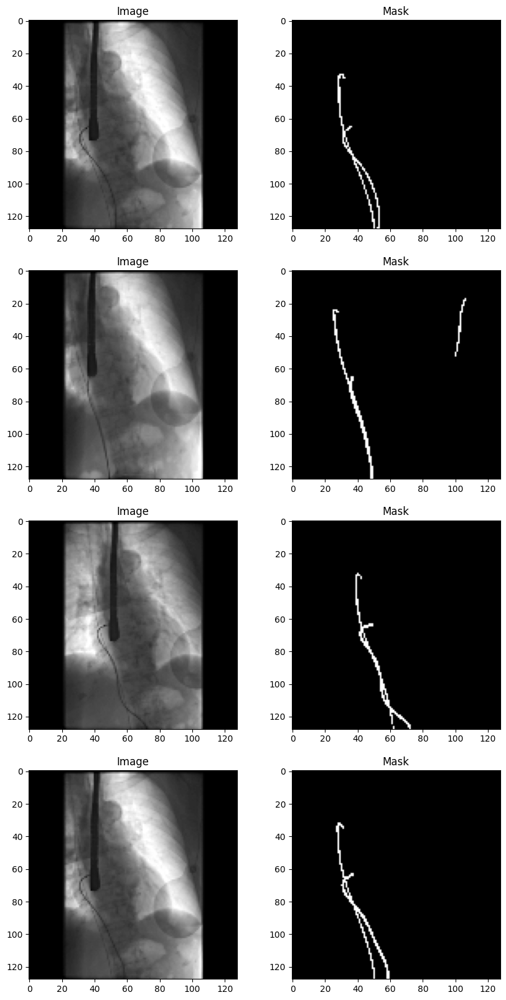

In [ ]:
import matplotlib.pyplot as plt

# Check the range of normalized images
print(f"Images - min: {train_dataset.images.min()}, max: {train_dataset.images.max()}, mean: {train_dataset.images.mean()}, std: {train_dataset.images.std()}")

# Visualize a few examples of images and masks
def visualize_samples(images, masks, num_samples=4):
    fig, axs = plt.subplots(num_samples, 2, figsize=(10, num_samples * 5))
    for i in range(num_samples):
        axs[i, 0].imshow(images[i, 0], cmap='gray')
        axs[i, 0].set_title('Image')
        axs[i, 1].imshow(masks[i, 0], cmap='gray')
        axs[i, 1].set_title('Mask')
    plt.show()

# Visualize samples from the training dataset
visualize_samples(train_dataset.images, train_dataset.masks)

# NOT **USED**

Streaming output truncated to the last 5000 lines.
 221 222 223 224 225 226 227 229 230 231 232 233 234 235 236 237 238 239
 240 241 242 243 245 246 247 248 250 251 252 253 254 255]
Loaded image from /content/drive/My Drive/T2/T2_Image_77_Fluoroscopy_Image_76.png with shape (128, 128, 4) and unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  34  35  36
  38  39  40  42  43  44  46  47  48  50  51  52  54  55  56  58  59  60
  62  63  64  65  67  68  69  70  71  72  73  75  76  77  78  79  80  81
  83  84  85  86  87  88  89  91  92  93  94  95  96  97  99 100 101 102
 103 104 105 107 108 109 110 111 112 113 115 116 117 118 119 120 121 123
 124 125 126 127 128 129 130 131 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 181
 182 183 184 185 186 187 188 189 19

INFO:root:Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!
[2024-07-27 09:03:24,614][<ipython-input-17-503ec0ce842a>] Start training!


Loaded pre-trained weights from /content/drive/My Drive/weightsT/dscnet_modelT.pth
Mask 441 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 237 - min: 0.0, max: 1.0, mean: 0.00384521484375
Mask 15 - min: 0.0, max: 1.0, mean: 0.0166015625
Mask 2 - min: 0.0, max: 1.0, mean: 0.06451416015625
Block 0 Output: 0.40365222096443176, 0.0, 7.041300296783447
Block 1 Output: 0.4145389497280121, 0.0, 10.477432250976562
Block 2 Output: 0.4341118037700653, 0.0, 5.0887250900268555
Block 3 Output: 0.4192047417163849, 0.0, 5.9680585861206055
Block 4 Output: 0.43066349625587463, 0.0, 3.240037441253662
Block 5 Output: 0.43699201941490173, 0.0, 4.263339042663574
Block 6 Output: 0.44341838359832764, 0.0, 26.723386764526367
Mask 470 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 349 - min: 0.0, max: 1.0, mean: 0.01165771484375
Mask 46 - min: 0.0, max: 1.0, mean: 0.01318359375
Mask 142 - min: 0.0, max: 1.0, mean: 0.065673828125
Block 0 Output: 0.4020732045173645, 0.0, 7.519192695617676
Block 1 Output: 0.

INFO:root:Epoch: [1/15], Train Loss: 1.121960, Val Loss: 1.080328, Train IoU: 0.017716, Val IoU: 0.015936, Train Dice: 0.034698, Val Dice: 0.031286, Best Dice: 0.031286
[2024-07-27 09:04:22,326][<ipython-input-17-503ec0ce842a>] Epoch: [1/15], Train Loss: 1.121960, Val Loss: 1.080328, Train IoU: 0.017716, Val IoU: 0.015936, Train Dice: 0.034698, Val Dice: 0.031286, Best Dice: 0.031286
[2024-07-27 09:04:22,326][<ipython-input-17-503ec0ce842a>] Epoch: [1/15], Train Loss: 1.121960, Val Loss: 1.080328, Train IoU: 0.017716, Val IoU: 0.015936, Train Dice: 0.034698, Val Dice: 0.031286, Best Dice: 0.031286
[2024-07-27 09:04:22,326][<ipython-input-17-503ec0ce842a>] Epoch: [1/15], Train Loss: 1.121960, Val Loss: 1.080328, Train IoU: 0.017716, Val IoU: 0.015936, Train Dice: 0.034698, Val Dice: 0.031286, Best Dice: 0.031286
[2024-07-27 09:04:22,326][<ipython-input-17-503ec0ce842a>] Epoch: [1/15], Train Loss: 1.121960, Val Loss: 1.080328, Train IoU: 0.017716, Val IoU: 0.015936, Train Dice: 0.034698,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 586 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 38 - min: 0.0, max: 1.0, mean: 0.0142822265625
Mask 732 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 214 - min: 0.0, max: 1.0, mean: 0.0133056640625
Block 0 Output: 0.40490761399269104, 0.0, 7.034449100494385
Block 1 Output: 0.4212033748626709, 0.0, 13.49941349029541
Block 2 Output: 0.4287744164466858, 0.0, 9.930374145507812
Block 3 Output: 0.4268939793109894, 0.0, 5.125216007232666
Block 4 Output: 0.43539002537727356, 0.0, 3.047855854034424
Block 5 Output: 0.444234162569046, 0.0, 14.475091934204102
Block 6 Output: 0.44363030791282654, 0.0, 27.408977508544922
Mask 196 - min: 0.0, max: 1.0, mean: 0.06103515625
Mask 92 - min: 0.0, max: 1.0, mean: 0.0152587890625
Mask 705 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 549 - min: 0.0, max: 1.0, mean: 0.0069580078125
Block 0 Output: 0.3885977864265442, 0.0, 5.6188507080078125
Block 1 Output: 0.40068721771

INFO:root:Epoch: [2/15], Train Loss: 1.066043, Val Loss: 1.032779, Train IoU: 0.017524, Val IoU: 0.018492, Train Dice: 0.034351, Val Dice: 0.036220, Best Dice: 0.036220
[2024-07-27 09:05:20,171][<ipython-input-17-503ec0ce842a>] Epoch: [2/15], Train Loss: 1.066043, Val Loss: 1.032779, Train IoU: 0.017524, Val IoU: 0.018492, Train Dice: 0.034351, Val Dice: 0.036220, Best Dice: 0.036220
[2024-07-27 09:05:20,171][<ipython-input-17-503ec0ce842a>] Epoch: [2/15], Train Loss: 1.066043, Val Loss: 1.032779, Train IoU: 0.017524, Val IoU: 0.018492, Train Dice: 0.034351, Val Dice: 0.036220, Best Dice: 0.036220
[2024-07-27 09:05:20,171][<ipython-input-17-503ec0ce842a>] Epoch: [2/15], Train Loss: 1.066043, Val Loss: 1.032779, Train IoU: 0.017524, Val IoU: 0.018492, Train Dice: 0.034351, Val Dice: 0.036220, Best Dice: 0.036220
[2024-07-27 09:05:20,171][<ipython-input-17-503ec0ce842a>] Epoch: [2/15], Train Loss: 1.066043, Val Loss: 1.032779, Train IoU: 0.017524, Val IoU: 0.018492, Train Dice: 0.034351,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 196 - min: 0.0, max: 1.0, mean: 0.06103515625
Mask 101 - min: 0.0, max: 1.0, mean: 0.0150146484375
Mask 466 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 251 - min: 0.0, max: 1.0, mean: 0.00494384765625
Block 0 Output: 0.3881908357143402, 0.0, 5.416292190551758
Block 1 Output: 0.39949455857276917, 0.0, 9.680338859558105
Block 2 Output: 0.41661709547042847, 0.0, 8.060529708862305
Block 3 Output: 0.42448073625564575, 0.0, 4.773817539215088
Block 4 Output: 0.43362006545066833, 0.0, 3.254770517349243
Block 5 Output: 0.43776628375053406, 0.0, 9.497450828552246
Block 6 Output: 0.4468122720718384, 0.0, 13.436922073364258
Mask 418 - min: 0.0, max: 1.0, mean: 0.04656982421875
Mask 549 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 432 - min: 0.0, max: 1.0, mean: 0.06451416015625
Mask 468 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.39175179600715637, 0.0, 5.483024597167969
Block 1 Output: 0.41048

INFO:root:Epoch: [3/15], Train Loss: 1.019722, Val Loss: 0.986687, Train IoU: 0.021684, Val IoU: 0.025741, Train Dice: 0.042361, Val Dice: 0.050092, Best Dice: 0.050092
[2024-07-27 09:06:17,809][<ipython-input-17-503ec0ce842a>] Epoch: [3/15], Train Loss: 1.019722, Val Loss: 0.986687, Train IoU: 0.021684, Val IoU: 0.025741, Train Dice: 0.042361, Val Dice: 0.050092, Best Dice: 0.050092
[2024-07-27 09:06:17,809][<ipython-input-17-503ec0ce842a>] Epoch: [3/15], Train Loss: 1.019722, Val Loss: 0.986687, Train IoU: 0.021684, Val IoU: 0.025741, Train Dice: 0.042361, Val Dice: 0.050092, Best Dice: 0.050092
[2024-07-27 09:06:17,809][<ipython-input-17-503ec0ce842a>] Epoch: [3/15], Train Loss: 1.019722, Val Loss: 0.986687, Train IoU: 0.021684, Val IoU: 0.025741, Train Dice: 0.042361, Val Dice: 0.050092, Best Dice: 0.050092
[2024-07-27 09:06:17,809][<ipython-input-17-503ec0ce842a>] Epoch: [3/15], Train Loss: 1.019722, Val Loss: 0.986687, Train IoU: 0.021684, Val IoU: 0.025741, Train Dice: 0.042361,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 460 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 717 - min: 0.0, max: 1.0, mean: 0.0074462890625
Mask 399 - min: 0.0, max: 1.0, mean: 0.0751953125
Mask 737 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.401803195476532, 0.0, 6.0553693771362305
Block 1 Output: 0.42066308856010437, 0.0, 12.069655418395996
Block 2 Output: 0.4244735836982727, 0.0, 10.4306640625
Block 3 Output: 0.4235251545906067, 0.0, 5.172910690307617
Block 4 Output: 0.431831419467926, 0.0, 4.700342655181885
Block 5 Output: 0.4411167502403259, 0.0, 16.646604537963867
Block 6 Output: 0.4453619718551636, 0.0, 38.14989471435547
Mask 47 - min: 0.0, max: 1.0, mean: 0.019287109375
Mask 15 - min: 0.0, max: 1.0, mean: 0.0166015625
Mask 11 - min: 0.0, max: 1.0, mean: 0.01605224609375
Mask 168 - min: 0.0, max: 1.0, mean: 0.0487060546875
Block 0 Output: 0.3912197947502136, 0.0, 5.846768379211426
Block 1 Output: 0.4085398316383362, 0.0

INFO:root:Epoch: [4/15], Train Loss: 0.973070, Val Loss: 0.939762, Train IoU: 0.032362, Val IoU: 0.039692, Train Dice: 0.062558, Val Dice: 0.076196, Best Dice: 0.076196
[2024-07-27 09:07:15,394][<ipython-input-17-503ec0ce842a>] Epoch: [4/15], Train Loss: 0.973070, Val Loss: 0.939762, Train IoU: 0.032362, Val IoU: 0.039692, Train Dice: 0.062558, Val Dice: 0.076196, Best Dice: 0.076196
[2024-07-27 09:07:15,394][<ipython-input-17-503ec0ce842a>] Epoch: [4/15], Train Loss: 0.973070, Val Loss: 0.939762, Train IoU: 0.032362, Val IoU: 0.039692, Train Dice: 0.062558, Val Dice: 0.076196, Best Dice: 0.076196
[2024-07-27 09:07:15,394][<ipython-input-17-503ec0ce842a>] Epoch: [4/15], Train Loss: 0.973070, Val Loss: 0.939762, Train IoU: 0.032362, Val IoU: 0.039692, Train Dice: 0.062558, Val Dice: 0.076196, Best Dice: 0.076196
[2024-07-27 09:07:15,394][<ipython-input-17-503ec0ce842a>] Epoch: [4/15], Train Loss: 0.973070, Val Loss: 0.939762, Train IoU: 0.032362, Val IoU: 0.039692, Train Dice: 0.062558,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 716 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 248 - min: 0.0, max: 1.0, mean: 0.002197265625
Mask 84 - min: 0.0, max: 1.0, mean: 0.01739501953125
Mask 341 - min: 0.0, max: 1.0, mean: 0.01336669921875
Block 0 Output: 0.4078853726387024, 0.0, 6.084879398345947
Block 1 Output: 0.41714394092559814, 0.0, 15.524283409118652
Block 2 Output: 0.42145806550979614, 0.0, 12.408052444458008
Block 3 Output: 0.42238879203796387, 0.0, 5.56881856918335
Block 4 Output: 0.4313369393348694, 0.0, 4.168862342834473
Block 5 Output: 0.43677058815956116, 0.0, 20.98306655883789
Block 6 Output: 0.4461238980293274, 0.0, 32.70523452758789
Mask 568 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 363 - min: 0.0, max: 1.0, mean: 0.0145263671875
Mask 300 - min: 0.0, max: 1.0, mean: 0.01904296875
Mask 605 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.4053674042224884, 0.0, 5.913525104522705
Block 1 Output: 0.4181416

INFO:root:Epoch: [5/15], Train Loss: 0.927486, Val Loss: 0.895118, Train IoU: 0.043911, Val IoU: 0.044762, Train Dice: 0.083879, Val Dice: 0.085442, Best Dice: 0.085442
[2024-07-27 09:08:12,959][<ipython-input-17-503ec0ce842a>] Epoch: [5/15], Train Loss: 0.927486, Val Loss: 0.895118, Train IoU: 0.043911, Val IoU: 0.044762, Train Dice: 0.083879, Val Dice: 0.085442, Best Dice: 0.085442
[2024-07-27 09:08:12,959][<ipython-input-17-503ec0ce842a>] Epoch: [5/15], Train Loss: 0.927486, Val Loss: 0.895118, Train IoU: 0.043911, Val IoU: 0.044762, Train Dice: 0.083879, Val Dice: 0.085442, Best Dice: 0.085442
[2024-07-27 09:08:12,959][<ipython-input-17-503ec0ce842a>] Epoch: [5/15], Train Loss: 0.927486, Val Loss: 0.895118, Train IoU: 0.043911, Val IoU: 0.044762, Train Dice: 0.083879, Val Dice: 0.085442, Best Dice: 0.085442
[2024-07-27 09:08:12,959][<ipython-input-17-503ec0ce842a>] Epoch: [5/15], Train Loss: 0.927486, Val Loss: 0.895118, Train IoU: 0.043911, Val IoU: 0.044762, Train Dice: 0.083879,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 606 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 140 - min: 0.0, max: 1.0, mean: 0.04248046875
Mask 699 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 257 - min: 0.0, max: 1.0, mean: 0.00750732421875
Block 0 Output: 0.402385950088501, 0.0, 5.765502452850342
Block 1 Output: 0.4147554039955139, 0.0, 14.156798362731934
Block 2 Output: 0.42121365666389465, 0.0, 10.754801750183105
Block 3 Output: 0.42244434356689453, 0.0, 5.4021735191345215
Block 4 Output: 0.4313085079193115, 0.0, 3.931771993637085
Block 5 Output: 0.4400344491004944, 0.0, 19.058929443359375
Block 6 Output: 0.44771355390548706, 0.0, 34.50739669799805
Mask 466 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 210 - min: 0.0, max: 1.0, mean: 0.0582275390625
Mask 358 - min: 0.0, max: 1.0, mean: 0.01446533203125
Mask 380 - min: 0.0, max: 1.0, mean: 0.01470947265625
Block 0 Output: 0.40687841176986694, 0.0, 5.78508996963501
Block 1 Output: 0.41721153

INFO:root:Epoch: [6/15], Train Loss: 0.882256, Val Loss: 0.848827, Train IoU: 0.063053, Val IoU: 0.088385, Train Dice: 0.118101, Val Dice: 0.161895, Best Dice: 0.161895
[2024-07-27 09:09:10,722][<ipython-input-17-503ec0ce842a>] Epoch: [6/15], Train Loss: 0.882256, Val Loss: 0.848827, Train IoU: 0.063053, Val IoU: 0.088385, Train Dice: 0.118101, Val Dice: 0.161895, Best Dice: 0.161895
[2024-07-27 09:09:10,722][<ipython-input-17-503ec0ce842a>] Epoch: [6/15], Train Loss: 0.882256, Val Loss: 0.848827, Train IoU: 0.063053, Val IoU: 0.088385, Train Dice: 0.118101, Val Dice: 0.161895, Best Dice: 0.161895
[2024-07-27 09:09:10,722][<ipython-input-17-503ec0ce842a>] Epoch: [6/15], Train Loss: 0.882256, Val Loss: 0.848827, Train IoU: 0.063053, Val IoU: 0.088385, Train Dice: 0.118101, Val Dice: 0.161895, Best Dice: 0.161895
[2024-07-27 09:09:10,722][<ipython-input-17-503ec0ce842a>] Epoch: [6/15], Train Loss: 0.882256, Val Loss: 0.848827, Train IoU: 0.063053, Val IoU: 0.088385, Train Dice: 0.118101,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 680 - min: 0.0, max: 1.0, mean: 0.0074462890625
Mask 584 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 769 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 132 - min: 0.0, max: 1.0, mean: 0.04864501953125
Block 0 Output: 0.4005560874938965, 0.0, 5.584197521209717
Block 1 Output: 0.41707655787467957, 0.0, 9.163400650024414
Block 2 Output: 0.41866984963417053, 0.0, 9.97354507446289
Block 3 Output: 0.4212331771850586, 0.0, 4.711904048919678
Block 4 Output: 0.43096762895584106, 0.0, 4.70102596282959
Block 5 Output: 0.4443313479423523, 0.0, 6.357545375823975
Block 6 Output: 0.46019354462623596, 0.0, 21.8248348236084
Mask 297 - min: 0.0, max: 1.0, mean: 0.0147705078125
Mask 160 - min: 0.0, max: 1.0, mean: 0.0576171875
Mask 331 - min: 0.0, max: 1.0, mean: 0.03955078125
Mask 815 - min: 0.0, max: 1.0, mean: 0.0072021484375
Block 0 Output: 0.4014838933944702, 0.0, 4.95826530456543
Block 1 Output: 0.41569769382476

INFO:root:Epoch: [7/15], Train Loss: 0.834552, Val Loss: 0.801392, Train IoU: 0.090267, Val IoU: 0.095767, Train Dice: 0.164965, Val Dice: 0.174156, Best Dice: 0.174156
[2024-07-27 09:10:08,451][<ipython-input-17-503ec0ce842a>] Epoch: [7/15], Train Loss: 0.834552, Val Loss: 0.801392, Train IoU: 0.090267, Val IoU: 0.095767, Train Dice: 0.164965, Val Dice: 0.174156, Best Dice: 0.174156
[2024-07-27 09:10:08,451][<ipython-input-17-503ec0ce842a>] Epoch: [7/15], Train Loss: 0.834552, Val Loss: 0.801392, Train IoU: 0.090267, Val IoU: 0.095767, Train Dice: 0.164965, Val Dice: 0.174156, Best Dice: 0.174156
[2024-07-27 09:10:08,451][<ipython-input-17-503ec0ce842a>] Epoch: [7/15], Train Loss: 0.834552, Val Loss: 0.801392, Train IoU: 0.090267, Val IoU: 0.095767, Train Dice: 0.164965, Val Dice: 0.174156, Best Dice: 0.174156
[2024-07-27 09:10:08,451][<ipython-input-17-503ec0ce842a>] Epoch: [7/15], Train Loss: 0.834552, Val Loss: 0.801392, Train IoU: 0.090267, Val IoU: 0.095767, Train Dice: 0.164965,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 401 - min: 0.0, max: 1.0, mean: 0.07476806640625
Mask 539 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 828 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 382 - min: 0.0, max: 1.0, mean: 0.0142822265625
Block 0 Output: 0.3899441957473755, 0.0, 5.973154067993164
Block 1 Output: 0.40840065479278564, 0.0, 7.863482475280762
Block 2 Output: 0.4136136770248413, 0.0, 6.666041851043701
Block 3 Output: 0.42194226384162903, 0.0, 4.690782070159912
Block 4 Output: 0.4321199059486389, 0.0, 3.869624614715576
Block 5 Output: 0.44354718923568726, 0.0, 5.771356105804443
Block 6 Output: 0.46439772844314575, 0.0, 17.203262329101562
Mask 819 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 562 - min: 0.0, max: 1.0, mean: 0.007568359375
Mask 691 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 329 - min: 0.0, max: 1.0, mean: 0.014892578125
Block 0 Output: 0.4007878303527832, 0.0, 6.57745361328125
Block 1 Output: 0.41461116

INFO:root:Epoch: [8/15], Train Loss: 0.791391, Val Loss: 0.758028, Train IoU: 0.104180, Val IoU: 0.112387, Train Dice: 0.187815, Val Dice: 0.201363, Best Dice: 0.201363
[2024-07-27 09:11:06,010][<ipython-input-17-503ec0ce842a>] Epoch: [8/15], Train Loss: 0.791391, Val Loss: 0.758028, Train IoU: 0.104180, Val IoU: 0.112387, Train Dice: 0.187815, Val Dice: 0.201363, Best Dice: 0.201363
[2024-07-27 09:11:06,010][<ipython-input-17-503ec0ce842a>] Epoch: [8/15], Train Loss: 0.791391, Val Loss: 0.758028, Train IoU: 0.104180, Val IoU: 0.112387, Train Dice: 0.187815, Val Dice: 0.201363, Best Dice: 0.201363
[2024-07-27 09:11:06,010][<ipython-input-17-503ec0ce842a>] Epoch: [8/15], Train Loss: 0.791391, Val Loss: 0.758028, Train IoU: 0.104180, Val IoU: 0.112387, Train Dice: 0.187815, Val Dice: 0.201363, Best Dice: 0.201363
[2024-07-27 09:11:06,010][<ipython-input-17-503ec0ce842a>] Epoch: [8/15], Train Loss: 0.791391, Val Loss: 0.758028, Train IoU: 0.104180, Val IoU: 0.112387, Train Dice: 0.187815,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 599 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 804 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 717 - min: 0.0, max: 1.0, mean: 0.0074462890625
Mask 117 - min: 0.0, max: 1.0, mean: 0.05352783203125
Block 0 Output: 0.40036141872406006, 0.0, 5.714468955993652
Block 1 Output: 0.41552236676216125, 0.0, 7.573261737823486
Block 2 Output: 0.4158739149570465, 0.0, 7.09468936920166
Block 3 Output: 0.42105549573898315, 0.0, 4.58091926574707
Block 4 Output: 0.4323278069496155, 0.0, 4.149258136749268
Block 5 Output: 0.4451882839202881, 0.0, 6.148080825805664
Block 6 Output: 0.4602816700935364, 0.0, 18.519638061523438
Mask 184 - min: 0.0, max: 1.0, mean: 0.063232421875
Mask 74 - min: 0.0, max: 1.0, mean: 0.01336669921875
Mask 805 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 763 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.3920177221298218, 0.0, 5.418854236602783
Block 1 Output: 0.407436549663

INFO:root:Epoch: [9/15], Train Loss: 0.750375, Val Loss: 0.721212, Train IoU: 0.117593, Val IoU: 0.119210, Train Dice: 0.209383, Val Dice: 0.212241, Best Dice: 0.212241
[2024-07-27 09:12:03,645][<ipython-input-17-503ec0ce842a>] Epoch: [9/15], Train Loss: 0.750375, Val Loss: 0.721212, Train IoU: 0.117593, Val IoU: 0.119210, Train Dice: 0.209383, Val Dice: 0.212241, Best Dice: 0.212241
[2024-07-27 09:12:03,645][<ipython-input-17-503ec0ce842a>] Epoch: [9/15], Train Loss: 0.750375, Val Loss: 0.721212, Train IoU: 0.117593, Val IoU: 0.119210, Train Dice: 0.209383, Val Dice: 0.212241, Best Dice: 0.212241
[2024-07-27 09:12:03,645][<ipython-input-17-503ec0ce842a>] Epoch: [9/15], Train Loss: 0.750375, Val Loss: 0.721212, Train IoU: 0.117593, Val IoU: 0.119210, Train Dice: 0.209383, Val Dice: 0.212241, Best Dice: 0.212241
[2024-07-27 09:12:03,645][<ipython-input-17-503ec0ce842a>] Epoch: [9/15], Train Loss: 0.750375, Val Loss: 0.721212, Train IoU: 0.117593, Val IoU: 0.119210, Train Dice: 0.209383,

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 256 - min: 0.0, max: 1.0, mean: 0.00823974609375
Mask 771 - min: 0.0, max: 1.0, mean: 0.007568359375
Mask 200 - min: 0.0, max: 1.0, mean: 0.06427001953125
Mask 817 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.39743903279304504, 0.0, 5.380784511566162
Block 1 Output: 0.41246581077575684, 0.0, 8.244795799255371
Block 2 Output: 0.41343069076538086, 0.0, 6.530847072601318
Block 3 Output: 0.4195554256439209, 0.0, 4.227192401885986
Block 4 Output: 0.4306796193122864, 0.0, 4.967309474945068
Block 5 Output: 0.44640475511550903, 0.0, 5.939947128295898
Block 6 Output: 0.46608418226242065, 0.0, 19.20982551574707
Mask 600 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 293 - min: 0.0, max: 1.0, mean: 0.017822265625
Mask 653 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 307 - min: 0.0, max: 1.0, mean: 0.07037353515625
Block 0 Output: 0.40258824825286865, 0.0, 5.818297863006592
Block 1 Output: 0.41

INFO:root:Epoch: [10/15], Train Loss: 0.712410, Val Loss: 0.689031, Train IoU: 0.129772, Val IoU: 0.139822, Train Dice: 0.228741, Val Dice: 0.244427, Best Dice: 0.244427
[2024-07-27 09:13:01,334][<ipython-input-17-503ec0ce842a>] Epoch: [10/15], Train Loss: 0.712410, Val Loss: 0.689031, Train IoU: 0.129772, Val IoU: 0.139822, Train Dice: 0.228741, Val Dice: 0.244427, Best Dice: 0.244427
[2024-07-27 09:13:01,334][<ipython-input-17-503ec0ce842a>] Epoch: [10/15], Train Loss: 0.712410, Val Loss: 0.689031, Train IoU: 0.129772, Val IoU: 0.139822, Train Dice: 0.228741, Val Dice: 0.244427, Best Dice: 0.244427
[2024-07-27 09:13:01,334][<ipython-input-17-503ec0ce842a>] Epoch: [10/15], Train Loss: 0.712410, Val Loss: 0.689031, Train IoU: 0.129772, Val IoU: 0.139822, Train Dice: 0.228741, Val Dice: 0.244427, Best Dice: 0.244427
[2024-07-27 09:13:01,334][<ipython-input-17-503ec0ce842a>] Epoch: [10/15], Train Loss: 0.712410, Val Loss: 0.689031, Train IoU: 0.129772, Val IoU: 0.139822, Train Dice: 0.22

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 633 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 367 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 490 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 717 - min: 0.0, max: 1.0, mean: 0.0074462890625
Block 0 Output: 0.4004998803138733, 0.0, 5.843461990356445
Block 1 Output: 0.4149243235588074, 0.0, 7.024133205413818
Block 2 Output: 0.4123440384864807, 0.0, 7.381561279296875
Block 3 Output: 0.41819292306900024, 0.0, 4.818915843963623
Block 4 Output: 0.43071722984313965, 0.0, 5.169044494628906
Block 5 Output: 0.4459800124168396, 0.0, 6.022909641265869
Block 6 Output: 0.4628090560436249, 0.0, 22.580629348754883
Mask 689 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 749 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 206 - min: 0.0, max: 1.0, mean: 0.01806640625
Mask 276 - min: 0.0, max: 1.0, mean: 0.01214599609375
Block 0 Output: 0.4040859639644623, 0.0, 5.859812259674072
Block 1 Output: 0.41376948356628

INFO:root:Epoch: [11/15], Train Loss: 0.676723, Val Loss: 0.652162, Train IoU: 0.141048, Val IoU: 0.143165, Train Dice: 0.246024, Val Dice: 0.249338, Best Dice: 0.249338
[2024-07-27 09:13:58,971][<ipython-input-17-503ec0ce842a>] Epoch: [11/15], Train Loss: 0.676723, Val Loss: 0.652162, Train IoU: 0.141048, Val IoU: 0.143165, Train Dice: 0.246024, Val Dice: 0.249338, Best Dice: 0.249338
[2024-07-27 09:13:58,971][<ipython-input-17-503ec0ce842a>] Epoch: [11/15], Train Loss: 0.676723, Val Loss: 0.652162, Train IoU: 0.141048, Val IoU: 0.143165, Train Dice: 0.246024, Val Dice: 0.249338, Best Dice: 0.249338
[2024-07-27 09:13:58,971][<ipython-input-17-503ec0ce842a>] Epoch: [11/15], Train Loss: 0.676723, Val Loss: 0.652162, Train IoU: 0.141048, Val IoU: 0.143165, Train Dice: 0.246024, Val Dice: 0.249338, Best Dice: 0.249338
[2024-07-27 09:13:58,971][<ipython-input-17-503ec0ce842a>] Epoch: [11/15], Train Loss: 0.676723, Val Loss: 0.652162, Train IoU: 0.141048, Val IoU: 0.143165, Train Dice: 0.24

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 504 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 270 - min: 0.0, max: 1.0, mean: 0.01507568359375
Mask 723 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 557 - min: 0.0, max: 1.0, mean: 0.0072021484375
Block 0 Output: 0.40000995993614197, 0.0, 5.957025051116943
Block 1 Output: 0.41414716839790344, 0.0, 7.040812015533447
Block 2 Output: 0.4098341166973114, 0.0, 6.728243827819824
Block 3 Output: 0.4186255633831024, 0.0, 5.307383060455322
Block 4 Output: 0.430891752243042, 0.0, 5.757240295410156
Block 5 Output: 0.4452931880950928, 0.0, 5.934836387634277
Block 6 Output: 0.4636525511741638, 0.0, 23.871278762817383
Mask 266 - min: 0.0, max: 1.0, mean: 0.09832763671875
Mask 819 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 281 - min: 0.0, max: 1.0, mean: 0.0147705078125
Mask 425 - min: 0.0, max: 1.0, mean: 0.0462646484375
Block 0 Output: 0.3942391276359558, 0.0, 6.314998149871826
Block 1 Output: 0.4105202

INFO:root:Epoch: [12/15], Train Loss: 0.643442, Val Loss: 0.620346, Train IoU: 0.152200, Val IoU: 0.144860, Train Dice: 0.262735, Val Dice: 0.252110, Best Dice: 0.252110
[2024-07-27 09:14:56,553][<ipython-input-17-503ec0ce842a>] Epoch: [12/15], Train Loss: 0.643442, Val Loss: 0.620346, Train IoU: 0.152200, Val IoU: 0.144860, Train Dice: 0.262735, Val Dice: 0.252110, Best Dice: 0.252110
[2024-07-27 09:14:56,553][<ipython-input-17-503ec0ce842a>] Epoch: [12/15], Train Loss: 0.643442, Val Loss: 0.620346, Train IoU: 0.152200, Val IoU: 0.144860, Train Dice: 0.262735, Val Dice: 0.252110, Best Dice: 0.252110
[2024-07-27 09:14:56,553][<ipython-input-17-503ec0ce842a>] Epoch: [12/15], Train Loss: 0.643442, Val Loss: 0.620346, Train IoU: 0.152200, Val IoU: 0.144860, Train Dice: 0.262735, Val Dice: 0.252110, Best Dice: 0.252110
[2024-07-27 09:14:56,553][<ipython-input-17-503ec0ce842a>] Epoch: [12/15], Train Loss: 0.643442, Val Loss: 0.620346, Train IoU: 0.152200, Val IoU: 0.144860, Train Dice: 0.26

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 169 - min: 0.0, max: 1.0, mean: 0.02789306640625
Mask 835 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 557 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 249 - min: 0.0, max: 1.0, mean: 0.0054931640625
Block 0 Output: 0.3946906626224518, 0.0, 6.042289733886719
Block 1 Output: 0.4124094843864441, 0.0, 7.13314151763916
Block 2 Output: 0.41064536571502686, 0.0, 8.62468433380127
Block 3 Output: 0.41870737075805664, 0.0, 7.074650764465332
Block 4 Output: 0.4303443431854248, 0.0, 5.437304973602295
Block 5 Output: 0.44587257504463196, 0.0, 5.216219902038574
Block 6 Output: 0.4694952666759491, 0.0, 21.187984466552734
Mask 595 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 55 - min: 0.0, max: 1.0, mean: 0.01336669921875
Mask 344 - min: 0.0, max: 1.0, mean: 0.0159912109375
Mask 702 - min: 0.0, max: 1.0, mean: 0.007080078125
Block 0 Output: 0.40205851197242737, 0.0, 6.405618190765381
Block 1 Output: 0.41388237476

INFO:root:Epoch: [13/15], Train Loss: 0.612325, Val Loss: 0.589758, Train IoU: 0.162583, Val IoU: 0.168953, Train Dice: 0.278226, Val Dice: 0.287744, Best Dice: 0.287744
[2024-07-27 09:15:54,091][<ipython-input-17-503ec0ce842a>] Epoch: [13/15], Train Loss: 0.612325, Val Loss: 0.589758, Train IoU: 0.162583, Val IoU: 0.168953, Train Dice: 0.278226, Val Dice: 0.287744, Best Dice: 0.287744
[2024-07-27 09:15:54,091][<ipython-input-17-503ec0ce842a>] Epoch: [13/15], Train Loss: 0.612325, Val Loss: 0.589758, Train IoU: 0.162583, Val IoU: 0.168953, Train Dice: 0.278226, Val Dice: 0.287744, Best Dice: 0.287744
[2024-07-27 09:15:54,091][<ipython-input-17-503ec0ce842a>] Epoch: [13/15], Train Loss: 0.612325, Val Loss: 0.589758, Train IoU: 0.162583, Val IoU: 0.168953, Train Dice: 0.278226, Val Dice: 0.287744, Best Dice: 0.287744
[2024-07-27 09:15:54,091][<ipython-input-17-503ec0ce842a>] Epoch: [13/15], Train Loss: 0.612325, Val Loss: 0.589758, Train IoU: 0.162583, Val IoU: 0.168953, Train Dice: 0.27

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 787 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 32 - min: 0.0, max: 1.0, mean: 0.01483154296875
Mask 210 - min: 0.0, max: 1.0, mean: 0.0582275390625
Mask 544 - min: 0.0, max: 1.0, mean: 0.00714111328125
Block 0 Output: 0.401265412569046, 0.0, 6.360208988189697
Block 1 Output: 0.4128913879394531, 0.0, 8.230772018432617
Block 2 Output: 0.40847229957580566, 0.0, 7.034156322479248
Block 3 Output: 0.4179867208003998, 0.0, 5.480626106262207
Block 4 Output: 0.4297490417957306, 0.0, 5.3364057540893555
Block 5 Output: 0.4445319175720215, 0.0, 5.865514278411865
Block 6 Output: 0.4663005471229553, 0.0, 24.330610275268555
Mask 563 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 275 - min: 0.0, max: 1.0, mean: 0.013671875
Mask 528 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 468 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.3996134400367737, 0.0, 5.372698783874512
Block 1 Output: 0.414004266262

INFO:root:Epoch: [14/15], Train Loss: 0.583215, Val Loss: 0.561514, Train IoU: 0.173591, Val IoU: 0.177213, Train Dice: 0.294028, Val Dice: 0.299667, Best Dice: 0.299667
[2024-07-27 09:16:51,657][<ipython-input-17-503ec0ce842a>] Epoch: [14/15], Train Loss: 0.583215, Val Loss: 0.561514, Train IoU: 0.173591, Val IoU: 0.177213, Train Dice: 0.294028, Val Dice: 0.299667, Best Dice: 0.299667
[2024-07-27 09:16:51,657][<ipython-input-17-503ec0ce842a>] Epoch: [14/15], Train Loss: 0.583215, Val Loss: 0.561514, Train IoU: 0.173591, Val IoU: 0.177213, Train Dice: 0.294028, Val Dice: 0.299667, Best Dice: 0.299667
[2024-07-27 09:16:51,657][<ipython-input-17-503ec0ce842a>] Epoch: [14/15], Train Loss: 0.583215, Val Loss: 0.561514, Train IoU: 0.173591, Val IoU: 0.177213, Train Dice: 0.294028, Val Dice: 0.299667, Best Dice: 0.299667
[2024-07-27 09:16:51,657][<ipython-input-17-503ec0ce842a>] Epoch: [14/15], Train Loss: 0.583215, Val Loss: 0.561514, Train IoU: 0.173591, Val IoU: 0.177213, Train Dice: 0.29

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 290 - min: 0.0, max: 1.0, mean: 0.01800537109375
Mask 496 - min: 0.0, max: 1.0, mean: 0.00750732421875
Mask 729 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 44 - min: 0.0, max: 1.0, mean: 0.01336669921875
Block 0 Output: 0.3990170955657959, 0.0, 6.2384443283081055
Block 1 Output: 0.41342562437057495, 0.0, 8.635313034057617
Block 2 Output: 0.4014720916748047, 0.0, 9.330445289611816
Block 3 Output: 0.4172612428665161, 0.0, 5.071190357208252
Block 4 Output: 0.4290478229522705, 0.0, 5.458445072174072
Block 5 Output: 0.4433801770210266, 0.0, 5.69178581237793
Block 6 Output: 0.46821779012680054, 0.0, 27.122909545898438
Mask 360 - min: 0.0, max: 1.0, mean: 0.01336669921875
Mask 258 - min: 0.0, max: 1.0, mean: 0.0078125
Mask 545 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 793 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.3966684937477112, 0.0, 5.908542633056641
Block 1 Output: 0.413464486598

INFO:root:Epoch: [15/15], Train Loss: 0.556456, Val Loss: 0.538517, Train IoU: 0.183360, Val IoU: 0.173388, Train Dice: 0.308274, Val Dice: 0.294075, Best Dice: 0.299667
[2024-07-27 09:17:49,015][<ipython-input-17-503ec0ce842a>] Epoch: [15/15], Train Loss: 0.556456, Val Loss: 0.538517, Train IoU: 0.183360, Val IoU: 0.173388, Train Dice: 0.308274, Val Dice: 0.294075, Best Dice: 0.299667
[2024-07-27 09:17:49,015][<ipython-input-17-503ec0ce842a>] Epoch: [15/15], Train Loss: 0.556456, Val Loss: 0.538517, Train IoU: 0.183360, Val IoU: 0.173388, Train Dice: 0.308274, Val Dice: 0.294075, Best Dice: 0.299667
[2024-07-27 09:17:49,015][<ipython-input-17-503ec0ce842a>] Epoch: [15/15], Train Loss: 0.556456, Val Loss: 0.538517, Train IoU: 0.183360, Val IoU: 0.173388, Train Dice: 0.308274, Val Dice: 0.294075, Best Dice: 0.299667
[2024-07-27 09:17:49,015][<ipython-input-17-503ec0ce842a>] Epoch: [15/15], Train Loss: 0.556456, Val Loss: 0.538517, Train IoU: 0.183360, Val IoU: 0.173388, Train Dice: 0.30

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Loaded model from /content/drive/My Drive/weightsT/dscnet_modelT_max.pth
DSCNet(
  (relu): ReLU(inplace=True)
  (conv00): EncoderConv(
    (conv): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (gn): GroupNorm(16, 64, eps=1e-05, affine=True)
    (relu): ReLU(inplace=True)
  )
  (conv0x): DSConv(
    (offset_conv): Conv2d(1, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (dsc_conv_x): Conv2d(1, 64, kernel_size=(3, 1), stride=(3, 1))
    (dsc_conv_y): Conv2d(1, 64, kernel_size=(1, 3), stride=(1, 3))
    (gn): GroupNorm(16, 64, eps=1e-05, affine=True)
    (relu): ReLU(inplace=True)
  )
  (conv0y): DSConv(
    (offset_conv): Conv2d(1, 6, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (bn): BatchNorm2d(6, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (dsc_conv_x): Conv

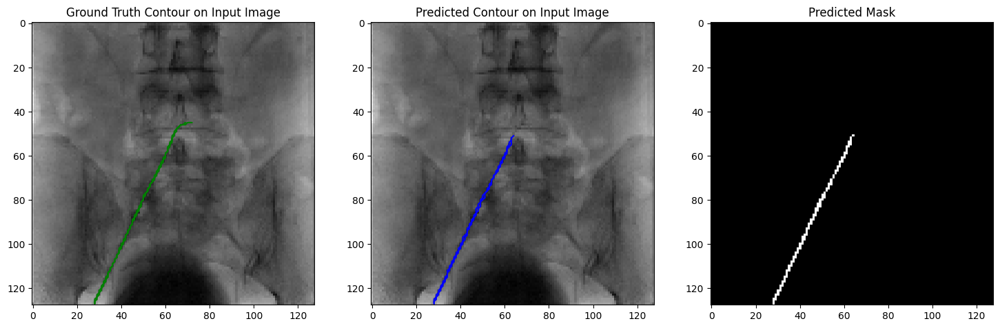

Mask 594 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.3954850435256958, 0.0, 5.340729236602783
Block 1 Output: 0.4147709608078003, 0.0, 6.885043144226074
Block 2 Output: 0.4062626361846924, 0.0, 7.682348251342773
Block 3 Output: 0.41783440113067627, 0.0, 5.278428554534912
Block 4 Output: 0.42911478877067566, 0.0, 5.396687030792236
Block 5 Output: 0.4446670711040497, 0.0, 5.4390668869018555
Block 6 Output: 0.46820950508117676, 0.0, 25.032926559448242
Prediction 28: Model output min 0.0, max 1.0, mean 0.00714111328125
Prediction 28: Ground truth mask min 0.0, max 1.0, mean 0.00726318359375


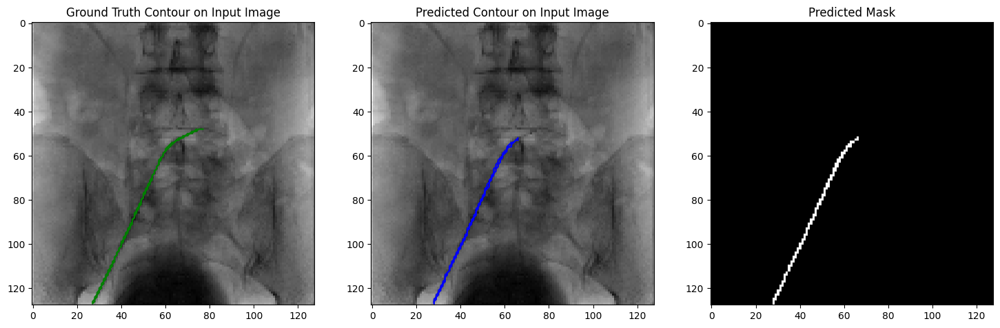

Mask 158 - min: 0.0, max: 1.0, mean: 0.05084228515625
Block 0 Output: 0.38810837268829346, 0.0, 6.236656188964844
Block 1 Output: 0.41190946102142334, 0.0, 8.707597732543945
Block 2 Output: 0.4072979986667633, 0.0, 7.929725170135498
Block 3 Output: 0.41913092136383057, 0.0, 3.846292734146118
Block 4 Output: 0.4298304617404938, 0.0, 3.6206214427948
Block 5 Output: 0.44160956144332886, 0.0, 4.631773471832275
Block 6 Output: 0.4636836349964142, 0.0, 14.429817199707031
Prediction 6: Model output min 0.0, max 1.0, mean 0.0345458984375
Prediction 6: Ground truth mask min 0.0, max 1.0, mean 0.05084228515625


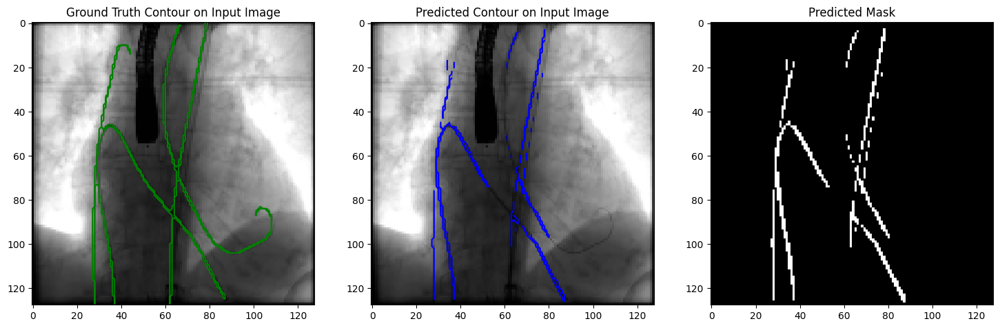

Mask 347 - min: 0.0, max: 1.0, mean: 0.012451171875
Block 0 Output: 0.38648056983947754, 0.0, 4.560213088989258
Block 1 Output: 0.4132121503353119, 0.0, 5.873805046081543
Block 2 Output: 0.4036666452884674, 0.0, 6.276560306549072
Block 3 Output: 0.4185769557952881, 0.0, 3.9261667728424072
Block 4 Output: 0.4289267957210541, 0.0, 4.324464321136475
Block 5 Output: 0.4431525468826294, 0.0, 4.9396257400512695
Block 6 Output: 0.4692957401275635, 0.0, 23.9320068359375
Prediction 70: Model output min 0.0, max 1.0, mean 0.00958251953125
Prediction 70: Ground truth mask min 0.0, max 1.0, mean 0.012451171875


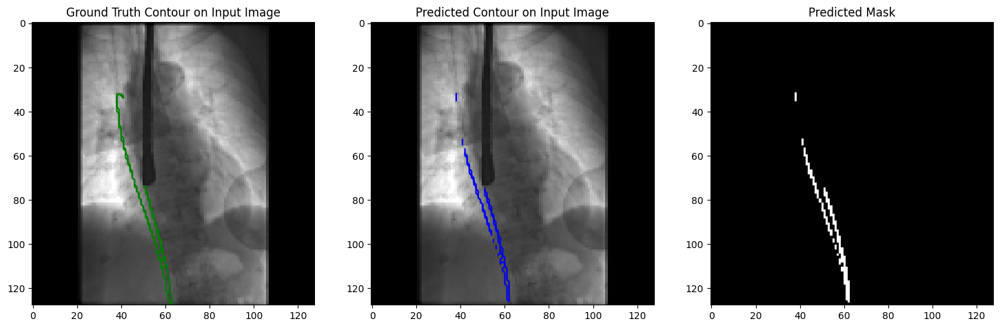

Mask 604 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.3958084285259247, 0.0, 5.483917236328125
Block 1 Output: 0.41485345363616943, 0.0, 7.203722953796387
Block 2 Output: 0.40656253695487976, 0.0, 7.807589054107666
Block 3 Output: 0.4179643988609314, 0.0, 5.351704120635986
Block 4 Output: 0.42911773920059204, 0.0, 5.487947463989258
Block 5 Output: 0.4446781873703003, 0.0, 5.591764450073242
Block 6 Output: 0.46815362572669983, 0.0, 25.874622344970703
Prediction 62: Model output min 0.0, max 1.0, mean 0.00689697265625
Prediction 62: Ground truth mask min 0.0, max 1.0, mean 0.00726318359375


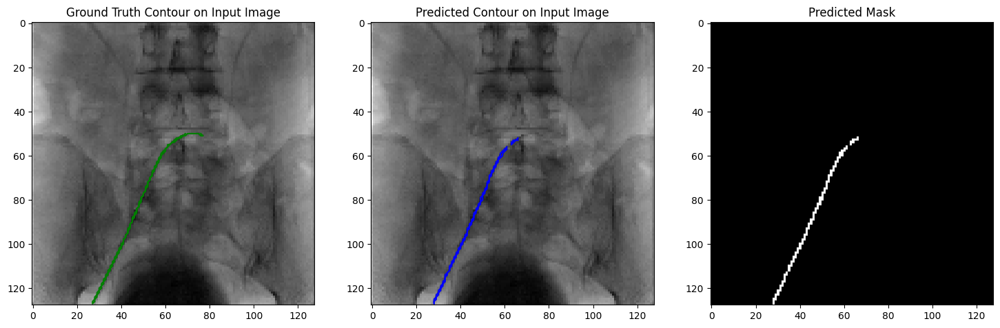

finish!
Mean IoU: 0.636432433128357, Mean Dice: 0.775094473361969


TypeError: listdir: path should be string, bytes, os.PathLike, integer or None, not list

In [ ]:
import os
import torch
import logging
import numpy as np
from os.path import join
import SimpleITK as sitk
from datetime import datetime
from torch.utils.data import DataLoader, Dataset, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
import matplotlib.pyplot as plt
import warnings
import cv2
import torch.optim as optim
import torch.nn as nn
import torch.nn.init as init
import random
import json
import pdb



warnings.filterwarnings("ignore")

# AverageMeter to calculate the mean in the process
class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class CrossEntropyLoss(nn.Module):
    def __init__(self):
        super(CrossEntropyLoss, self).__init__()

    def forward(self, y_true, y_pred):
        smooth = 1e-6
        return -torch.mean(y_true * torch.log(y_pred + smooth) +
                           (1 - y_true) * torch.log(1 - y_pred + smooth))

# Define metrics
def iou_score(output, target):
    smooth = 1e-6
    intersection = (output * target).sum()
    union = output.sum() + target.sum() - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def dice_coefficient(output, target):
    smooth = 1e-6
    intersection = (output * target).sum()
    dice = (2. * intersection + smooth) / (output.sum() + target.sum() + smooth)
    return dice.item()

# Training epoch
def train_epoch(model, loader, optimizer, criterion, epoch, n_epochs):
    model.train()
    train_loss = 0
    train_iou = 0
    train_dice = 0

    for batch_idx, (image, label) in enumerate(loader):
        if torch.cuda.is_available():
            image, label = image.cuda(), label.cuda()

        optimizer.zero_grad()
        output = model(image)
        loss = criterion(output, label)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_iou += iou_score(output, label)
        train_dice += dice_coefficient(output, label)

    train_loss /= len(loader)
    train_iou /= len(loader)
    train_dice /= len(loader)

    print(f"Epoch: {epoch+1}/{n_epochs}, Train Loss: {train_loss:.6f}, Train IoU: {train_iou:.6f}, Train Dice: {train_dice:.6f}")
    return train_loss, train_iou, train_dice

# Validation epoch
def validate_epoch(model, loader, criterion):
    model.eval()
    val_loss = 0
    val_iou = 0
    val_dice = 0

    with torch.no_grad():
        for image, label in loader:
            if torch.cuda.is_available():
                image, label = image.cuda(), label.cuda()

            output = model(image)
            loss = criterion(output, label)
            val_loss += loss.item()
            val_iou += iou_score(output, label)
            val_dice += dice_coefficient(output, label)

    val_loss /= len(loader)
    val_iou /= len(loader)
    val_dice /= len(loader)

    print(f"Validation Loss: {val_loss:.6f}, Validation IoU: {val_iou:.6f}, Validation Dice: {val_dice:.6f}")
    return val_loss, val_iou, val_dice

# Generate the log
def Get_logger(filename, verbosity=1, name=None):
    level_dict = {0: logging.DEBUG, 1: logging.INFO, 2: logging.WARNING}
    formatter = logging.Formatter("[%(asctime)s][%(filename)s] %(message)s")
    logger = logging.getLogger(name)
    logger.setLevel(level_dict[verbosity])

    fh = logging.FileHandler(filename, "w")
    fh.setFormatter(formatter)
    logger.addHandler(fh)

    sh = logging.StreamHandler()
    sh.setFormatter(formatter)
    logger.addHandler(sh)

    return logger

# Create required directories
def Create_files(args):
    directories = [
        args.save_path,
        args.save_path_max,
        args.Dir_Weights,
        args.Dir_Log,
    ]
    for directory in directories:
        if not os.path.exists(directory):
            os.makedirs(directory)

def save_model(model, optimizer, epoch, save_path, model_name):
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(state, os.path.join(save_path, model_name + '.pth'))
    print(f"Model saved to {os.path.join(save_path, model_name + '.pth')}")

# Train process
def Train_net(net, args, train_loader, val_loader):
    dice_m = 0

    if not args.if_retrain and os.path.exists(os.path.join(args.Dir_Weights, args.model_name)):
        net.load_state_dict(torch.load(os.path.join(args.Dir_Weights, args.model_name)))
        print(f"Loaded pre-trained weights from {os.path.join(args.Dir_Weights, args.model_name)}")
    else:
        print("Starting training from scratch...")

    if torch.cuda.is_available():
        net = net.cuda()

    optimizer = optim.AdamW(net.parameters(), lr=args.lr, betas=(0.9, 0.95))
    scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.8, patience=50)
    criterion = CrossEntropyLoss()

    dt = datetime.today()
    log_name = f"{dt.date()}_{dt.time().hour}:{dt.time().minute}:{dt.time().second}_{args.log_name}"
    logger = Get_logger(args.Dir_Log + log_name)
    logger.info("Start training!")

    for epoch in range(args.start_train_epoch, args.n_epochs):
        train_loss, train_iou, train_dice = train_epoch(net, train_loader, optimizer, criterion, epoch, args.n_epochs)
        val_loss, val_iou, val_dice = validate_epoch(net, val_loader, criterion)

        torch.save(net.state_dict(), os.path.join(args.Dir_Weights, args.model_name))

        if val_dice > dice_m:
            dice_m = val_dice
            torch.save(net.state_dict(), os.path.join(args.Dir_Weights, args.model_name_max))
        # Save the model after every epoch
        save_model(net, optimizer, epoch, args.Dir_Weights, args.model_name_max)

        logger.info(f"Epoch: [{epoch+1}/{args.n_epochs}], Train Loss: {train_loss:.6f}, Val Loss: {val_loss:.6f}, Train IoU: {train_iou:.6f}, Val IoU: {val_iou:.6f}, Train Dice: {train_dice:.6f}, Val Dice: {val_dice:.6f}, Best Dice: {dice_m:.6f}")

    logger.info("Finish training!")

def reshape_img(image, y, x):
    out = np.zeros([y, x], dtype=np.float32)
    out[0:image.shape[0], 0:image.shape[1]] = image[0:image.shape[0], 0:image.shape[1]]
    return out

def Dice(label_dirs, pred_dir):
    dice_scores = []

    for label_dir in label_dirs:
        label_files = [f for f in os.listdir(label_dir) if f.startswith('Annotation')]
        for label_file in label_files:
            image_path = os.path.join(label_dir, label_file)
            predict_path = os.path.join(pred_dir, label_file)

            if not os.path.exists(predict_path):
                print(f"Prediction for {label_file} not found. Skipping.")
                continue

            predict = sitk.ReadImage(predict_path)
            predict = sitk.GetArrayFromImage(predict).astype(np.float32)
            predict = np.where(predict > 0.5, 1, 0)

            groundtruth = sitk.ReadImage(image_path)
            groundtruth = sitk.GetArrayFromImage(groundtruth).astype(np.float32)
            groundtruth = groundtruth / (np.max(groundtruth) + 1e-6)

            intersection = np.sum(predict * groundtruth)
            dice_score = (2. * intersection) / (np.sum(predict) + np.sum(groundtruth) + 1e-6)
            dice_scores.append(dice_score)

            print(f"{label_file}, Dice Score: {dice_score:.4f}")

    mean_dice = np.mean(dice_scores) if dice_scores else 0.0
    print(f"Mean Dice Score: {mean_dice:.4f}")
    return mean_dice

def extract_contours(mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours

# Predict and visualize process
def predict_and_visualize(model, dataset, save_path, args):
    print("Predict and visualize training data")
    model.eval()
    iou_scores = []
    dice_scores = []

    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Collect all samples in a list for random sampling
    all_samples = list(range(len(dataset)))

    # Select 5 random samples from the collected list
    selected_samples = random.sample(all_samples, min(5, len(all_samples)))

    for t in selected_samples:
        image, mask = dataset[t]
        image = image.numpy()[0]  # Assuming image shape is [1, H, W]
        mask = mask.numpy()[0]  # Assuming mask shape is [1, H, W]

        name = f"prediction_{t}.png"  # Creates a filename for the prediction output
        y, x = image.shape

        # Initialize prediction and normalization map
        ind = (max(y, x) // args.ROI_shape + 1) * args.ROI_shape
        predict = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        n_map = np.zeros([1, args.n_classes, y, x], dtype=np.float32)

        # Create the map kernel
        shape = (args.ROI_shape, args.ROI_shape)
        a = np.zeros(shape=shape)
        a = np.where(a == 0)
        map_kernal = 1 / ((a[0] - shape[0] // 2)**4 + (a[1] - shape[1] // 2)**4)
        map_kernal = np.reshape(map_kernal, newshape=(1, 1) + shape)

        image = image[np.newaxis, np.newaxis, :, :]
        stride_x = shape[0] // 2
        stride_y = shape[1] // 2

        # Process the image in overlapping patches
        for i in range((y - shape[0]) // stride_x + 1):
            for j in range((x - shape[1]) // stride_y + 1):
                image_i = image[:, :, i * stride_x:i * stride_x + shape[0],
                                j * stride_y:j * stride_y + shape[1]]
                image_i = torch.from_numpy(image_i)
                if torch.cuda.is_available():
                    image_i = image_i.cuda()
                output = model(image_i)
                output = output.data.cpu().numpy()

                predict[:, :, i * stride_x:i * stride_x + shape[0],
                        j * stride_y:j * stride_y + shape[1]] += (output * map_kernal)
                n_map[:, :, i * stride_x:i * stride_x + shape[0],
                      j * stride_y:j * stride_y + shape[1]] += map_kernal

        output = predict / n_map
        output = output.astype(dtype=np.float32)
        output_final = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        output_final[:, :, 0:y, 0:x] = output[:, :, 0:y, 0:x]

        # Binarize the predicted mask
        output_final[0][0] = (output_final[0][0] > 0.5).astype(np.uint8)

        # Debug output range
        print(f"Prediction {t}: Model output min {output_final[0][0].min()}, max {output_final[0][0].max()}, mean {output_final[0][0].mean()}")
        print(f"Prediction {t}: Ground truth mask min {mask.min()}, max {mask.max()}, mean {mask.mean()}")

        # Save prediction as .png
        plt.imsave(os.path.join(save_path, name), output_final[0][0], cmap='gray')

        # Check if masks are not empty
        if output_final[0][0].sum() == 0 or mask.sum() == 0:
            print(f"Empty mask detected for image {t}. Skipping IoU and Dice calculation.")
            continue

        # Calculate metrics
        iou = iou_score(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        dice = dice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        iou_scores.append(iou)
        dice_scores.append(dice)

        # Extract contours
        ground_truth_contours = extract_contours(mask)
        predicted_contours = extract_contours(output_final[0][0])

        # Visualization
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        axes[0].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in ground_truth_contours:
            axes[0].plot(contour[:, 0, 0], contour[:, 0, 1], 'g')  # Ground truth in green
        axes[0].set_title('Ground Truth Contour on Input Image')

        axes[1].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in predicted_contours:
            axes[1].plot(contour[:, 0, 0], contour[:, 0, 1], 'b')  # Predicted in blue
        axes[1].set_title('Predicted Contour on Input Image')

        axes[2].imshow(output_final[0][0].squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[2].set_title('Predicted Mask')

        plt.show()

    print("finish!")
    mean_iou = np.mean(iou_scores)
    mean_dice = np.mean(dice_scores)
    print(f"Mean IoU: {mean_iou}, Mean Dice: {mean_dice}")

def Predict_Network(net, dataset, args):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    net.to(device)

    try:
        model_path = os.path.join(args.Dir_Weights, args.model_name_max)
        net.load_state_dict(torch.load(model_path, map_location=device))
        print(f"Loaded model from {model_path}")
    except:
        print("Warning: No parameters in weights_max, loading parameters from weights")
        model_path = os.path.join(args.Dir_Weights, args.model_name)
        net.load_state_dict(torch.load(model_path, map_location=device))
        print(f"Loaded model from {model_path}")

    print(net)  # Print model summary
    predict_and_visualize(net, dataset, args.save_path_max, args)

    # Pass the list of folder paths to the Dice function
    mean_dice = Dice(args.image_folder_paths, args.save_path_max)
    print(f"Mean Dice: {mean_dice:.4f}")


def Train(args):
    os.environ["CUDA_VISIBLE_DEVICES"] = args.GPU_id
    #device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


    Create_files(args)  # Ensure required directories exist

    # Create dataset and split into training and validation sets
    dataset = Dataloader(args.image_folder_path, args.image_prefix, args.mask_prefix, args.image_size)
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_data, val_data = random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(train_data, batch_size=args.batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=args.batch_size, shuffle=False)

    pos_weight = dataset.calculate_class_weights()
    args.pos_weight = pos_weight

    if not args.if_onlytest:
        Train_net(net, args, train_loader, val_loader)
        Predict_Network(net, val_data, args)  # Pass validation data for prediction and visualization
    else:
        Predict_Network(net, val_data, args)  # Pass validation data for prediction and visualization

# Define the arguments class
class Args:
    def __init__(self):
        self.root_dir = '/content/drive/My Drive/'
        self.Dir_Weights = self.root_dir + 'weightsT/'
        self.Dir_Log = self.root_dir + 'logsT/'
        self.save_path = self.root_dir + 'predictionsT/'
        self.save_path_max = self.root_dir + 'predictions_maxT/'
        self.model_name = 'dscnet_modelT.pth'
        self.model_name_max = 'dscnet_modelT_max.pth'
        self.image_folder_path = ['/content/drive/My Drive/T1',
                '/content/drive/My Drive/T2',
                '/content/drive/My Drive/T3',
                '/content/drive/My Drive/T4']
        self.image_prefix = 'Fluoroscopy_Image'
        self.mask_prefix = 'Annotation'
        self.image_size = (128, 128)
        self.batch_size = 4
        self.lr = 1e-5
        self.n_epochs = 15
        self.start_train_epoch = 0
        self.start_verify_epoch = 2
        self.log_name = 'training_log.txt'
        self.if_retrain = False
        self.if_onlytest = False
        self.n_channels = 1
        self.n_classes = 1
        self.kernel_size = 3
        self.extend_scope = 1
        self.if_offset = True
        self.n_basic_layer = 64
        self.dim = 1
        self.ROI_shape = 128
        self.GPU_id = '0'
        self.pos_weight = 1.0

args = Args()

net = DSCNet(
        n_channels=args.n_channels,
        n_classes=args.n_classes,
        kernel_size=args.kernel_size,
        extend_scope=args.extend_scope,
        if_offset=args.if_offset,
        device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
        number=args.n_basic_layer,
        dim=args.dim,
    )
Train(args)


# **USED**

Streaming output truncated to the last 5000 lines.
  86  87  88  89  91  92  93  94  95  96  97  99 100 101 102 103 104 105
 107 108 110 111 112 113 115 116 117 118 119 120 121 123 124 125 126 127
 128 129 130 131 133 135 136 137 138 139 140 141 142 143 144 145 147 149
 150 151 152 153 154 155 156 157 159 160 161 162 163 165 166 167 168 169
 171 172 173 174 175 176 177 178 179 181 183 184 185 186 187 188 189 190
 191 192 193 194 195 197 198 199 200 201 202 203 204 205 206 208 209 210
 211 213 214 215 216 217 218 220 221 222 223 224 225 226 227 229 230 232
 233 234 235 236 237 238 239 240 241 242 243 245 246 247 248 250 251 255]
Loaded image from /content/drive/My Drive/TestD/T1_Image_11_Fluoroscopy_Image_10 (1).png with shape (128, 128, 4) and unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  13  14  15  16  17  18
  19  20  21  22  23  25  26  27  28  29  30  31  32  34  35  36  38  39
  40  42  43  44  46  47  48  50  51  52  54  55  56  58  59  60  62  63
  64  65  67

INFO:root:Start training!
[2024-07-29 14:51:23,378][<ipython-input-19-f06b06109ff4>] Start training!
[2024-07-29 14:51:23,378][<ipython-input-19-f06b06109ff4>] Start training!
[2024-07-29 14:51:23,378][<ipython-input-19-f06b06109ff4>] Start training!
[2024-07-29 14:51:23,378][<ipython-input-19-f06b06109ff4>] Start training!


Loaded pre-trained weights from /content/drive/My Drive/weightsT/dscnet_modelT.pth
Mask 221 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 65 - min: 0.0, max: 1.0, mean: 0.07568359375
Mask 398 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 447 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.25126728415489197, 0.0, 14.893391609191895
Block 1 Output: 0.33492517471313477, 0.0, 11.185336112976074
Block 2 Output: 0.2986198365688324, 0.0, 10.926974296569824
Block 3 Output: 0.2811371982097626, 0.0, 8.855147361755371
Block 4 Output: 0.1714470535516739, 0.0, 12.562505722045898
Block 5 Output: 0.31840887665748596, 0.0, 11.761275291442871
Block 6 Output: 0.7180149555206299, 0.0, 26.34648895263672
Mask 552 - min: 0.0, max: 1.0, mean: 0.01605224609375
Mask 654 - min: 0.0, max: 1.0, mean: 0.0576171875
Mask 3 - min: 0.0, max: 1.0, mean: 0.0146484375
Mask 135 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.24035203456878662, 0.0, 14.046957015991211
Block 1 Output: 0.

INFO:root:Epoch: [1/20], Train Loss: 0.032799, Val Loss: 0.036028, Train IoU: 0.891333, Val IoU: 0.874714, Train Dice: 0.587081, Val Dice: 0.612147, Train RDice: 0.587081, Val RDice: 0.612147, Train clDice: 0.606683, Val clDice: 0.629923, Train AUC: 0.976782, Val AUC: 0.971682, Best Dice: 0.612147
[2024-07-29 14:52:28,876][<ipython-input-19-f06b06109ff4>] Epoch: [1/20], Train Loss: 0.032799, Val Loss: 0.036028, Train IoU: 0.891333, Val IoU: 0.874714, Train Dice: 0.587081, Val Dice: 0.612147, Train RDice: 0.587081, Val RDice: 0.612147, Train clDice: 0.606683, Val clDice: 0.629923, Train AUC: 0.976782, Val AUC: 0.971682, Best Dice: 0.612147
[2024-07-29 14:52:28,876][<ipython-input-19-f06b06109ff4>] Epoch: [1/20], Train Loss: 0.032799, Val Loss: 0.036028, Train IoU: 0.891333, Val IoU: 0.874714, Train Dice: 0.587081, Val Dice: 0.612147, Train RDice: 0.587081, Val RDice: 0.612147, Train clDice: 0.606683, Val clDice: 0.629923, Train AUC: 0.976782, Val AUC: 0.971682, Best Dice: 0.612147
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 798 - min: 0.0, max: 1.0, mean: 0.0177001953125
Mask 49 - min: 0.0, max: 1.0, mean: 0.06109619140625
Mask 788 - min: 0.0, max: 1.0, mean: 0.0169677734375
Mask 728 - min: 0.0, max: 1.0, mean: 0.003662109375
Block 0 Output: 0.2341732382774353, 0.0, 14.93216609954834
Block 1 Output: 0.3166430592536926, 0.0, 12.35203742980957
Block 2 Output: 0.29664844274520874, 0.0, 9.060790061950684
Block 3 Output: 0.290090948343277, 0.0, 7.336269378662109
Block 4 Output: 0.1804438829421997, 0.0, 11.004709243774414
Block 5 Output: 0.2912278473377228, 0.0, 10.0540132522583
Block 6 Output: 0.7145599126815796, 0.0, 23.605056762695312
Mask 828 - min: 0.0, max: 1.0, mean: 0.0118408203125
Mask 611 - min: 0.0, max: 1.0, mean: 0.05682373046875
Mask 313 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 338 - min: 0.0, max: 1.0, mean: 0.0072021484375
Block 0 Output: 0.24361082911491394, 0.0, 13.855712890625
Block 1 Output: 0.32439434528

INFO:root:Epoch: [2/20], Train Loss: 0.031916, Val Loss: 0.036959, Train IoU: 0.891490, Val IoU: 0.873543, Train Dice: 0.555072, Val Dice: 0.603621, Train RDice: 0.555072, Val RDice: 0.603621, Train clDice: 0.574807, Val clDice: 0.621418, Train AUC: 0.976320, Val AUC: 0.972648, Best Dice: 0.612147
[2024-07-29 14:53:33,925][<ipython-input-19-f06b06109ff4>] Epoch: [2/20], Train Loss: 0.031916, Val Loss: 0.036959, Train IoU: 0.891490, Val IoU: 0.873543, Train Dice: 0.555072, Val Dice: 0.603621, Train RDice: 0.555072, Val RDice: 0.603621, Train clDice: 0.574807, Val clDice: 0.621418, Train AUC: 0.976320, Val AUC: 0.972648, Best Dice: 0.612147
[2024-07-29 14:53:33,925][<ipython-input-19-f06b06109ff4>] Epoch: [2/20], Train Loss: 0.031916, Val Loss: 0.036959, Train IoU: 0.891490, Val IoU: 0.873543, Train Dice: 0.555072, Val Dice: 0.603621, Train RDice: 0.555072, Val RDice: 0.603621, Train clDice: 0.574807, Val clDice: 0.621418, Train AUC: 0.976320, Val AUC: 0.972648, Best Dice: 0.612147
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 179 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 353 - min: 0.0, max: 1.0, mean: 0.007568359375
Mask 488 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 663 - min: 0.0, max: 1.0, mean: 0.04150390625
Block 0 Output: 0.24898937344551086, 0.0, 14.493598937988281
Block 1 Output: 0.3327345848083496, 0.0, 11.079078674316406
Block 2 Output: 0.2989354729652405, 0.0, 10.976293563842773
Block 3 Output: 0.28277212381362915, 0.0, 8.597050666809082
Block 4 Output: 0.1740962564945221, 0.0, 12.58959674835205
Block 5 Output: 0.30640047788619995, 0.0, 11.91700553894043
Block 6 Output: 0.7122244834899902, 0.0, 21.625019073486328
Mask 340 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 768 - min: 0.0, max: 1.0, mean: 0.01239013671875
Mask 392 - min: 0.0, max: 1.0, mean: 0.0068359375
Mask 218 - min: 0.0, max: 1.0, mean: 0.00689697265625
Block 0 Output: 0.2522527873516083, 0.0, 14.150848388671875
Block 1 Output: 0.33182638

INFO:root:Epoch: [3/20], Train Loss: 0.031438, Val Loss: 0.037677, Train IoU: 0.893160, Val IoU: 0.871147, Train Dice: 0.593465, Val Dice: 0.518619, Train RDice: 0.593465, Val RDice: 0.518619, Train clDice: 0.612948, Val clDice: 0.536337, Train AUC: 0.976568, Val AUC: 0.972941, Best Dice: 0.612147
[2024-07-29 14:54:38,847][<ipython-input-19-f06b06109ff4>] Epoch: [3/20], Train Loss: 0.031438, Val Loss: 0.037677, Train IoU: 0.893160, Val IoU: 0.871147, Train Dice: 0.593465, Val Dice: 0.518619, Train RDice: 0.593465, Val RDice: 0.518619, Train clDice: 0.612948, Val clDice: 0.536337, Train AUC: 0.976568, Val AUC: 0.972941, Best Dice: 0.612147
[2024-07-29 14:54:38,847][<ipython-input-19-f06b06109ff4>] Epoch: [3/20], Train Loss: 0.031438, Val Loss: 0.037677, Train IoU: 0.893160, Val IoU: 0.871147, Train Dice: 0.593465, Val Dice: 0.518619, Train RDice: 0.593465, Val RDice: 0.518619, Train clDice: 0.612948, Val clDice: 0.536337, Train AUC: 0.976568, Val AUC: 0.972941, Best Dice: 0.612147
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 322 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 557 - min: 0.0, max: 1.0, mean: 0.01336669921875
Mask 681 - min: 0.0, max: 1.0, mean: 0.04840087890625
Mask 671 - min: 0.0, max: 1.0, mean: 0.02789306640625
Block 0 Output: 0.24109670519828796, 0.0, 19.255884170532227
Block 1 Output: 0.3263322710990906, 0.0, 15.67420482635498
Block 2 Output: 0.2981974482536316, 0.0, 10.985673904418945
Block 3 Output: 0.29551181197166443, 0.0, 8.224535942077637
Block 4 Output: 0.18068400025367737, 0.0, 11.93454360961914
Block 5 Output: 0.28799089789390564, 0.0, 12.083541870117188
Block 6 Output: 0.7081795334815979, 0.0, 33.405025482177734
Mask 667 - min: 0.0, max: 1.0, mean: 0.03704833984375
Mask 168 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 540 - min: 0.0, max: 1.0, mean: 0.0142822265625
Mask 725 - min: 0.0, max: 1.0, mean: 0.0020751953125
Block 0 Output: 0.23821169137954712, 0.0, 12.848812103271484
Block 1 Output: 0.

INFO:root:Epoch: [4/20], Train Loss: 0.030716, Val Loss: 0.038074, Train IoU: 0.894842, Val IoU: 0.866624, Train Dice: 0.569688, Val Dice: 0.655562, Train RDice: 0.569688, Val RDice: 0.655562, Train clDice: 0.589233, Val clDice: 0.673302, Train AUC: 0.977239, Val AUC: 0.970410, Best Dice: 0.655562
[2024-07-29 14:55:44,122][<ipython-input-19-f06b06109ff4>] Epoch: [4/20], Train Loss: 0.030716, Val Loss: 0.038074, Train IoU: 0.894842, Val IoU: 0.866624, Train Dice: 0.569688, Val Dice: 0.655562, Train RDice: 0.569688, Val RDice: 0.655562, Train clDice: 0.589233, Val clDice: 0.673302, Train AUC: 0.977239, Val AUC: 0.970410, Best Dice: 0.655562
[2024-07-29 14:55:44,122][<ipython-input-19-f06b06109ff4>] Epoch: [4/20], Train Loss: 0.030716, Val Loss: 0.038074, Train IoU: 0.894842, Val IoU: 0.866624, Train Dice: 0.569688, Val Dice: 0.655562, Train RDice: 0.569688, Val RDice: 0.655562, Train clDice: 0.589233, Val clDice: 0.673302, Train AUC: 0.977239, Val AUC: 0.970410, Best Dice: 0.655562
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 359 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 59 - min: 0.0, max: 1.0, mean: 0.05682373046875
Mask 65 - min: 0.0, max: 1.0, mean: 0.07568359375
Mask 313 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.24564513564109802, 0.0, 14.181230545043945
Block 1 Output: 0.3315584063529968, 0.0, 11.426015853881836
Block 2 Output: 0.302293598651886, 0.0, 11.16123104095459
Block 3 Output: 0.29197877645492554, 0.0, 8.069051742553711
Block 4 Output: 0.17567357420921326, 0.0, 12.08603286743164
Block 5 Output: 0.3093298077583313, 0.0, 13.532301902770996
Block 6 Output: 0.7168065309524536, 0.0, 26.921775817871094
Mask 234 - min: 0.0, max: 1.0, mean: 0.0076904296875
Mask 207 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 540 - min: 0.0, max: 1.0, mean: 0.0142822265625
Mask 360 - min: 0.0, max: 1.0, mean: 0.00732421875
Block 0 Output: 0.24820873141288757, 0.0, 14.62490177154541
Block 1 Output: 0.3286292

INFO:root:Epoch: [5/20], Train Loss: 0.030893, Val Loss: 0.037588, Train IoU: 0.897105, Val IoU: 0.868631, Train Dice: 0.573416, Val Dice: 0.509820, Train RDice: 0.573416, Val RDice: 0.509820, Train clDice: 0.593080, Val clDice: 0.527524, Train AUC: 0.978085, Val AUC: 0.971336, Best Dice: 0.655562
[2024-07-29 14:56:49,035][<ipython-input-19-f06b06109ff4>] Epoch: [5/20], Train Loss: 0.030893, Val Loss: 0.037588, Train IoU: 0.897105, Val IoU: 0.868631, Train Dice: 0.573416, Val Dice: 0.509820, Train RDice: 0.573416, Val RDice: 0.509820, Train clDice: 0.593080, Val clDice: 0.527524, Train AUC: 0.978085, Val AUC: 0.971336, Best Dice: 0.655562
[2024-07-29 14:56:49,035][<ipython-input-19-f06b06109ff4>] Epoch: [5/20], Train Loss: 0.030893, Val Loss: 0.037588, Train IoU: 0.897105, Val IoU: 0.868631, Train Dice: 0.573416, Val Dice: 0.509820, Train RDice: 0.573416, Val RDice: 0.509820, Train clDice: 0.593080, Val clDice: 0.527524, Train AUC: 0.978085, Val AUC: 0.971336, Best Dice: 0.655562
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 485 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 577 - min: 0.0, max: 1.0, mean: 0.01519775390625
Mask 339 - min: 0.0, max: 1.0, mean: 0.0074462890625
Mask 306 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.2505097985267639, 0.0, 15.071561813354492
Block 1 Output: 0.33132824301719666, 0.0, 10.650903701782227
Block 2 Output: 0.29459837079048157, 0.0, 10.521842002868652
Block 3 Output: 0.28162503242492676, 0.0, 8.278059959411621
Block 4 Output: 0.16886365413665771, 0.0, 12.075990676879883
Block 5 Output: 0.30391740798950195, 0.0, 11.548331260681152
Block 6 Output: 0.7185103893280029, 0.0, 25.3341064453125
Mask 597 - min: 0.0, max: 1.0, mean: 0.0135498046875
Mask 489 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 820 - min: 0.0, max: 1.0, mean: 0.0145263671875
Mask 740 - min: 0.0, max: 1.0, mean: 0.00372314453125
Block 0 Output: 0.23732347786426544, 0.0, 12.461960792541504
Block 1 Output: 0

INFO:root:Epoch: [6/20], Train Loss: 0.029876, Val Loss: 0.037988, Train IoU: 0.897878, Val IoU: 0.867385, Train Dice: 0.577622, Val Dice: 0.548667, Train RDice: 0.577622, Val RDice: 0.548667, Train clDice: 0.597048, Val clDice: 0.566380, Train AUC: 0.977458, Val AUC: 0.970730, Best Dice: 0.655562
[2024-07-29 14:57:54,010][<ipython-input-19-f06b06109ff4>] Epoch: [6/20], Train Loss: 0.029876, Val Loss: 0.037988, Train IoU: 0.897878, Val IoU: 0.867385, Train Dice: 0.577622, Val Dice: 0.548667, Train RDice: 0.577622, Val RDice: 0.548667, Train clDice: 0.597048, Val clDice: 0.566380, Train AUC: 0.977458, Val AUC: 0.970730, Best Dice: 0.655562
[2024-07-29 14:57:54,010][<ipython-input-19-f06b06109ff4>] Epoch: [6/20], Train Loss: 0.029876, Val Loss: 0.037988, Train IoU: 0.897878, Val IoU: 0.867385, Train Dice: 0.577622, Val Dice: 0.548667, Train RDice: 0.577622, Val RDice: 0.548667, Train clDice: 0.597048, Val clDice: 0.566380, Train AUC: 0.977458, Val AUC: 0.970730, Best Dice: 0.655562
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 310 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 61 - min: 0.0, max: 1.0, mean: 0.07489013671875
Mask 388 - min: 0.0, max: 1.0, mean: 0.00750732421875
Mask 694 - min: 0.0, max: 1.0, mean: 0.06427001953125
Block 0 Output: 0.24080656468868256, 0.0, 14.172959327697754
Block 1 Output: 0.33117690682411194, 0.0, 10.980554580688477
Block 2 Output: 0.3035888373851776, 0.0, 10.455195426940918
Block 3 Output: 0.2948281466960907, 0.0, 8.225386619567871
Block 4 Output: 0.1792755126953125, 0.0, 12.173077583312988
Block 5 Output: 0.31510353088378906, 0.0, 11.970011711120605
Block 6 Output: 0.7170029878616333, 0.0, 23.46082305908203
Mask 100 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 81 - min: 0.0, max: 1.0, mean: 0.06439208984375
Mask 421 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 313 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.24931243062019348, 0.0, 16.100961685180664
Block 1 Output: 0

INFO:root:Epoch: [7/20], Train Loss: 0.030502, Val Loss: 0.036201, Train IoU: 0.897461, Val IoU: 0.874738, Train Dice: 0.613690, Val Dice: 0.513069, Train RDice: 0.613690, Val RDice: 0.513069, Train clDice: 0.633080, Val clDice: 0.530814, Train AUC: 0.977765, Val AUC: 0.972722, Best Dice: 0.655562
[2024-07-29 14:58:59,176][<ipython-input-19-f06b06109ff4>] Epoch: [7/20], Train Loss: 0.030502, Val Loss: 0.036201, Train IoU: 0.897461, Val IoU: 0.874738, Train Dice: 0.613690, Val Dice: 0.513069, Train RDice: 0.613690, Val RDice: 0.513069, Train clDice: 0.633080, Val clDice: 0.530814, Train AUC: 0.977765, Val AUC: 0.972722, Best Dice: 0.655562
[2024-07-29 14:58:59,176][<ipython-input-19-f06b06109ff4>] Epoch: [7/20], Train Loss: 0.030502, Val Loss: 0.036201, Train IoU: 0.897461, Val IoU: 0.874738, Train Dice: 0.613690, Val Dice: 0.513069, Train RDice: 0.613690, Val RDice: 0.513069, Train clDice: 0.633080, Val clDice: 0.530814, Train AUC: 0.977765, Val AUC: 0.972722, Best Dice: 0.655562
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 29 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 502 - min: 0.0, max: 1.0, mean: 0.06451416015625
Mask 87 - min: 0.0, max: 1.0, mean: 0.04559326171875
Mask 669 - min: 0.0, max: 1.0, mean: 0.04559326171875
Block 0 Output: 0.2342701107263565, 0.0, 21.790273666381836
Block 1 Output: 0.3208463490009308, 0.0, 17.391239166259766
Block 2 Output: 0.29774540662765503, 0.0, 14.109466552734375
Block 3 Output: 0.2993350625038147, 0.0, 7.712371349334717
Block 4 Output: 0.18704599142074585, 0.0, 11.259649276733398
Block 5 Output: 0.29049670696258545, 0.0, 11.619571685791016
Block 6 Output: 0.6994897723197937, 0.0, 25.19232940673828
Mask 313 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 495 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 412 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 53 - min: 0.0, max: 1.0, mean: 0.014892578125
Block 0 Output: 0.24944210052490234, 0.0, 15.48263931274414
Block 1 Output: 0.3303

INFO:root:Epoch: [8/20], Train Loss: 0.029256, Val Loss: 0.037791, Train IoU: 0.899891, Val IoU: 0.870810, Train Dice: 0.572521, Val Dice: 0.507434, Train RDice: 0.572521, Val RDice: 0.507434, Train clDice: 0.592215, Val clDice: 0.525184, Train AUC: 0.977889, Val AUC: 0.972771, Best Dice: 0.655562
[2024-07-29 15:00:04,185][<ipython-input-19-f06b06109ff4>] Epoch: [8/20], Train Loss: 0.029256, Val Loss: 0.037791, Train IoU: 0.899891, Val IoU: 0.870810, Train Dice: 0.572521, Val Dice: 0.507434, Train RDice: 0.572521, Val RDice: 0.507434, Train clDice: 0.592215, Val clDice: 0.525184, Train AUC: 0.977889, Val AUC: 0.972771, Best Dice: 0.655562
[2024-07-29 15:00:04,185][<ipython-input-19-f06b06109ff4>] Epoch: [8/20], Train Loss: 0.029256, Val Loss: 0.037791, Train IoU: 0.899891, Val IoU: 0.870810, Train Dice: 0.572521, Val Dice: 0.507434, Train RDice: 0.572521, Val RDice: 0.507434, Train clDice: 0.592215, Val clDice: 0.525184, Train AUC: 0.977889, Val AUC: 0.972771, Best Dice: 0.655562
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 19 - min: 0.0, max: 1.0, mean: 0.01190185546875
Mask 307 - min: 0.0, max: 1.0, mean: 0.0068359375
Mask 732 - min: 0.0, max: 1.0, mean: 0.0025634765625
Mask 383 - min: 0.0, max: 1.0, mean: 0.0074462890625
Block 0 Output: 0.24273589253425598, 0.0, 13.458869934082031
Block 1 Output: 0.3261549472808838, 0.0, 10.980269432067871
Block 2 Output: 0.29337865114212036, 0.0, 10.25495719909668
Block 3 Output: 0.2829366624355316, 0.0, 7.533593654632568
Block 4 Output: 0.1679668128490448, 0.0, 10.922784805297852
Block 5 Output: 0.297942578792572, 0.0, 10.518494606018066
Block 6 Output: 0.7282149791717529, 0.0, 26.934551239013672
Mask 247 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 215 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 188 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 618 - min: 0.0, max: 1.0, mean: 0.06292724609375
Block 0 Output: 0.24797698855400085, 0.0, 14.896968841552734
Block 1 Output: 0.33451

INFO:root:Epoch: [9/20], Train Loss: 0.030042, Val Loss: 0.037531, Train IoU: 0.898284, Val IoU: 0.868050, Train Dice: 0.605409, Val Dice: 0.688335, Train RDice: 0.605409, Val RDice: 0.688335, Train clDice: 0.625100, Val clDice: 0.706148, Train AUC: 0.978200, Val AUC: 0.971497, Best Dice: 0.688335
[2024-07-29 15:01:09,385][<ipython-input-19-f06b06109ff4>] Epoch: [9/20], Train Loss: 0.030042, Val Loss: 0.037531, Train IoU: 0.898284, Val IoU: 0.868050, Train Dice: 0.605409, Val Dice: 0.688335, Train RDice: 0.605409, Val RDice: 0.688335, Train clDice: 0.625100, Val clDice: 0.706148, Train AUC: 0.978200, Val AUC: 0.971497, Best Dice: 0.688335
[2024-07-29 15:01:09,385][<ipython-input-19-f06b06109ff4>] Epoch: [9/20], Train Loss: 0.030042, Val Loss: 0.037531, Train IoU: 0.898284, Val IoU: 0.868050, Train Dice: 0.605409, Val Dice: 0.688335, Train RDice: 0.605409, Val RDice: 0.688335, Train clDice: 0.625100, Val clDice: 0.706148, Train AUC: 0.978200, Val AUC: 0.971497, Best Dice: 0.688335
[2024

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 668 - min: 0.0, max: 1.0, mean: 0.04876708984375
Mask 652 - min: 0.0, max: 1.0, mean: 0.07318115234375
Mask 746 - min: 0.0, max: 1.0, mean: 0.00335693359375
Mask 105 - min: 0.0, max: 1.0, mean: 0.0069580078125
Block 0 Output: 0.23621249198913574, 0.0, 14.995426177978516
Block 1 Output: 0.32196488976478577, 0.0, 11.789580345153809
Block 2 Output: 0.2960667014122009, 0.0, 9.896194458007812
Block 3 Output: 0.2895456552505493, 0.0, 7.685307025909424
Block 4 Output: 0.17975354194641113, 0.0, 11.477126121520996
Block 5 Output: 0.3029623031616211, 0.0, 10.683820724487305
Block 6 Output: 0.7383026480674744, 0.0, 24.227853775024414
Mask 798 - min: 0.0, max: 1.0, mean: 0.0177001953125
Mask 76 - min: 0.0, max: 1.0, mean: 0.0633544921875
Mask 277 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 68 - min: 0.0, max: 1.0, mean: 0.058837890625
Block 0 Output: 0.24187296628952026, 0.0, 12.648892402648926
Block 1 Output: 0.32

INFO:root:Epoch: [10/20], Train Loss: 0.029554, Val Loss: 0.037187, Train IoU: 0.898906, Val IoU: 0.870586, Train Dice: 0.565953, Val Dice: 0.588208, Train RDice: 0.565953, Val RDice: 0.588208, Train clDice: 0.585915, Val clDice: 0.606016, Train AUC: 0.978553, Val AUC: 0.971788, Best Dice: 0.688335
[2024-07-29 15:02:14,416][<ipython-input-19-f06b06109ff4>] Epoch: [10/20], Train Loss: 0.029554, Val Loss: 0.037187, Train IoU: 0.898906, Val IoU: 0.870586, Train Dice: 0.565953, Val Dice: 0.588208, Train RDice: 0.565953, Val RDice: 0.588208, Train clDice: 0.585915, Val clDice: 0.606016, Train AUC: 0.978553, Val AUC: 0.971788, Best Dice: 0.688335
[2024-07-29 15:02:14,416][<ipython-input-19-f06b06109ff4>] Epoch: [10/20], Train Loss: 0.029554, Val Loss: 0.037187, Train IoU: 0.898906, Val IoU: 0.870586, Train Dice: 0.565953, Val Dice: 0.588208, Train RDice: 0.565953, Val RDice: 0.588208, Train clDice: 0.585915, Val clDice: 0.606016, Train AUC: 0.978553, Val AUC: 0.971788, Best Dice: 0.688335
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 106 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 786 - min: 0.0, max: 1.0, mean: 0.06451416015625
Mask 784 - min: 0.0, max: 1.0, mean: 0.01336669921875
Mask 712 - min: 0.0, max: 1.0, mean: 0.0133056640625
Block 0 Output: 0.23925577104091644, 0.0, 16.151752471923828
Block 1 Output: 0.3217121362686157, 0.0, 11.657756805419922
Block 2 Output: 0.29366180300712585, 0.0, 10.434905052185059
Block 3 Output: 0.2837682068347931, 0.0, 8.431356430053711
Block 4 Output: 0.1738930344581604, 0.0, 12.470965385437012
Block 5 Output: 0.30543553829193115, 0.0, 12.195231437683105
Block 6 Output: 0.7260966300964355, 0.0, 25.170808792114258
Mask 292 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 775 - min: 0.0, max: 1.0, mean: 0.01214599609375
Mask 268 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 770 - min: 0.0, max: 1.0, mean: 0.007080078125
Block 0 Output: 0.24326464533805847, 0.0, 13.332472801208496
Block 1 Output:

INFO:root:Epoch: [11/20], Train Loss: 0.029741, Val Loss: 0.038479, Train IoU: 0.899702, Val IoU: 0.869615, Train Dice: 0.577114, Val Dice: 0.487601, Train RDice: 0.577114, Val RDice: 0.487601, Train clDice: 0.596559, Val clDice: 0.505333, Train AUC: 0.978225, Val AUC: 0.972753, Best Dice: 0.688335
[2024-07-29 15:03:19,192][<ipython-input-19-f06b06109ff4>] Epoch: [11/20], Train Loss: 0.029741, Val Loss: 0.038479, Train IoU: 0.899702, Val IoU: 0.869615, Train Dice: 0.577114, Val Dice: 0.487601, Train RDice: 0.577114, Val RDice: 0.487601, Train clDice: 0.596559, Val clDice: 0.505333, Train AUC: 0.978225, Val AUC: 0.972753, Best Dice: 0.688335
[2024-07-29 15:03:19,192][<ipython-input-19-f06b06109ff4>] Epoch: [11/20], Train Loss: 0.029741, Val Loss: 0.038479, Train IoU: 0.899702, Val IoU: 0.869615, Train Dice: 0.577114, Val Dice: 0.487601, Train RDice: 0.577114, Val RDice: 0.487601, Train clDice: 0.596559, Val clDice: 0.505333, Train AUC: 0.978225, Val AUC: 0.972753, Best Dice: 0.688335
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 251 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 712 - min: 0.0, max: 1.0, mean: 0.0133056640625
Mask 482 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 602 - min: 0.0, max: 1.0, mean: 0.014892578125
Block 0 Output: 0.2413453459739685, 0.0, 13.724617958068848
Block 1 Output: 0.32426124811172485, 0.0, 12.926197052001953
Block 2 Output: 0.2898094952106476, 0.0, 10.93384075164795
Block 3 Output: 0.27793988585472107, 0.0, 8.674298286437988
Block 4 Output: 0.16909892857074738, 0.0, 12.807029724121094
Block 5 Output: 0.30544376373291016, 0.0, 12.583699226379395
Block 6 Output: 0.7253667116165161, 0.0, 27.400911331176758
Mask 23 - min: 0.0, max: 1.0, mean: 0.0135498046875
Mask 529 - min: 0.0, max: 1.0, mean: 0.0135498046875
Mask 621 - min: 0.0, max: 1.0, mean: 0.04193115234375
Mask 372 - min: 0.0, max: 1.0, mean: 0.0074462890625
Block 0 Output: 0.23656828701496124, 0.0, 13.704487800598145
Block 1 Output: 0.3

INFO:root:Epoch: [12/20], Train Loss: 0.028479, Val Loss: 0.037931, Train IoU: 0.902594, Val IoU: 0.870053, Train Dice: 0.604076, Val Dice: 0.502161, Train RDice: 0.604076, Val RDice: 0.502161, Train clDice: 0.623723, Val clDice: 0.519947, Train AUC: 0.978398, Val AUC: 0.972268, Best Dice: 0.688335
[2024-07-29 15:04:24,023][<ipython-input-19-f06b06109ff4>] Epoch: [12/20], Train Loss: 0.028479, Val Loss: 0.037931, Train IoU: 0.902594, Val IoU: 0.870053, Train Dice: 0.604076, Val Dice: 0.502161, Train RDice: 0.604076, Val RDice: 0.502161, Train clDice: 0.623723, Val clDice: 0.519947, Train AUC: 0.978398, Val AUC: 0.972268, Best Dice: 0.688335
[2024-07-29 15:04:24,023][<ipython-input-19-f06b06109ff4>] Epoch: [12/20], Train Loss: 0.028479, Val Loss: 0.037931, Train IoU: 0.902594, Val IoU: 0.870053, Train Dice: 0.604076, Val Dice: 0.502161, Train RDice: 0.604076, Val RDice: 0.502161, Train clDice: 0.623723, Val clDice: 0.519947, Train AUC: 0.978398, Val AUC: 0.972268, Best Dice: 0.688335
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 671 - min: 0.0, max: 1.0, mean: 0.02789306640625
Mask 657 - min: 0.0, max: 1.0, mean: 0.0533447265625
Mask 508 - min: 0.0, max: 1.0, mean: 0.01800537109375
Mask 319 - min: 0.0, max: 1.0, mean: 0.00726318359375
Block 0 Output: 0.23798604309558868, 0.0, 14.954794883728027
Block 1 Output: 0.32233962416648865, 0.0, 11.417698860168457
Block 2 Output: 0.29599475860595703, 0.0, 10.309181213378906
Block 3 Output: 0.29373425245285034, 0.0, 7.692277431488037
Block 4 Output: 0.1789529025554657, 0.0, 11.462041854858398
Block 5 Output: 0.29149794578552246, 0.0, 12.731207847595215
Block 6 Output: 0.7123739719390869, 0.0, 25.262235641479492
Mask 439 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 177 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 124 - min: 0.0, max: 1.0, mean: 0.007080078125
Mask 139 - min: 0.0, max: 1.0, mean: 0.0072021484375
Block 0 Output: 0.2498716413974762, 0.0, 14.594941139221191
Block 1 Output:

INFO:root:Epoch: [13/20], Train Loss: 0.028334, Val Loss: 0.036977, Train IoU: 0.905030, Val IoU: 0.871456, Train Dice: 0.613301, Val Dice: 0.682182, Train RDice: 0.613301, Val RDice: 0.682182, Train clDice: 0.633023, Val clDice: 0.700029, Train AUC: 0.979161, Val AUC: 0.972790, Best Dice: 0.688335
[2024-07-29 15:05:28,895][<ipython-input-19-f06b06109ff4>] Epoch: [13/20], Train Loss: 0.028334, Val Loss: 0.036977, Train IoU: 0.905030, Val IoU: 0.871456, Train Dice: 0.613301, Val Dice: 0.682182, Train RDice: 0.613301, Val RDice: 0.682182, Train clDice: 0.633023, Val clDice: 0.700029, Train AUC: 0.979161, Val AUC: 0.972790, Best Dice: 0.688335
[2024-07-29 15:05:28,895][<ipython-input-19-f06b06109ff4>] Epoch: [13/20], Train Loss: 0.028334, Val Loss: 0.036977, Train IoU: 0.905030, Val IoU: 0.871456, Train Dice: 0.613301, Val Dice: 0.682182, Train RDice: 0.613301, Val RDice: 0.682182, Train clDice: 0.633023, Val clDice: 0.700029, Train AUC: 0.979161, Val AUC: 0.972790, Best Dice: 0.688335
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 263 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 43 - min: 0.0, max: 1.0, mean: 0.0135498046875
Mask 38 - min: 0.0, max: 1.0, mean: 0.015625
Mask 375 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.2439490258693695, 0.0, 13.537890434265137
Block 1 Output: 0.32441917061805725, 0.0, 13.10853099822998
Block 2 Output: 0.28933730721473694, 0.0, 11.028290748596191
Block 3 Output: 0.27864041924476624, 0.0, 8.40865421295166
Block 4 Output: 0.1676318347454071, 0.0, 12.318537712097168
Block 5 Output: 0.3008772134780884, 0.0, 12.196353912353516
Block 6 Output: 0.7401425838470459, 0.0, 22.623699188232422
Mask 89 - min: 0.0, max: 1.0, mean: 0.04638671875
Mask 317 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 393 - min: 0.0, max: 1.0, mean: 0.00750732421875
Mask 737 - min: 0.0, max: 1.0, mean: 0.00518798828125
Block 0 Output: 0.23606503009796143, 0.0, 13.36334228515625
Block 1 Output: 0.324548125267

INFO:root:Epoch: [14/20], Train Loss: 0.028370, Val Loss: 0.036447, Train IoU: 0.903373, Val IoU: 0.872385, Train Dice: 0.630102, Val Dice: 0.717980, Train RDice: 0.630102, Val RDice: 0.717980, Train clDice: 0.649531, Val clDice: 0.735837, Train AUC: 0.978653, Val AUC: 0.972595, Best Dice: 0.717980
[2024-07-29 15:06:34,101][<ipython-input-19-f06b06109ff4>] Epoch: [14/20], Train Loss: 0.028370, Val Loss: 0.036447, Train IoU: 0.903373, Val IoU: 0.872385, Train Dice: 0.630102, Val Dice: 0.717980, Train RDice: 0.630102, Val RDice: 0.717980, Train clDice: 0.649531, Val clDice: 0.735837, Train AUC: 0.978653, Val AUC: 0.972595, Best Dice: 0.717980
[2024-07-29 15:06:34,101][<ipython-input-19-f06b06109ff4>] Epoch: [14/20], Train Loss: 0.028370, Val Loss: 0.036447, Train IoU: 0.903373, Val IoU: 0.872385, Train Dice: 0.630102, Val Dice: 0.717980, Train RDice: 0.630102, Val RDice: 0.717980, Train clDice: 0.649531, Val clDice: 0.735837, Train AUC: 0.978653, Val AUC: 0.972595, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 32 - min: 0.0, max: 1.0, mean: 0.015869140625
Mask 580 - min: 0.0, max: 1.0, mean: 0.017333984375
Mask 399 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 70 - min: 0.0, max: 1.0, mean: 0.07025146484375
Block 0 Output: 0.240224227309227, 0.0, 13.884312629699707
Block 1 Output: 0.3214852213859558, 0.0, 13.229639053344727
Block 2 Output: 0.2925795912742615, 0.0, 10.207353591918945
Block 3 Output: 0.2872197926044464, 0.0, 7.647956848144531
Block 4 Output: 0.17772214114665985, 0.0, 10.985520362854004
Block 5 Output: 0.291640967130661, 0.0, 12.500802993774414
Block 6 Output: 0.7299984693527222, 0.0, 23.813541412353516
Mask 628 - min: 0.0, max: 1.0, mean: 0.03826904296875
Mask 804 - min: 0.0, max: 1.0, mean: 0.01513671875
Mask 166 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 287 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.23662236332893372, 0.0, 14.133237838745117
Block 1 Output: 0.3242115

INFO:root:Epoch: [15/20], Train Loss: 0.028277, Val Loss: 0.036360, Train IoU: 0.904237, Val IoU: 0.872999, Train Dice: 0.630554, Val Dice: 0.644747, Train RDice: 0.630554, Val RDice: 0.644747, Train clDice: 0.650060, Val clDice: 0.662480, Train AUC: 0.979615, Val AUC: 0.972011, Best Dice: 0.717980
[2024-07-29 15:07:39,021][<ipython-input-19-f06b06109ff4>] Epoch: [15/20], Train Loss: 0.028277, Val Loss: 0.036360, Train IoU: 0.904237, Val IoU: 0.872999, Train Dice: 0.630554, Val Dice: 0.644747, Train RDice: 0.630554, Val RDice: 0.644747, Train clDice: 0.650060, Val clDice: 0.662480, Train AUC: 0.979615, Val AUC: 0.972011, Best Dice: 0.717980
[2024-07-29 15:07:39,021][<ipython-input-19-f06b06109ff4>] Epoch: [15/20], Train Loss: 0.028277, Val Loss: 0.036360, Train IoU: 0.904237, Val IoU: 0.872999, Train Dice: 0.630554, Val Dice: 0.644747, Train RDice: 0.630554, Val RDice: 0.644747, Train clDice: 0.650060, Val clDice: 0.662480, Train AUC: 0.979615, Val AUC: 0.972011, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 802 - min: 0.0, max: 1.0, mean: 0.0166015625
Mask 38 - min: 0.0, max: 1.0, mean: 0.015625
Mask 404 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 610 - min: 0.0, max: 1.0, mean: 0.08477783203125
Block 0 Output: 0.23644013702869415, 0.0, 14.023646354675293
Block 1 Output: 0.3185739815235138, 0.0, 13.21312141418457
Block 2 Output: 0.292549192905426, 0.0, 10.590764045715332
Block 3 Output: 0.2877016067504883, 0.0, 7.9612908363342285
Block 4 Output: 0.17579689621925354, 0.0, 11.038158416748047
Block 5 Output: 0.2994328439235687, 0.0, 10.700552940368652
Block 6 Output: 0.7191145420074463, 0.0, 25.156578063964844
Mask 812 - min: 0.0, max: 1.0, mean: 0.013427734375
Mask 450 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 797 - min: 0.0, max: 1.0, mean: 0.01904296875
Mask 766 - min: 0.0, max: 1.0, mean: 0.007568359375
Block 0 Output: 0.2348199188709259, 0.0, 13.434876441955566
Block 1 Output: 0.315274715423584, 0.0, 

INFO:root:Epoch: [16/20], Train Loss: 0.027997, Val Loss: 0.036361, Train IoU: 0.904652, Val IoU: 0.873114, Train Dice: 0.613895, Val Dice: 0.538573, Train RDice: 0.613895, Val RDice: 0.538573, Train clDice: 0.633489, Val clDice: 0.556356, Train AUC: 0.979411, Val AUC: 0.972482, Best Dice: 0.717980
[2024-07-29 15:08:43,911][<ipython-input-19-f06b06109ff4>] Epoch: [16/20], Train Loss: 0.027997, Val Loss: 0.036361, Train IoU: 0.904652, Val IoU: 0.873114, Train Dice: 0.613895, Val Dice: 0.538573, Train RDice: 0.613895, Val RDice: 0.538573, Train clDice: 0.633489, Val clDice: 0.556356, Train AUC: 0.979411, Val AUC: 0.972482, Best Dice: 0.717980
[2024-07-29 15:08:43,911][<ipython-input-19-f06b06109ff4>] Epoch: [16/20], Train Loss: 0.027997, Val Loss: 0.036361, Train IoU: 0.904652, Val IoU: 0.873114, Train Dice: 0.613895, Val Dice: 0.538573, Train RDice: 0.613895, Val RDice: 0.538573, Train clDice: 0.633489, Val clDice: 0.556356, Train AUC: 0.979411, Val AUC: 0.972482, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 405 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 810 - min: 0.0, max: 1.0, mean: 0.0135498046875
Mask 328 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 65 - min: 0.0, max: 1.0, mean: 0.07568359375
Block 0 Output: 0.2413293421268463, 0.0, 15.530593872070312
Block 1 Output: 0.32561933994293213, 0.0, 11.108510971069336
Block 2 Output: 0.2963591516017914, 0.0, 10.539009094238281
Block 3 Output: 0.28492873907089233, 0.0, 8.602843284606934
Block 4 Output: 0.17574432492256165, 0.0, 12.403423309326172
Block 5 Output: 0.3077433109283447, 0.0, 12.172404289245605
Block 6 Output: 0.7102398872375488, 0.0, 23.282381057739258
Mask 415 - min: 0.0, max: 1.0, mean: 0.00732421875
Mask 279 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 820 - min: 0.0, max: 1.0, mean: 0.0145263671875
Mask 371 - min: 0.0, max: 1.0, mean: 0.007080078125
Block 0 Output: 0.24309709668159485, 0.0, 15.032524108886719
Block 1 Output: 0.326831

INFO:root:Epoch: [17/20], Train Loss: 0.027625, Val Loss: 0.037648, Train IoU: 0.905118, Val IoU: 0.867133, Train Dice: 0.638137, Val Dice: 0.650280, Train RDice: 0.638137, Val RDice: 0.650280, Train clDice: 0.657616, Val clDice: 0.668129, Train AUC: 0.979158, Val AUC: 0.971220, Best Dice: 0.717980
[2024-07-29 15:09:48,827][<ipython-input-19-f06b06109ff4>] Epoch: [17/20], Train Loss: 0.027625, Val Loss: 0.037648, Train IoU: 0.905118, Val IoU: 0.867133, Train Dice: 0.638137, Val Dice: 0.650280, Train RDice: 0.638137, Val RDice: 0.650280, Train clDice: 0.657616, Val clDice: 0.668129, Train AUC: 0.979158, Val AUC: 0.971220, Best Dice: 0.717980
[2024-07-29 15:09:48,827][<ipython-input-19-f06b06109ff4>] Epoch: [17/20], Train Loss: 0.027625, Val Loss: 0.037648, Train IoU: 0.905118, Val IoU: 0.867133, Train Dice: 0.638137, Val Dice: 0.650280, Train RDice: 0.638137, Val RDice: 0.650280, Train clDice: 0.657616, Val clDice: 0.668129, Train AUC: 0.979158, Val AUC: 0.971220, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 56 - min: 0.0, max: 1.0, mean: 0.01483154296875
Mask 704 - min: 0.0, max: 1.0, mean: 0.001220703125
Mask 438 - min: 0.0, max: 1.0, mean: 0.0076904296875
Mask 479 - min: 0.0, max: 1.0, mean: 0.00701904296875
Block 0 Output: 0.2406030148267746, 0.0, 13.084190368652344
Block 1 Output: 0.3233272135257721, 0.0, 13.840295791625977
Block 2 Output: 0.2854364514350891, 0.0, 10.36062240600586
Block 3 Output: 0.27553191781044006, 0.0, 7.758227825164795
Block 4 Output: 0.1698581725358963, 0.0, 11.014747619628906
Block 5 Output: 0.3022189736366272, 0.0, 9.780899047851562
Block 6 Output: 0.7450379729270935, 0.0, 25.173967361450195
Mask 286 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 92 - min: 0.0, max: 1.0, mean: 0.070556640625
Mask 564 - min: 0.0, max: 1.0, mean: 0.0120849609375
Mask 494 - min: 0.0, max: 1.0, mean: 0.00750732421875
Block 0 Output: 0.2389238327741623, 0.0, 16.708465576171875
Block 1 Output: 0.326021

INFO:root:Epoch: [18/20], Train Loss: 0.027031, Val Loss: 0.036797, Train IoU: 0.907405, Val IoU: 0.873320, Train Dice: 0.591570, Val Dice: 0.480864, Train RDice: 0.591570, Val RDice: 0.480864, Train clDice: 0.611272, Val clDice: 0.498647, Train AUC: 0.979499, Val AUC: 0.972657, Best Dice: 0.717980
[2024-07-29 15:10:53,755][<ipython-input-19-f06b06109ff4>] Epoch: [18/20], Train Loss: 0.027031, Val Loss: 0.036797, Train IoU: 0.907405, Val IoU: 0.873320, Train Dice: 0.591570, Val Dice: 0.480864, Train RDice: 0.591570, Val RDice: 0.480864, Train clDice: 0.611272, Val clDice: 0.498647, Train AUC: 0.979499, Val AUC: 0.972657, Best Dice: 0.717980
[2024-07-29 15:10:53,755][<ipython-input-19-f06b06109ff4>] Epoch: [18/20], Train Loss: 0.027031, Val Loss: 0.036797, Train IoU: 0.907405, Val IoU: 0.873320, Train Dice: 0.591570, Val Dice: 0.480864, Train RDice: 0.591570, Val RDice: 0.480864, Train clDice: 0.611272, Val clDice: 0.498647, Train AUC: 0.979499, Val AUC: 0.972657, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 335 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 32 - min: 0.0, max: 1.0, mean: 0.015869140625
Mask 372 - min: 0.0, max: 1.0, mean: 0.0074462890625
Mask 731 - min: 0.0, max: 1.0, mean: 0.0059814453125
Block 0 Output: 0.23673512041568756, 0.0, 14.827141761779785
Block 1 Output: 0.3233598470687866, 0.0, 13.028485298156738
Block 2 Output: 0.29266470670700073, 0.0, 10.47330093383789
Block 3 Output: 0.2815372347831726, 0.0, 8.300975799560547
Block 4 Output: 0.16713744401931763, 0.0, 12.01841926574707
Block 5 Output: 0.2976096272468567, 0.0, 11.643592834472656
Block 6 Output: 0.7300270795822144, 0.0, 25.834943771362305
Mask 612 - min: 0.0, max: 1.0, mean: 0.0751953125
Mask 166 - min: 0.0, max: 1.0, mean: 0.00714111328125
Mask 581 - min: 0.0, max: 1.0, mean: 0.019287109375
Mask 181 - min: 0.0, max: 1.0, mean: 0.0074462890625
Block 0 Output: 0.2369088977575302, 0.0, 14.199978828430176
Block 1 Output: 0.325549095

INFO:root:Epoch: [19/20], Train Loss: 0.027302, Val Loss: 0.037293, Train IoU: 0.905951, Val IoU: 0.871028, Train Dice: 0.593616, Val Dice: 0.643087, Train RDice: 0.593616, Val RDice: 0.643087, Train clDice: 0.613037, Val clDice: 0.660848, Train AUC: 0.979657, Val AUC: 0.971661, Best Dice: 0.717980
[2024-07-29 15:11:58,651][<ipython-input-19-f06b06109ff4>] Epoch: [19/20], Train Loss: 0.027302, Val Loss: 0.037293, Train IoU: 0.905951, Val IoU: 0.871028, Train Dice: 0.593616, Val Dice: 0.643087, Train RDice: 0.593616, Val RDice: 0.643087, Train clDice: 0.613037, Val clDice: 0.660848, Train AUC: 0.979657, Val AUC: 0.971661, Best Dice: 0.717980
[2024-07-29 15:11:58,651][<ipython-input-19-f06b06109ff4>] Epoch: [19/20], Train Loss: 0.027302, Val Loss: 0.037293, Train IoU: 0.905951, Val IoU: 0.871028, Train Dice: 0.593616, Val Dice: 0.643087, Train RDice: 0.593616, Val RDice: 0.643087, Train clDice: 0.613037, Val clDice: 0.660848, Train AUC: 0.979657, Val AUC: 0.971661, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
Mask 399 - min: 0.0, max: 1.0, mean: 0.0072021484375
Mask 199 - min: 0.0, max: 1.0, mean: 0.00726318359375
Mask 228 - min: 0.0, max: 1.0, mean: 0.0068359375
Mask 100 - min: 0.0, max: 1.0, mean: 0.00738525390625
Block 0 Output: 0.24679243564605713, 0.0, 16.15437126159668
Block 1 Output: 0.33308857679367065, 0.0, 11.39354419708252
Block 2 Output: 0.2946275472640991, 0.0, 10.732938766479492
Block 3 Output: 0.2756322920322418, 0.0, 8.493513107299805
Block 4 Output: 0.16151219606399536, 0.0, 12.379022598266602
Block 5 Output: 0.31855911016464233, 0.0, 12.237588882446289
Block 6 Output: 0.7434101700782776, 0.0, 27.26239776611328
Mask 276 - min: 0.0, max: 1.0, mean: 0.0069580078125
Mask 305 - min: 0.0, max: 1.0, mean: 0.00738525390625
Mask 311 - min: 0.0, max: 1.0, mean: 0.00701904296875
Mask 738 - min: 0.0, max: 1.0, mean: 0.00347900390625
Block 0 Output: 0.24067279696464539, 0.0, 16.1010684967041
Block 1 Output: 0.327

INFO:root:Epoch: [20/20], Train Loss: 0.026835, Val Loss: 0.036158, Train IoU: 0.908715, Val IoU: 0.874648, Train Dice: 0.628323, Val Dice: 0.662274, Train RDice: 0.628323, Val RDice: 0.662274, Train clDice: 0.647822, Val clDice: 0.680084, Train AUC: 0.980398, Val AUC: 0.973111, Best Dice: 0.717980
[2024-07-29 15:13:03,518][<ipython-input-19-f06b06109ff4>] Epoch: [20/20], Train Loss: 0.026835, Val Loss: 0.036158, Train IoU: 0.908715, Val IoU: 0.874648, Train Dice: 0.628323, Val Dice: 0.662274, Train RDice: 0.628323, Val RDice: 0.662274, Train clDice: 0.647822, Val clDice: 0.680084, Train AUC: 0.980398, Val AUC: 0.973111, Best Dice: 0.717980
[2024-07-29 15:13:03,518][<ipython-input-19-f06b06109ff4>] Epoch: [20/20], Train Loss: 0.026835, Val Loss: 0.036158, Train IoU: 0.908715, Val IoU: 0.874648, Train Dice: 0.628323, Val Dice: 0.662274, Train RDice: 0.628323, Val RDice: 0.662274, Train clDice: 0.647822, Val clDice: 0.680084, Train AUC: 0.980398, Val AUC: 0.973111, Best Dice: 0.717980
[2

Model saved to /content/drive/My Drive/weightsT/dscnet_modelT_max.pth.pth
/content/drive/My Drive/weightsT/dscnet_modelT_max.pth
Predict and visualize training data
Mask 790 - min: 0.0, max: 1.0, mean: 0.0166015625
Block 0 Output: 0.23901161551475525, 0.0, 11.945152282714844
Block 1 Output: 0.30999666452407837, 0.0, 11.0737886428833
Block 2 Output: 0.28737932443618774, 0.0, 8.280610084533691
Block 3 Output: 0.28978806734085083, 0.0, 7.002696514129639
Block 4 Output: 0.1768272966146469, 0.0, 10.71079158782959
Block 5 Output: 0.2922689914703369, 0.0, 9.593725204467773
Block 6 Output: 0.7128287553787231, 0.0, 25.370445251464844
Prediction 163: Model output min 0.0, max 1.0, mean 0.01763916015625
Prediction 163: Ground truth mask min 0.0, max 1.0, mean 0.0166015625


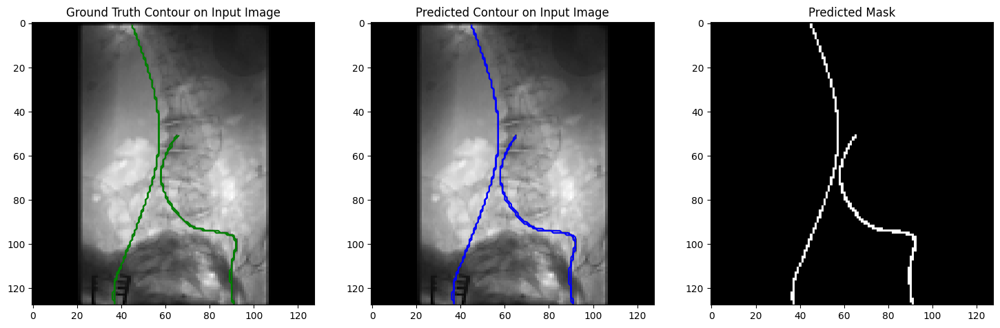

Mask 44 - min: 0.0, max: 1.0, mean: 0.0167236328125
Block 0 Output: 0.23539075255393982, 0.0, 8.530693054199219
Block 1 Output: 0.31686025857925415, 0.0, 12.901233673095703
Block 2 Output: 0.2885865867137909, 0.0, 8.391578674316406
Block 3 Output: 0.2849842309951782, 0.0, 7.042097091674805
Block 4 Output: 0.17345473170280457, 0.0, 10.813334465026855
Block 5 Output: 0.2825775146484375, 0.0, 9.631231307983398
Block 6 Output: 0.7288243174552917, 0.0, 19.41623878479004
Prediction 28: Model output min 0.0, max 1.0, mean 0.01568603515625
Prediction 28: Ground truth mask min 0.0, max 1.0, mean 0.0167236328125


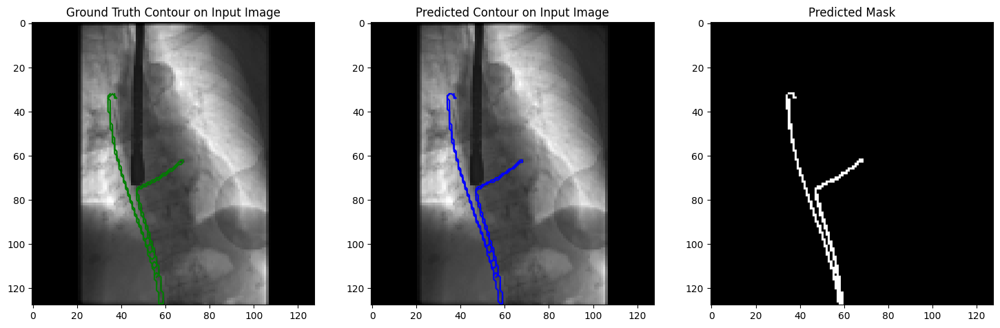

Mask 116 - min: 0.0, max: 1.0, mean: 0.0072021484375
Block 0 Output: 0.24831439554691315, 0.0, 13.89336109161377
Block 1 Output: 0.33185386657714844, 0.0, 10.119789123535156
Block 2 Output: 0.28691136837005615, 0.0, 10.594805717468262
Block 3 Output: 0.27900731563568115, 0.0, 8.098426818847656
Block 4 Output: 0.1666170060634613, 0.0, 12.122420310974121
Block 5 Output: 0.3183416724205017, 0.0, 11.898454666137695
Block 6 Output: 0.7502051591873169, 0.0, 26.256393432617188
Prediction 6: Model output min 0.0, max 1.0, mean 0.00738525390625
Prediction 6: Ground truth mask min 0.0, max 1.0, mean 0.0072021484375


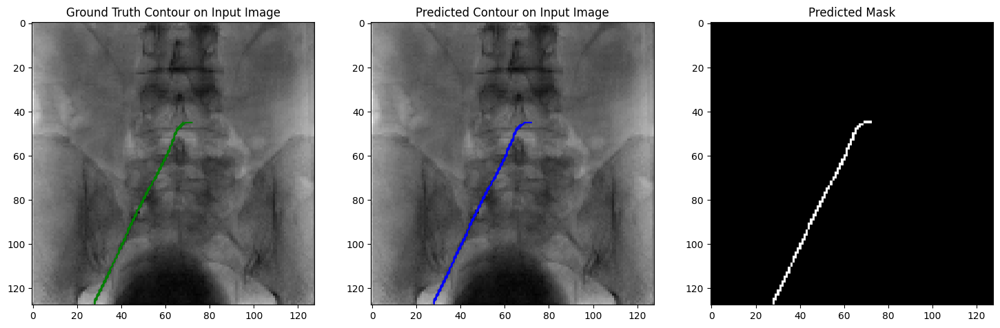

Mask 591 - min: 0.0, max: 1.0, mean: 0.0145263671875
Block 0 Output: 0.23436740040779114, 0.0, 15.044797897338867
Block 1 Output: 0.3098931610584259, 0.0, 12.841008186340332
Block 2 Output: 0.27835553884506226, 0.0, 9.584558486938477
Block 3 Output: 0.2825271487236023, 0.0, 7.088622570037842
Block 4 Output: 0.1731783151626587, 0.0, 10.70793628692627
Block 5 Output: 0.2824573218822479, 0.0, 9.587845802307129
Block 6 Output: 0.7269060611724854, 0.0, 20.785856246948242
Prediction 70: Model output min 0.0, max 1.0, mean 0.01483154296875
Prediction 70: Ground truth mask min 0.0, max 1.0, mean 0.0145263671875


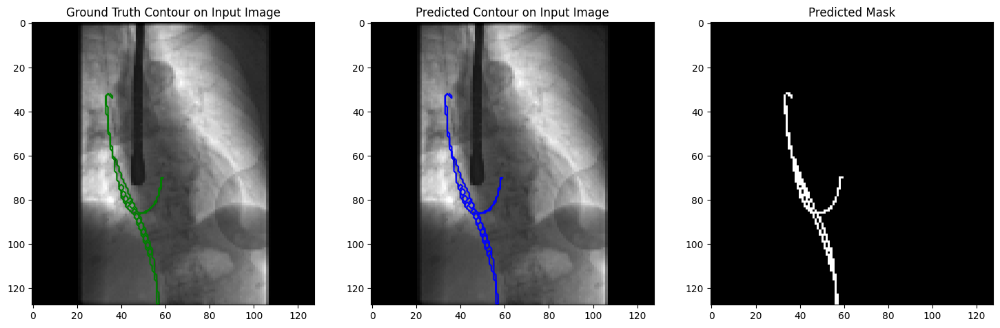

Mask 631 - min: 0.0, max: 1.0, mean: 0.06439208984375
Block 0 Output: 0.2385353147983551, 0.0, 8.21230411529541
Block 1 Output: 0.3234108090400696, 0.0, 9.95541763305664
Block 2 Output: 0.29521626234054565, 0.0, 10.585890769958496
Block 3 Output: 0.2848515510559082, 0.0, 7.366540908813477
Block 4 Output: 0.19108623266220093, 0.0, 11.80902099609375
Block 5 Output: 0.29972535371780396, 0.0, 11.178278923034668
Block 6 Output: 0.7148440480232239, 0.0, 15.109683990478516
Prediction 62: Model output min 0.0, max 1.0, mean 0.0616455078125
Prediction 62: Ground truth mask min 0.0, max 1.0, mean 0.06439208984375


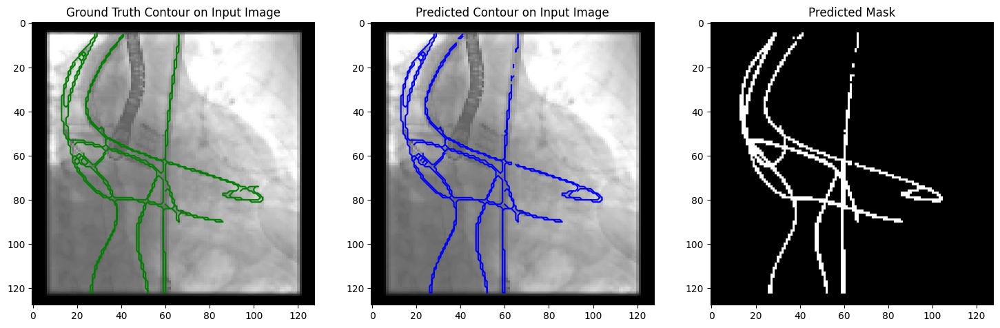

finish!
Mean IoU: 0.9355902194976806, Mean Dice: 0.9666711449623108, Mean RDice: 0.9666711449623108, Mean clDice: 1.0164621547684651, Mean AUC: 0.9832294975053149
Mean Dice: nan


In [ ]:

import os
import torch
import logging
import numpy as np
from os.path import join
import SimpleITK as sitk
from datetime import datetime
from torch.utils.data import DataLoader, Dataset, random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau
import matplotlib.pyplot as plt
import warnings
import cv2
import torch.optim as optim
import torch.nn as nn
import torch.nn.init as init
import random
import json
from scipy.ndimage import binary_dilation, generate_binary_structure
from scipy.ndimage import distance_transform_edt as distance
from sklearn.metrics import roc_auc_score

warnings.filterwarnings("ignore")

# AverageMeter to calculate the mean in the process
class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

class CrossEntropyLoss(nn.Module):
    def __init__(self):
        super(CrossEntropyLoss, self).__init__()

    def forward(self, y_true, y_pred):
        smooth = 1e-6
        return -torch.mean(y_true * torch.log(y_pred + smooth) +
                           (1 - y_true) * torch.log(1 - y_pred + smooth))

# Define metrics
def iou_score(output, target):
    smooth = 1e-6
    intersection = (output * target).sum()
    union = output.sum() + target.sum() - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def dice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()

    intersection = (output * target).sum()
    dice = (2. * intersection + smooth) / (output.sum() + target.sum() + smooth)
    return dice.item()

def rdice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()

    target = target > 0.5
    target = target.float()

    intersection = (output * target).sum()
    target_sum = target.sum()

    # To avoid division by zero, add a small epsilon
    target_sum = target_sum + smooth

    # Calculate RDice
    rdice = (2. * intersection + smooth) / (output.sum() + target_sum + smooth)
    return rdice.item()

def cl_dice_coefficient(output, target, smooth=1e-6):
    def cl_score(mask1, mask2):
        S1 = (mask1 > 0.5).float()
        S2 = (mask2 > 0.5).float()

        S1_dt = torch.from_numpy(distance(S1.cpu().numpy())).to(S1.device)
        S2_dt = torch.from_numpy(distance(S2.cpu().numpy())).to(S2.device)

        cl_S = (S1 * S2_dt) + (S2 * S1_dt)
        cl_S = cl_S.sum()

        return 2 * cl_S / (S1.sum() + S2.sum() + smooth)

    output = torch.sigmoid(output)
    output = output.float()

    dice = dice_coefficient(output, target, smooth)
    cl_dice = cl_score(output, target)
    return (dice + cl_dice) / 2

def auc_score(output, target):
    output = torch.sigmoid(output)
    output = output.view(-1).detach().cpu().numpy()
    target = target.view(-1).detach().cpu().numpy()
    return roc_auc_score(target, output)

# Training epoch
def train_epoch(model, loader, optimizer, criterion, epoch, n_epochs):
    model.train()
    train_loss = 0
    train_iou = 0
    train_dice = 0
    train_rdice = 0
    train_cl_dice = 0
    train_auc = 0

    for batch_idx, (image, label) in enumerate(loader):
        if torch.cuda.is_available():
            image, label = image.cuda(), label.cuda()

        optimizer.zero_grad()
        output = model(image)
        loss = criterion(output, label)
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_iou += iou_score(output, label)
        train_dice += dice_coefficient(output, label)
        train_rdice += rdice_coefficient(output, label)
        train_cl_dice += cl_dice_coefficient(output, label)
        train_auc += auc_score(output, label)

    train_loss /= len(loader)
    train_iou /= len(loader)
    train_dice /= len(loader)
    train_rdice /= len(loader)
    train_cl_dice /= len(loader)
    train_auc /= len(loader)

    print(f"Epoch: {epoch+1}/{n_epochs}, Train Loss: {train_loss:.6f}, Train IoU: {train_iou:.6f}, Train Dice: {train_dice:.6f}, Train RDice: {train_rdice:.6f}, Train clDice: {train_cl_dice:.6f}, Train AUC: {train_auc:.6f}")
    return train_loss, train_iou, train_dice, train_rdice, train_cl_dice, train_auc

# Validation epoch
def validate_epoch(model, loader, criterion):
    model.eval()
    val_loss = 0
    val_iou = 0
    val_dice = 0
    val_rdice = 0
    val_cl_dice = 0
    val_auc = 0

    with torch.no_grad():
        for image, label in loader:
            if torch.cuda.is_available():
                image, label = image.cuda(), label.cuda()

            output = model(image)
            loss = criterion(output, label)
            val_loss += loss.item()
            val_iou += iou_score(output, label)
            val_dice += dice_coefficient(output, label)
            val_rdice += rdice_coefficient(output, label)
            val_cl_dice += cl_dice_coefficient(output, label)
            val_auc += auc_score(output, label)

    val_loss /= len(loader)
    val_iou /= len(loader)
    val_dice /= len(loader)
    val_rdice /= len(loader)
    val_cl_dice /= len(loader)
    val_auc /= len(loader)

    print(f"Validation Loss: {val_loss:.6f}, Validation IoU: {val_iou:.6f}, Validation Dice: {val_dice:.6f}, Validation RDice: {val_rdice:.6f}, Validation clDice: {val_cl_dice:.6f}, Validation AUC: {val_auc:.6f}")
    return val_loss, val_iou, val_dice, val_rdice, val_cl_dice, val_auc
def Get_logger(filename, verbosity=1, name=None):
    level_dict = {0: logging.DEBUG, 1: logging.INFO, 2: logging.WARNING}
    formatter = logging.Formatter("[%(asctime)s][%(filename)s] %(message)s")
    logger = logging.getLogger(name)
    logger.setLevel(level_dict[verbosity])

    fh = logging.FileHandler(filename, "w")
    fh.setFormatter(formatter)
    logger.addHandler(fh)

    sh = logging.StreamHandler()
    sh.setFormatter(formatter)
    logger.addHandler(sh)

    return logger

def Create_files(args):
    directories = [
        args.save_path,
        args.save_path_max,
        args.Dir_Weights,
        args.Dir_Log,
    ]
    for directory in directories:
        if not os.path.exists(directory):
            os.makedirs(directory)

def save_model(model, optimizer, epoch, save_path, model_name):
    state = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()
    }
    torch.save(state, os.path.join(save_path, model_name + '.pth'))
    print(f"Model saved to {os.path.join(save_path, model_name + '.pth')}")

# Training loop
def Train_net(net, args, train_loader, val_loader):
    dice_m = 0

    if not args.if_retrain and os.path.exists(os.path.join(args.Dir_Weights, args.model_name)):
        net.load_state_dict(torch.load(os.path.join(args.Dir_Weights, args.model_name)))
        print(f"Loaded pre-trained weights from {os.path.join(args.Dir_Weights, args.model_name)}")
    else:
        print("Starting training from scratch...")

    if torch.cuda.is_available():
        net = net.cuda()

    optimizer = optim.AdamW(net.parameters(), lr=args.lr, betas=(0.9, 0.95))
    scheduler = ReduceLROnPlateau(optimizer, mode="min", factor=0.8, patience=50)
    criterion = CrossEntropyLoss()

    dt = datetime.today()
    log_name = f"{dt.date()}_{dt.time().hour}:{dt.time().minute}:{dt.time().second}_{args.log_name}"
    logger = Get_logger(args.Dir_Log + log_name)
    logger.info("Start training!")

    for epoch in range(args.start_train_epoch, args.n_epochs):
        train_metrics = train_epoch(net, train_loader, optimizer, criterion, epoch, args.n_epochs)
        val_metrics = validate_epoch(net, val_loader, criterion)

        torch.save(net.state_dict(), os.path.join(args.Dir_Weights, args.model_name))

        val_dice = val_metrics[2]  # Assuming Dice is the third metric returned

        if val_dice > dice_m:
            dice_m = val_dice
            torch.save(net.state_dict(), os.path.join(args.Dir_Weights, args.model_name_max))
        # Save the model after every epoch
        save_model(net, optimizer, epoch, args.Dir_Weights, args.model_name_max)

        logger.info(f"Epoch: [{epoch+1}/{args.n_epochs}], "
                    f"Train Loss: {train_metrics[0]:.6f}, Val Loss: {val_metrics[0]:.6f}, "
                    f"Train IoU: {train_metrics[1]:.6f}, Val IoU: {val_metrics[1]:.6f}, "
                    f"Train Dice: {train_metrics[2]:.6f}, Val Dice: {val_metrics[2]:.6f}, "
                    f"Train RDice: {train_metrics[3]:.6f}, Val RDice: {val_metrics[3]:.6f}, "
                    f"Train clDice: {train_metrics[4]:.6f}, Val clDice: {val_metrics[4]:.6f}, "
                    f"Train AUC: {train_metrics[5]:.6f}, Val AUC: {val_metrics[5]:.6f}, "
                    f"Best Dice: {dice_m:.6f}")

    logger.info("Finish training!")

def reshape_img(image, y, x):
    out = np.zeros([y, x], dtype=np.float32)
    out[0:image.shape[0], 0:image.shape[1]] = image[0:image.shape[0], 0:image.shape[1]]
    return out

def Dice(label_dir, pred_dir):
    dice = []
    label_files = [f for f in os.listdir(label_dir) if f.startswith('Annotation')]
    for label_file in label_files:
        image_path = join(label_dir, label_file)
        name = label_file

        predict_path = join(pred_dir, name)
        if not os.path.exists(predict_path):
            print(f"Prediction file {predict_path} not found.")
            continue

        predict = sitk.ReadImage(predict_path)
        predict = sitk.GetArrayFromImage(predict)
        predict = predict.astype(np.float32)
        predict = np.where(predict > 0.5, 1, 0)

        groundtruth = sitk.ReadImage(image_path)
        groundtruth = sitk.GetArrayFromImage(groundtruth)
        groundtruth = groundtruth.astype(np.float32)
        groundtruth = groundtruth / (np.max(groundtruth))

        tmp = predict + groundtruth
        a = np.sum(np.where(tmp == 2, 1, 0))
        b = np.sum(predict)
        c = np.sum(groundtruth)

        dice_score = (2 * a) / (b + c)
        dice.append(dice_score)
        print(name, dice_score)
    return dice






def extract_contours(mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours

# Predict and visualize process
def predict_and_visualize(model, dataset, save_path, args):
    print("Predict and visualize training data")
    model.eval()
    iou_scores = []
    dice_scores = []
    rdice_scores = []
    cl_dice_scores = []
    auc_scores = []

    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Collect all samples in a list for random sampling
    all_samples = list(range(len(dataset)))

    # Select 5 random samples from the collected list
    selected_samples = random.sample(all_samples, min(5, len(all_samples)))

    for t in selected_samples:
        image, mask = dataset[t]
        image = image.numpy()[0]  # Assuming image shape is [1, H, W]
        mask = mask.numpy()[0]  # Assuming mask shape is [1, H, W]

        name = f"prediction_{t}.png"  # Creates a filename for the prediction output
        y, x = image.shape

        # Initialize prediction and normalization map
        ind = (max(y, x) // args.ROI_shape + 1) * args.ROI_shape
        predict = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        n_map = np.zeros([1, args.n_classes, y, x], dtype=np.float32)

        # Create the map kernel
        shape = (args.ROI_shape, args.ROI_shape)
        a = np.zeros(shape=shape)
        a = np.where(a == 0)
        map_kernal = 1 / ((a[0] - shape[0] // 2)**4 + (a[1] - shape[1] // 2)**4)
        map_kernal = np.reshape(map_kernal, newshape=(1, 1) + shape)

        image = image[np.newaxis, np.newaxis, :, :]
        stride_x = shape[0] // 2
        stride_y = shape[1] // 2

        # Process the image in overlapping patches
        for i in range((y - shape[0]) // stride_x + 1):
            for j in range((x - shape[1]) // stride_y + 1):
                image_i = image[:, :, i * stride_x:i * stride_x + shape[0],
                                j * stride_y:j * stride_y + shape[1]]
                image_i = torch.from_numpy(image_i)
                if torch.cuda.is_available():
                    image_i = image_i.cuda()
                output = model(image_i)
                output = output.data.cpu().numpy()

                predict[:, :, i * stride_x:i * stride_x + shape[0],
                        j * stride_y:j * stride_y + shape[1]] += (output * map_kernal)
                n_map[:, :, i * stride_x:i * stride_x + shape[0],
                      j * stride_y:j * stride_y + shape[1]] += map_kernal

        output = predict / n_map
        output = output.astype(dtype=np.float32)
        output_final = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        output_final[:, :, 0:y, 0:x] = output[:, :, 0:y, 0:x]

        # Binarize the predicted mask
        output_final[0][0] = (output_final[0][0] > 0.5).astype(np.uint8)

        # Debug output range
        print(f"Prediction {t}: Model output min {output_final[0][0].min()}, max {output_final[0][0].max()}, mean {output_final[0][0].mean()}")
        print(f"Prediction {t}: Ground truth mask min {mask.min()}, max {mask.max()}, mean {mask.mean()}")

        # Save prediction as .png
        plt.imsave(os.path.join(save_path, name), output_final[0][0], cmap='gray')

        # Check if masks are not empty
        if output_final[0][0].sum() == 0 or mask.sum() == 0:
            print(f"Empty mask detected for image {t}. Skipping IoU and Dice calculation.")
            continue

        # Calculate metrics
        iou = iou_score(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        dice = dice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        rdice = rdice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        cl_dice = cl_dice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        auc = auc_score(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))

        iou_scores.append(iou)
        dice_scores.append(dice)
        rdice_scores.append(rdice)
        cl_dice_scores.append(cl_dice)
        auc_scores.append(auc)

        # Extract contours
        ground_truth_contours = extract_contours(mask)
        predicted_contours = extract_contours(output_final[0][0])

        # Visualization
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        axes[0].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in ground_truth_contours:
            axes[0].plot(contour[:, 0, 0], contour[:, 0, 1], 'g')  # Ground truth in green
        axes[0].set_title('Ground Truth Contour on Input Image')

        axes[1].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in predicted_contours:
            axes[1].plot(contour[:, 0, 0], contour[:, 0, 1], 'b')  # Predicted in blue
        axes[1].set_title('Predicted Contour on Input Image')

        axes[2].imshow(output_final[0][0].squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[2].set_title('Predicted Mask')

        plt.show()

    print("finish!")
    mean_iou = np.mean(iou_scores)
    mean_dice = np.mean(dice_scores)
    mean_rdice = np.mean(rdice_scores)
    mean_cl_dice = np.mean(cl_dice_scores)
    mean_auc = np.mean(auc_scores)
    print(f"Mean IoU: {mean_iou}, Mean Dice: {mean_dice}, Mean RDice: {mean_rdice}, Mean clDice: {mean_cl_dice}, Mean AUC: {mean_auc}")

def Predict_Network(net, dataset, args):
    if torch.cuda.is_available():
        net = net.cuda()
    try:
        net.load_state_dict(
            torch.load(os.path.join(args.Dir_Weights, args.model_name_max)))
        print(os.path.join(args.Dir_Weights, args.model_name_max))
    except:
        print(
            "Warning 100: No parameters in weights_max, here use parameters in weights"
        )
        net.load_state_dict(
            torch.load(os.path.join(args.Dir_Weights, args.model_name)))
        print(os.path.join(args.Dir_Weights, args.model_name))
    predict_and_visualize(net, dataset, args.save_path_max, args)
    dice = Dice(args.image_folder_path, args.save_path_max)
    dice_mean = np.mean(dice)
    print(f"Mean Dice: {dice_mean}")

def Train(args):
    os.environ["CUDA_VISIBLE_DEVICES"] = args.GPU_id
    #device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    Create_files(args)  # Ensure required directories exist

    # Create dataset and split into training and validation sets
    dataset = Dataloader(args.image_folder_path, args.image_prefix, args.mask_prefix, args.image_size)
    train_size = int(0.8 * len(dataset))
    val_size = len(dataset) - train_size
    train_data, val_data = random_split(dataset, [train_size, val_size])

    train_loader = DataLoader(train_data, batch_size=args.batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=args.batch_size, shuffle=False)

    pos_weight = dataset.calculate_class_weights()
    args.pos_weight = pos_weight

    if not args.if_onlytest:
        Train_net(net, args, train_loader, val_loader)
        Predict_Network(net, val_data, args)  # Pass validation data for prediction and visualization
    else:
        Predict_Network(net, val_data, args)  # Pass validation data for prediction and visualization

class Args:
    def __init__(self):
        self.root_dir = '/content/drive/My Drive/'
        self.Dir_Weights = self.root_dir + 'weightsT/'
        self.Dir_Log = self.root_dir + 'logsT/'
        self.save_path = self.root_dir + 'predictionsT/'
        self.save_path_max = self.root_dir + 'predictions_maxT/'
        self.model_name = 'dscnet_modelT.pth'
        self.model_name_max = 'dscnet_modelT_max.pth'
        self.image_folder_path = '/content/drive/My Drive/TestD'
        self.image_prefix = 'Fluoroscopy_Image'
        self.mask_prefix = 'Annotation'
        self.image_size = (128, 128)
        self.batch_size = 4
        self.lr = 1e-4
        self.n_epochs = 20
        self.start_train_epoch = 0
        self.start_verify_epoch = 2
        self.log_name = 'training_log.txt'
        self.if_retrain = False
        self.if_onlytest = False
        self.n_channels = 1
        self.n_classes = 1
        self.kernel_size = 3
        self.extend_scope = 1
        self.if_offset = True
        self.n_basic_layer = 64
        self.dim = 1
        self.ROI_shape = 128
        self.GPU_id = '0'
        self.pos_weight = 1.0

args = Args()

net = DSCNet(
        n_channels=args.n_channels,
        n_classes=args.n_classes,
        kernel_size=args.kernel_size,
        extend_scope=args.extend_scope,
        if_offset=args.if_offset,
        device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
        number=args.n_basic_layer,
        dim=args.dim,
    )
Train(args)

# **T1T4 TRAINING**

In [ ]:
import os
import numpy as np
import SimpleITK as sitk
import torch
from torch.utils import data

# Function to resample images
def resample_image(image, new_size, interpolator=sitk.sitkLinear):
    original_size = image.GetSize()
    original_spacing = image.GetSpacing()
    new_spacing = [
        original_spacing[0] * (original_size[0] / new_size[0]),
        original_spacing[1] * (original_size[1] / new_size[1])
    ]

    resampled_image = sitk.Resample(
        image, new_size, sitk.Transform(), interpolator,
        image.GetOrigin(), new_spacing, image.GetDirection(), 0, image.GetPixelID()
    )
    return resampled_image

# Function to load images and masks
def load_images_and_masks(folder_paths, image_prefix='Fluoroscopy_Image', mask_prefix='Annotation', image_size=(128, 128)):
    images = []
    masks = []
    file_pairs = []

    for folder_path in folder_paths:
        for file_name in os.listdir(folder_path):
            if image_prefix in file_name:
                image_path = os.path.join(folder_path, file_name)
                corresponding_mask_name = file_name.replace(image_prefix, mask_prefix)
                mask_path = os.path.join(folder_path, corresponding_mask_name)

                if os.path.exists(mask_path):
                    image = sitk.ReadImage(image_path)
                    image = resample_image(image, image_size)
                    image = sitk.GetArrayFromImage(image)
                    images.append(image[..., 0])  # Use the first channel if multi-channel
                    file_pairs.append((image_path, mask_path))
                    print(f"Loaded image from {image_path} with shape {image.shape} and unique values: {np.unique(image)}")

    images = np.array(images).astype('float32') / 255.0

    masks = []
    for _, mask_path in file_pairs:
        mask = sitk.ReadImage(mask_path)
        mask = resample_image(mask, image_size, interpolator=sitk.sitkNearestNeighbor)
        mask = sitk.GetArrayFromImage(mask)
        mask = mask[..., 0]  # Use only the first channel
        masks.append(mask)
        print(f"Loaded mask from {mask_path} with shape {mask.shape} and unique values: {np.unique(mask)}")  # Debug statement

    masks = np.array(masks).astype('float32') / 255.0

    # Ensure masks are binary
    masks = (masks > 0).astype(np.float32)

    return images, masks

# Dataset class
class UnseenDataLoader(data.Dataset):
    def __init__(self, image_folder_paths, image_prefix, mask_prefix, image_size):
        super(UnseenDataLoader, self).__init__()
        self.images, self.masks = load_images_and_masks(image_folder_paths, image_prefix, mask_prefix, image_size)
        self.images = np.expand_dims(self.images, axis=1)  # Add channel dimension
        self.masks = np.expand_dims(self.masks, axis=1)    # Add channel dimension

        # Calculate mean and std
        self.mean = np.mean(self.images)
        self.std = np.std(self.images)
        print(f"Calculated mean: {self.mean}, std: {self.std}")

        # Normalize images
        self.images = (self.images - self.mean) / self.std

    def __getitem__(self, index):
        image = self.images[index]
        mask = self.masks[index]

        # Ensure the images and masks have the correct shape
        assert image.shape == (1, 128, 128), f"Unexpected image shape: {image.shape}"
        assert mask.shape == (1, 128, 128), f"Unexpected mask shape: {mask.shape}"

        # Convert numpy arrays to PyTorch tensors
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)

        return image, mask

    def __len__(self):
        return len(self.images)

# Load unseen data from multiple folders
image_folder_paths = [
    '/content/drive/My Drive/phantom'
]
image_prefix = 'Fluoroscopy_Image'
mask_prefix = 'Annotation'
image_size = (128, 128)

unseen_dataset = UnseenDataLoader(image_folder_paths, image_prefix, mask_prefix, image_size)
unseen_loader = torch.utils.data.DataLoader(unseen_dataset, batch_size=4, shuffle=False)

# Print some information
for images, masks in unseen_loader:
    print(images.shape, masks.shape)
    break




Streaming output truncated to the last 5000 lines.
 175 176 177 179 181 183 184 185 187 188 189 191 192 194 195 198 199 200
 202 203 204 206 207 208 210 211 214 215 216 218 219 220 222 223 225 226
 227 229 230 231 233 234 235 237 239 241 245 246 250 254 255]
Loaded image from /content/drive/My Drive/phantom/Phantom_Image_179_Fluoroscopy_Image_178.png with shape (128, 128, 4) and unique values: [  1   2   6   8   9  11  12  16  18  19  20  22  23  25  26  27  29  30
  32  34  36  39  40  43  44  46  47  48  50  51  52  54  55  56  58  60
  62  64  65  67  68  69  71  72  73  75  76  78  79  81  83  85  86  88
  89  92  93  95  96  97  99 100 102 103 104 105 107 109 110 111 113 116
 117 118 120 121 123 124 125 127 128 130 131 134 135 137 138 139 141 142
 144 145 146 147 149 151 152 153 155 156 158 159 160 162 163 165 166 167
 169 170 172 173 174 176 177 179 181 183 184 186 187 188 190 191 193 194
 195 197 198 200 201 202 204 205 207 208 209 211 214 215 216 218 219 221
 222 223 225 226 22

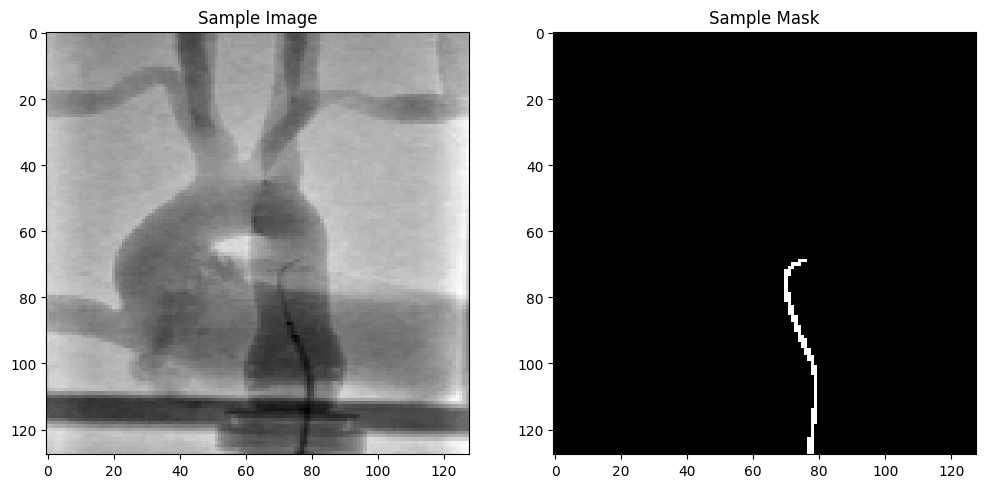

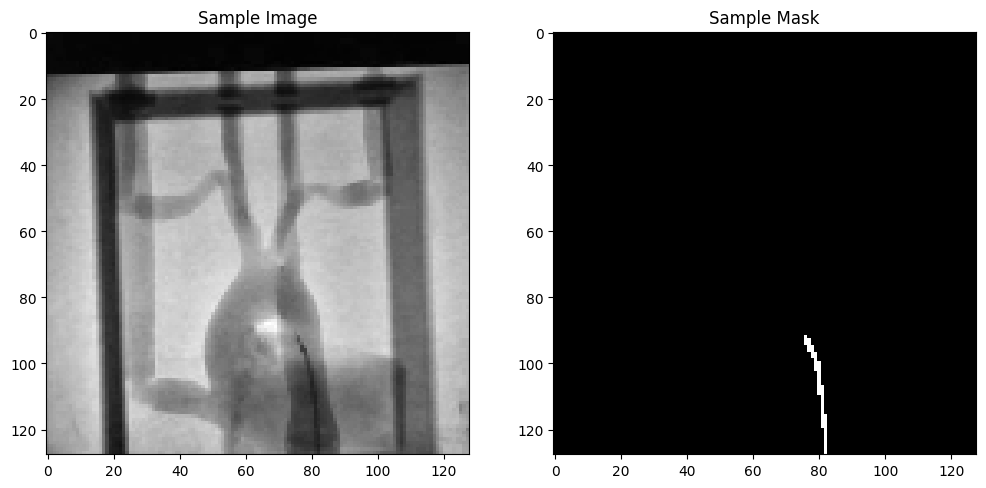

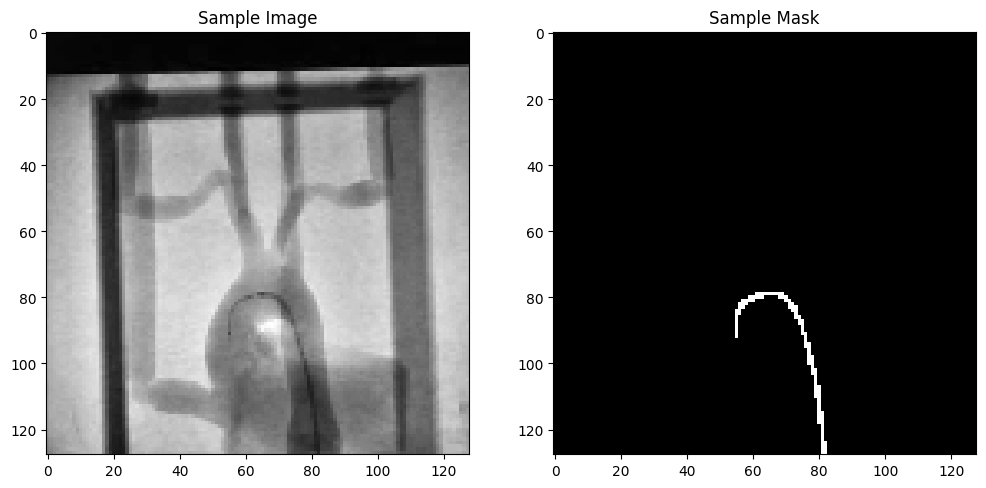

In [ ]:
def visualize_samples(dataset, num_samples=3):
    for i in range(num_samples):
        image, mask = dataset[i]
        image = image.numpy().squeeze()  # Assuming image shape is [1, H, W]
        mask = mask.numpy().squeeze()  # Assuming mask shape is [1, H, W]

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(image, cmap='gray')
        axes[0].set_title('Sample Image')
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title('Sample Mask')
        plt.show()

# Visualize some samples from the unseen dataset
visualize_samples(unseen_dataset)

Streaming output truncated to the last 5000 lines.
  80  81  83  84  85  87  88  89  91  92  93  95  96  97 100 101 102 104
 105 108 109 110 112 113 116 117 118 120 121 124 125 126 128 129 130 131
 133 134 135 137 138 139 141 142 143 145 146 147 149 150 151 153 154 155
 157 158 159 160 162 163 166 167 168 170 171 172 174 175 176 178 179 182
 183 184 186 187 188 190 191 192 193 195 197 199 200 201 203 204 205 207
 208 209 211 213 215 216 217 219 220 221 223 224 225 226 227 229 232 233
 236 237 238 240 243 246 255]
Loaded image from /content/drive/My Drive/phantom/Phantom_Image_399_Fluoroscopy_Image_398.png with shape (128, 128, 4) and unique values: [  1   2   8   9  11  13  15  16  18  20  22  23  25  26  29  30  32  34
  36  38  40  43  44  47  48  50  51  52  54  55  56  58  59  60  62  64
  65  68  69  70  72  73  75  76  77  79  80  81  83  84  86  87  89  91
  93  94  96  97 100 101 102 104 105 107 108 109 111 112 113 115 116 118
 119 121 123 125 126 128 129 130 131 133 134 136 13

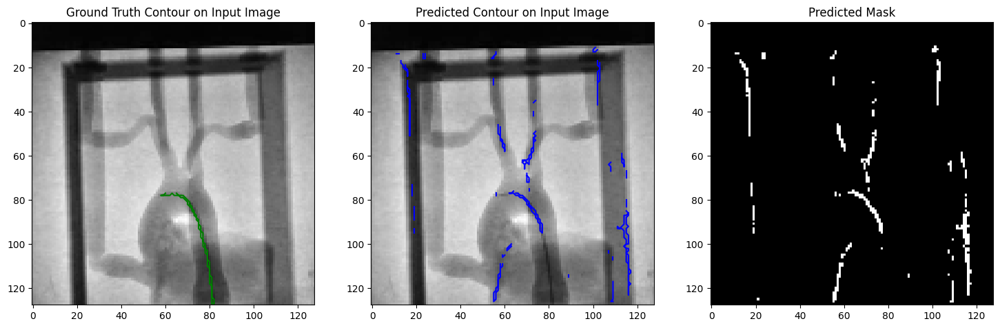

Block 0 Output: 0.24598513543605804, 0.0, 14.666816711425781
Block 1 Output: 0.327629417181015, 0.0, 11.994318008422852
Block 2 Output: 0.3136080801486969, 0.0, 10.669370651245117
Block 3 Output: 0.3068859279155731, 0.0, 11.555681228637695
Block 4 Output: 0.18322071433067322, 0.0, 19.415029525756836
Block 5 Output: 0.3258131444454193, 0.0, 18.64533805847168
Block 6 Output: 0.743681788444519, 0.0, 31.267763137817383
Prediction 71_1: Model output min 0.0, max 1.0, mean 0.01702880859375
Prediction 71_1: Ground truth mask min 0.0, max 1.0, mean 0.0111083984375


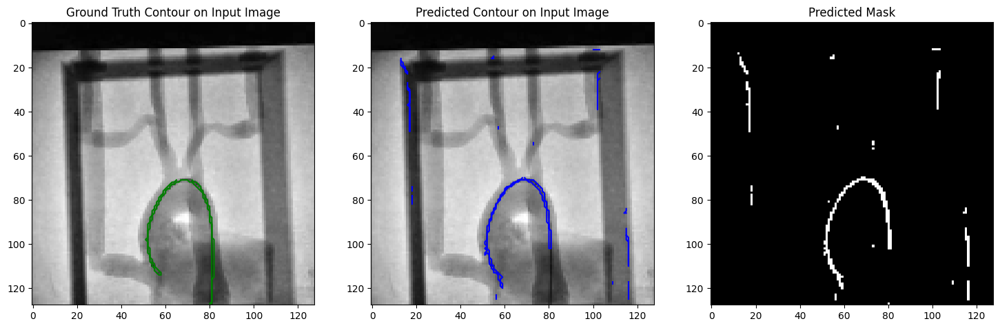

Block 0 Output: 0.2512047290802002, 0.0, 13.5943603515625
Block 1 Output: 0.31966763734817505, 0.0, 10.850204467773438
Block 2 Output: 0.2990152835845947, 0.0, 8.044137001037598
Block 3 Output: 0.3059186339378357, 0.0, 8.845808982849121
Block 4 Output: 0.1843273639678955, 0.0, 13.76171588897705
Block 5 Output: 0.3229827284812927, 0.0, 12.702818870544434
Block 6 Output: 0.7503674030303955, 0.0, 29.53297996520996
Prediction 377_0: Model output min 0.0, max 1.0, mean 0.009521484375
Prediction 377_0: Ground truth mask min 0.0, max 1.0, mean 0.0140380859375


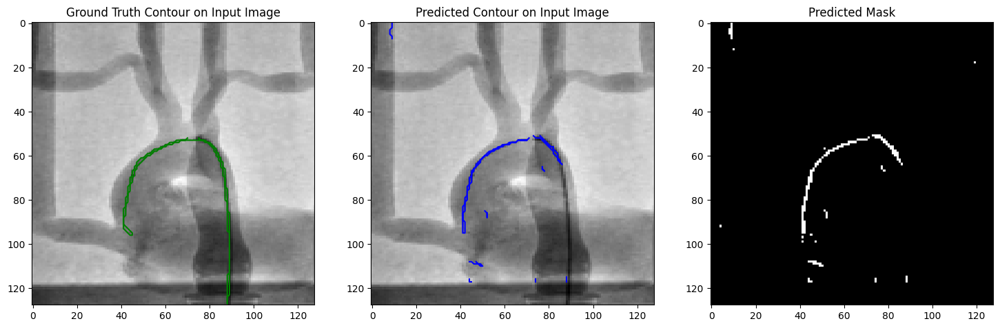

Block 0 Output: 0.2455226182937622, 0.0, 13.994458198547363
Block 1 Output: 0.32855382561683655, 0.0, 10.28958511352539
Block 2 Output: 0.31164342164993286, 0.0, 10.733438491821289
Block 3 Output: 0.30606749653816223, 0.0, 11.388053894042969
Block 4 Output: 0.1835339218378067, 0.0, 19.274017333984375
Block 5 Output: 0.32304584980010986, 0.0, 18.304000854492188
Block 6 Output: 0.7421073317527771, 0.0, 29.304203033447266
Prediction 52_1: Model output min 0.0, max 1.0, mean 0.0189208984375
Prediction 52_1: Ground truth mask min 0.0, max 1.0, mean 0.0101318359375


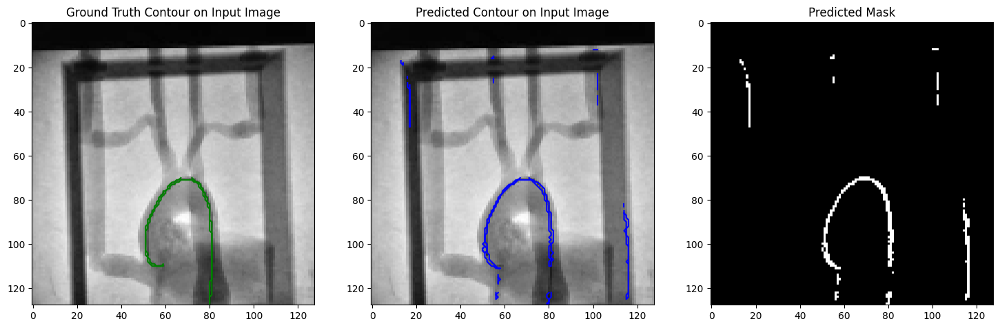

Block 0 Output: 0.24781018495559692, 0.0, 18.26421546936035
Block 1 Output: 0.3076145648956299, 0.0, 12.646077156066895
Block 2 Output: 0.27588048577308655, 0.0, 11.853513717651367
Block 3 Output: 0.28827571868896484, 0.0, 8.143237113952637
Block 4 Output: 0.17755144834518433, 0.0, 13.498711585998535
Block 5 Output: 0.31016606092453003, 0.0, 13.2858247756958
Block 6 Output: 0.7274751663208008, 0.0, 34.75175857543945
Prediction 346_1: Model output min 0.0, max 1.0, mean 0.00982666015625
Prediction 346_1: Ground truth mask min 0.0, max 1.0, mean 0.01373291015625


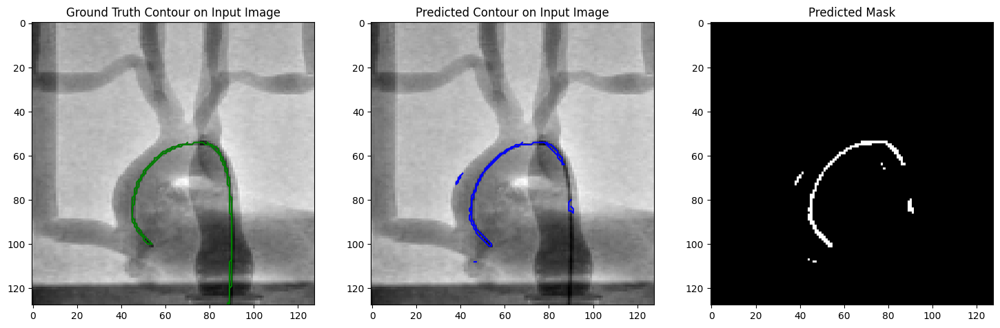

Block 0 Output: 0.25111833214759827, 0.0, 14.221996307373047
Block 1 Output: 0.3163975775241852, 0.0, 13.133585929870605
Block 2 Output: 0.2928946912288666, 0.0, 9.799689292907715
Block 3 Output: 0.3047717213630676, 0.0, 8.604697227478027
Block 4 Output: 0.18036137521266937, 0.0, 13.819772720336914
Block 5 Output: 0.31966182589530945, 0.0, 13.048645973205566
Block 6 Output: 0.7450435757637024, 0.0, 28.17691993713379
Prediction 379_0: Model output min 0.0, max 1.0, mean 0.01007080078125
Prediction 379_0: Ground truth mask min 0.0, max 1.0, mean 0.013427734375


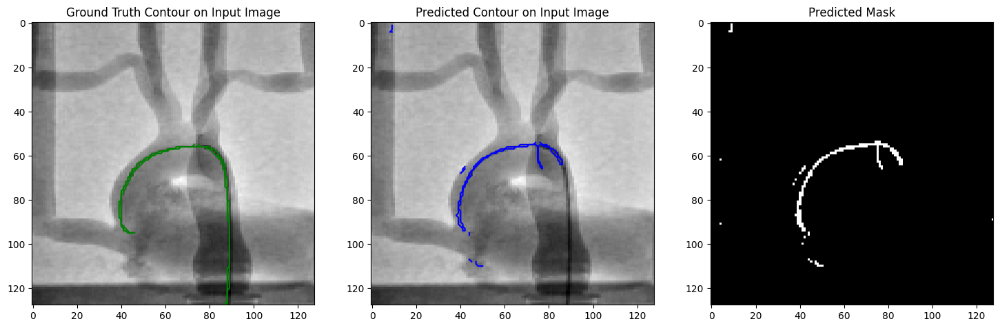

Block 0 Output: 0.25031939148902893, 0.0, 22.803720474243164
Block 1 Output: 0.3112092614173889, 0.0, 14.782252311706543
Block 2 Output: 0.2768464684486389, 0.0, 11.972835540771484
Block 3 Output: 0.2859834134578705, 0.0, 8.445967674255371
Block 4 Output: 0.1771605908870697, 0.0, 13.912189483642578
Block 5 Output: 0.30986180901527405, 0.0, 13.402315139770508
Block 6 Output: 0.7412261962890625, 0.0, 30.200031280517578
Prediction 456_3: Model output min 0.0, max 1.0, mean 0.0067138671875
Prediction 456_3: Ground truth mask min 0.0, max 1.0, mean 0.0125732421875


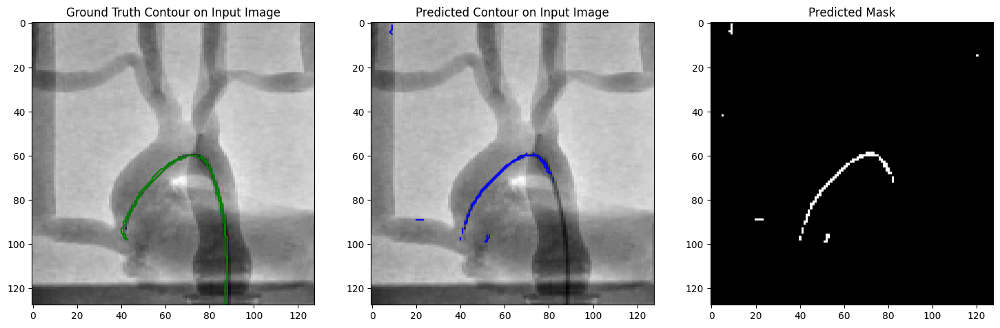

Block 0 Output: 0.24909880757331848, 0.0, 14.944694519042969
Block 1 Output: 0.306647390127182, 0.0, 14.809425354003906
Block 2 Output: 0.28090083599090576, 0.0, 11.451068878173828
Block 3 Output: 0.2956165075302124, 0.0, 8.630616188049316
Block 4 Output: 0.18337899446487427, 0.0, 13.195186614990234
Block 5 Output: 0.3083049952983856, 0.0, 13.713268280029297
Block 6 Output: 0.765698254108429, 0.0, 18.192441940307617
Prediction 279_0: Model output min 0.0, max 1.0, mean 0.009765625
Prediction 279_0: Ground truth mask min 0.0, max 1.0, mean 0.011962890625


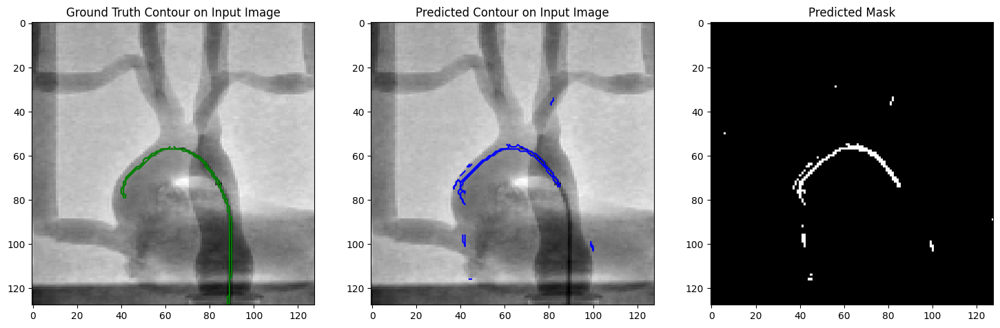

finish!
Mean IoU: 0.31836556270718575, Mean Dice: 0.47213020361959934, Mean RDice: 0.47213020361959934, Mean clDice: 0.4925402410784713, Mean AUC: 0.74443677726306


In [ ]:
import random
import numpy as np
import os
import torch
import matplotlib.pyplot as plt

def predict_and_visualize(model, loader, save_path, args):
    model.eval()
    iou_scores = []
    dice_scores = []
    rdice_scores = []
    cl_dice_scores = []
    auc_scores = []

    if not os.path.exists(save_path):
        os.makedirs(save_path)

    # Collect all samples in a list for random sampling
    all_samples = []

    for batch_idx, (images, masks) in enumerate(loader):
        images = images.numpy()
        masks = masks.numpy()

        for t in range(images.shape[0]):
            all_samples.append((batch_idx, t, images[t], masks[t]))

    # Select 8 random samples from the collected list
    selected_samples = random.sample(all_samples, min(8, len(all_samples)))

    for batch_idx, t, image, mask in selected_samples:
        image = image[0]  # Assuming image shape is [1, H, W]
        mask = mask[0]  # Assuming mask shape is [1, H, W]

        name = f"prediction_{batch_idx}_{t}.png"  # Creates a filename for the prediction output
        y, x = image.shape

        # Initialize prediction and normalization map
        ind = (max(y, x) // args.ROI_shape + 1) * args.ROI_shape
        predict = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        n_map = np.zeros([1, args.n_classes, y, x], dtype=np.float32)

        # Create the map kernel
        shape = (args.ROI_shape, args.ROI_shape)
        a = np.zeros(shape=shape)
        a = np.where(a == 0)
        map_kernal = 1 / ((a[0] - shape[0] // 2)**4 + (a[1] - shape[1] // 2)**4)
        map_kernal = np.reshape(map_kernal, newshape=(1, 1) + shape)

        image = image[np.newaxis, np.newaxis, :, :]
        stride_x = shape[0] // 2
        stride_y = shape[1] // 2

        # Process the image in overlapping patches
        for i in range((y - shape[0]) // stride_x + 1):
            for j in range((x - shape[1]) // stride_y + 1):
                image_i = image[:, :, i * stride_x:i * stride_x + shape[0],
                                j * stride_y:j * stride_y + shape[1]]
                image_i = torch.from_numpy(image_i)
                if torch.cuda.is_available():
                    image_i = image_i.cuda()
                output = model(image_i)
                output = output.data.cpu().numpy()

                predict[:, :, i * stride_x:i * stride_x + shape[0],
                        j * stride_y:j * stride_y + shape[1]] += (output * map_kernal)
                n_map[:, :, i * stride_x:i * stride_x + shape[0],
                      j * stride_y:j * stride_y + shape[1]] += map_kernal

        output = predict / n_map
        output = output.astype(dtype=np.float32)
        output_final = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        output_final[:, :, 0:y, 0:x] = output[:, :, 0:y, 0:x]

        # Binarize the predicted mask
        output_final[0][0] = (output_final[0][0] > 0.5).astype(np.uint8)

        # Debug output range
        print(f"Prediction {batch_idx}_{t}: Model output min {output_final[0][0].min()}, max {output_final[0][0].max()}, mean {output_final[0][0].mean()}")
        print(f"Prediction {batch_idx}_{t}: Ground truth mask min {mask.min()}, max {mask.max()}, mean {mask.mean()}")

        # Save prediction as .png
        plt.imsave(os.path.join(save_path, name), output_final[0][0], cmap='gray')

        # Check if masks are not empty
        if output_final[0][0].sum() == 0 or mask.sum() == 0:
            print(f"Empty mask detected for image {batch_idx}_{t}. Skipping IoU and Dice calculation.")
            continue

        # Calculate metrics
        iou = iou_score(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        dice = dice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        rdice = rdice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        cl_dice = cl_dice_coefficient(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))
        auc = auc_score(torch.from_numpy(output_final[0][0]), torch.from_numpy(mask))

        iou_scores.append(iou)
        dice_scores.append(dice)
        rdice_scores.append(rdice)
        cl_dice_scores.append(cl_dice)
        auc_scores.append(auc)

        # Extract contours
        ground_truth_contours = extract_contours(mask)
        predicted_contours = extract_contours(output_final[0][0])

        # Visualization
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        axes[0].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in ground_truth_contours:
            axes[0].plot(contour[:, 0, 0], contour[:, 0, 1], 'g')  # Ground truth in green
        axes[0].set_title('Ground Truth Contour on Input Image')

        axes[1].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        for contour in predicted_contours:
            axes[1].plot(contour[:, 0, 0], contour[:, 0, 1], 'b')  # Predicted in blue
        axes[1].set_title('Predicted Contour on Input Image')

        axes[2].imshow(output_final[0][0].squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[2].set_title('Predicted Mask')

        plt.show()

    print("finish!")
    mean_iou = np.mean(iou_scores)
    mean_dice = np.mean(dice_scores)
    mean_rdice = np.mean(rdice_scores)
    mean_cl_dice = np.mean(cl_dice_scores)
    mean_auc = np.mean(auc_scores)
    print(f"Mean IoU: {mean_iou}, Mean Dice: {mean_dice}, Mean RDice: {mean_rdice}, Mean clDice: {mean_cl_dice}, Mean AUC: {mean_auc}")


# Testing function
def test_model_on_unseen_data(net, unseen_loader, args):
    predict_and_visualize(net, unseen_loader, args.save_path_max, args)

# Assuming args is defined and net is the trained DSCNet model
args = Args()  # Define your Args object if not already defined

# Example usage
image_folder_path = [
    '/content/drive/My Drive/phantom'

]
image_prefix = 'Fluoroscopy_Image'
mask_prefix = 'Annotation'  # If masks are available for validation
image_size = (128, 128)

# Load the unseen data
unseen_dataset = Dataloader(image_folder_path, image_prefix, mask_prefix, image_size)
unseen_loader = torch.utils.data.DataLoader(unseen_dataset, batch_size=4, shuffle=False)

# Test the model on unseen data
test_model_on_unseen_data(net, unseen_loader, args)

Streaming output truncated to the last 5000 lines.
  40  42  43  44  46  47  48  50  51  52  54  55  56  58  59  60  62  63
  64  65  67  68  69  70  71  72  73  75  76  77  78  79  80  81  83  84
  86  87  88  89  91  92  93  94  95  96  97  99 100 101 102 103 104 105
 107 108 110 111 112 113 115 116 117 118 119 120 121 123 124 125 126 127
 128 129 130 131 133 135 136 137 138 139 140 141 142 143 144 145 147 149
 150 151 152 153 154 155 156 157 159 160 161 162 163 165 166 167 168 169
 171 172 173 174 175 176 177 178 179 181 183 184 185 186 187 188 189 190
 191 192 193 194 195 197 198 199 200 201 202 203 204 205 206 208 209 210
 211 213 214 215 216 217 218 220 221 222 223 224 225 226 227 229 230 232
 233 234 235 236 237 238 239 240 241 242 243 245 246 247 248 250 251 255]
Loaded image from /content/drive/My Drive/TestD/T1_Image_11_Fluoroscopy_Image_10 (1).png with shape (128, 128, 4) and unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  13  14  15  16  17  18
  19  20  21

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Streaming output truncated to the last 5000 lines.
Mask 208 - min: 0.0, max: 1.0, mean: 0.00714111328125
Block 0 Output: 0.2468280792236328, 0.0, 14.727232933044434
Block 1 Output: 0.33253970742225647, 0.0, 10.319503784179688
Block 2 Output: 0.2911120057106018, 0.0, 10.655860900878906
Block 3 Output: 0.2797412574291229, 0.0, 8.259415626525879
Block 4 Output: 0.16728197038173676, 0.0, 12.262948036193848
Block 5 Output: 0.3176928162574768, 0.0, 11.94912338256836
Block 6 Output: 0.7529167532920837, 0.0, 21.58830451965332
Mask 209 - min: 0.0, max: 1.0, mean: 0.00714111328125
Block 0 Output: 0.24756206572055817, 0.0, 14.954546928405762
Block 1 Output: 0.3319286108016968, 0.0, 10.865819931030273
Block 2 Output: 0.288961261510849, 0.0, 10.752598762512207
Block 3 Output: 0.27627885341644287, 0.0, 8.187982559204102
Block 4 Output: 0.16399073600769043, 0.0, 12.080812454223633
Block 5 Output: 0.31685304641723633, 0.0, 11.833285331726074
Block 6 Output: 0.749792218208313, 0.0, 21.352323532104492
M

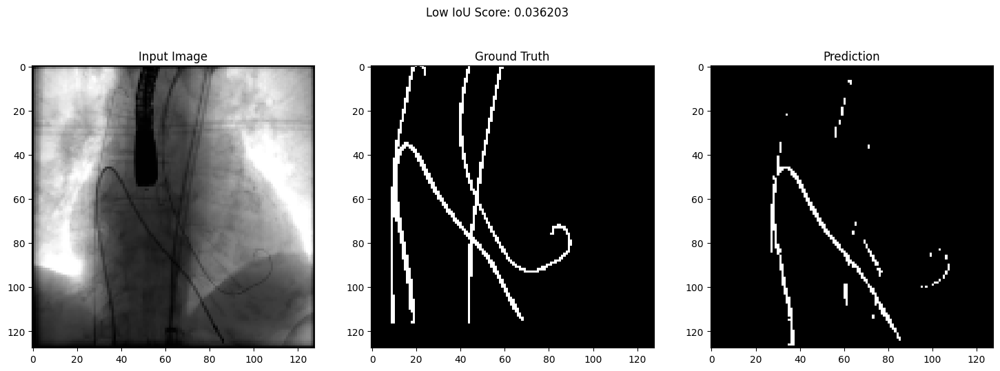

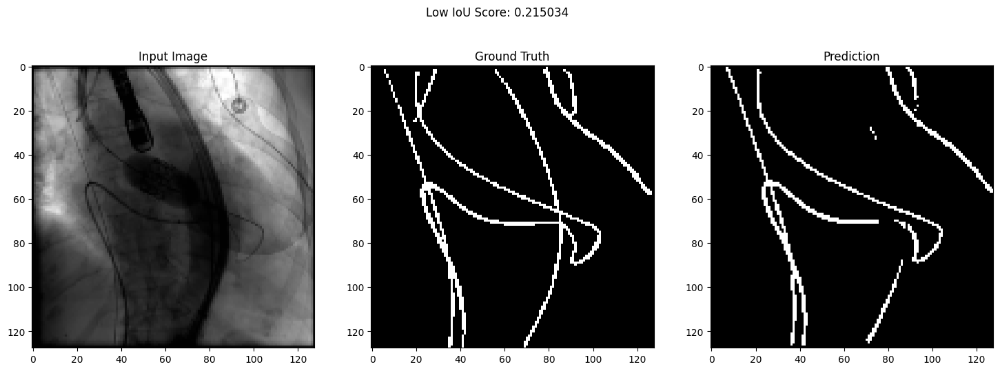

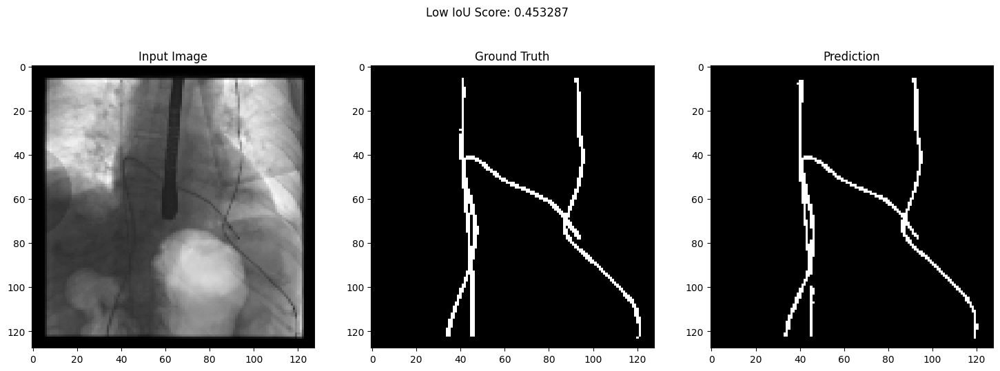

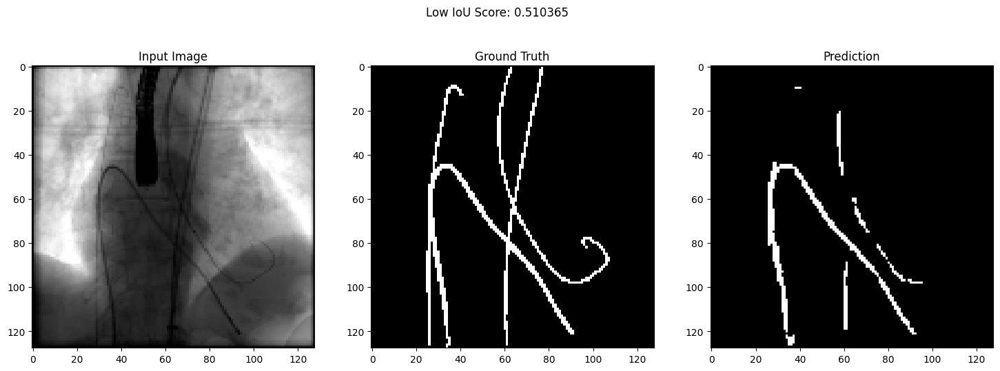

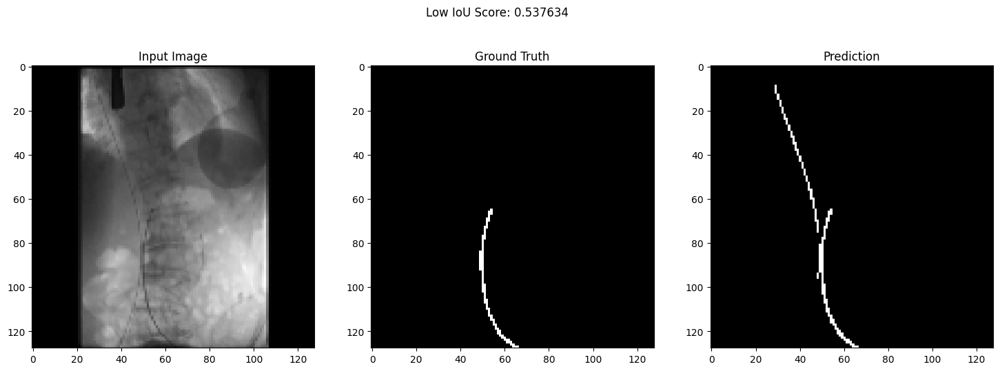

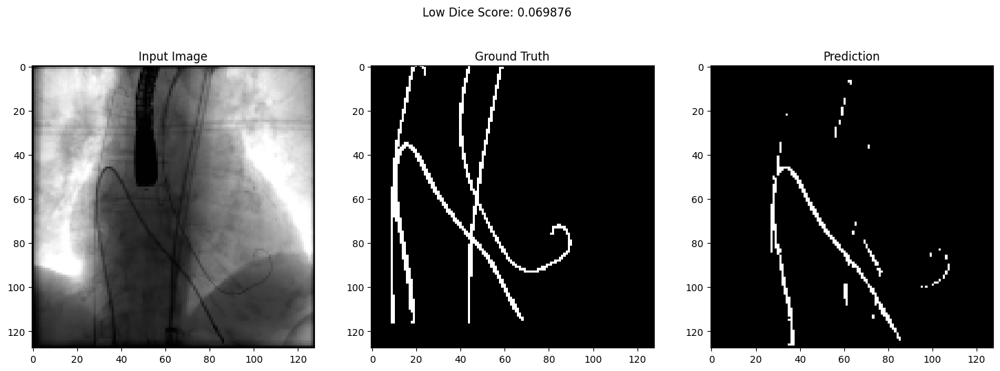

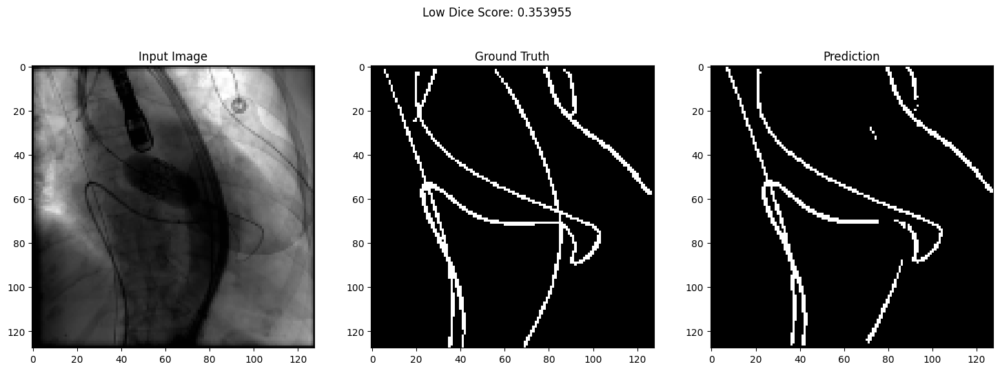

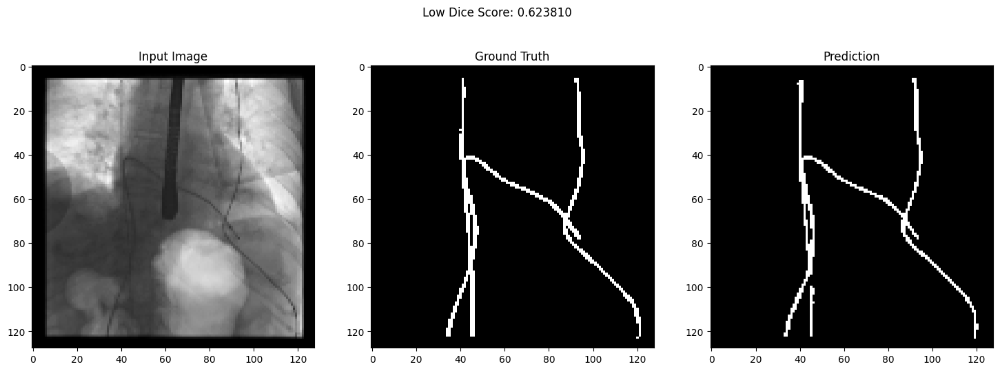

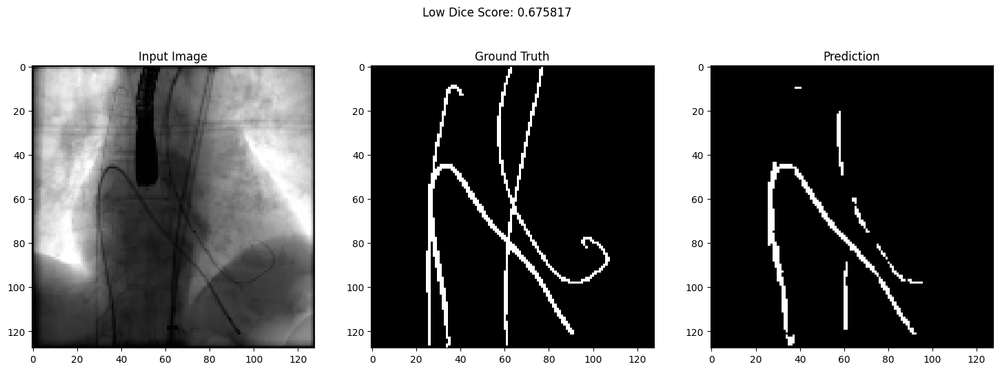

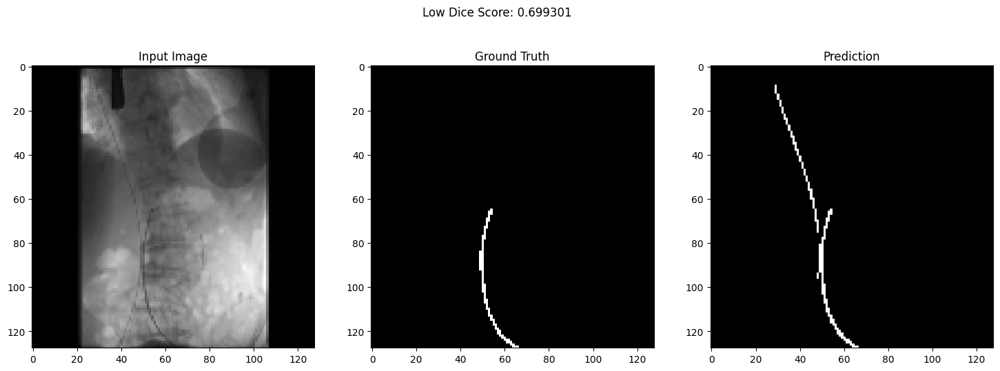

In [ ]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
import random
import SimpleITK as sitk
from sklearn.metrics import roc_auc_score
def iou_score(output, target):
    smooth = 1e-6
    intersection = (output * target).sum()
    union = output.sum() + target.sum() - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def dice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()

    intersection = (output * target).sum()
    dice = (2. * intersection + smooth) / (output.sum() + target.sum() + smooth)
    return dice.item()

def rdice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()

    target = target > 0.5
    target = target.float()

    intersection = (output * target).sum()
    target_sum = target.sum()

    # To avoid division by zero, add a small epsilon
    target_sum = target_sum + smooth

    # Calculate RDice
    rdice = (2. * intersection + smooth) / (output.sum() + target_sum + smooth)
    return rdice.item()

def cl_dice_coefficient(output, target, smooth=1e-6):
    def cl_score(mask1, mask2):
        S1 = (mask1 > 0.5).float()
        S2 = (mask2 > 0.5).float()

        S1_dt = torch.from_numpy(distance(S1.cpu().numpy())).to(S1.device)
        S2_dt = torch.from_numpy(distance(S2.cpu().numpy())).to(S2.device)

        cl_S = (S1 * S2_dt) + (S2 * S1_dt)
        cl_S = cl_S.sum()

        return 2 * cl_S / (S1.sum() + S2.sum() + smooth)

    output = torch.sigmoid(output)
    output = output.float()

    dice = dice_coefficient(output, target, smooth)
    cl_dice = cl_score(output, target)
    return (dice + cl_dice) / 2

def auc_score(output, target):
    output = torch.sigmoid(output)
    output = output.view(-1).detach().cpu().numpy()
    target = target.view(-1).detach().cpu().numpy()
    return roc_auc_score(target, output)
def extract_contours(mask):
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours



# Assuming your previously defined functions: iou_score, dice_coefficient, rdice_coefficient,
# cl_dice_coefficient, auc_score, extract_contours, DSCNet, Dataloader


class Args:
    def __init__(self):
        self.root_dir = '/content/drive/My Drive/'
        self.Dir_Weights = self.root_dir + 'weightsT/'
        self.Dir_Log = self.root_dir + 'logsT/'
        self.save_path = self.root_dir + 'predictionsT/'
        self.save_path_max = self.root_dir + 'predictions_maxT/'
        self.model_name = 'dscnet_modelT.pth'
        self.model_name_max = 'dscnet_modelT_max.pth'
        self.image_folder_path = '/content/drive/My Drive/TestD'
        self.image_prefix = 'Fluoroscopy_Image'
        self.mask_prefix = 'Annotation'
        self.image_size = (128, 128)
        self.batch_size = 4
        self.lr = 1e-4
        self.n_epochs = 20
        self.start_train_epoch = 0
        self.start_verify_epoch = 2
        self.log_name = 'training_log.txt'
        self.if_retrain = False
        self.if_onlytest = False
        self.n_channels = 1
        self.n_classes = 1
        self.kernel_size = 3
        self.extend_scope = 1
        self.if_offset = True
        self.n_basic_layer = 64
        self.dim = 1
        self.ROI_shape = 128
        self.GPU_id = '0'
        self.pos_weight = 1.0

# Function to load the model
def load_model(model, weight_path, device):
    if os.path.exists(weight_path):
        model.load_state_dict(torch.load(weight_path, map_location=device))
        print(f"Model loaded successfully from {weight_path}")
    else:
        print(f"Model not found at {weight_path}")
    return model

# Function to evaluate the dataset
def evaluate_model(model, dataset, args, device):
    model.eval()
    iou_scores = []
    dice_scores = []

    # Collect all samples in a list for random sampling
    all_samples = list(range(len(dataset)))

    for t in all_samples:
        image, mask = dataset[t]
        image = image.to(device)  # Ensure the image is on the correct device
        mask = mask.to(device)  # Ensure the mask is on the correct device

        image_np = image.cpu().numpy()[0]  # Assuming image shape is [1, H, W]
        mask_np = mask.cpu().numpy()[0]  # Assuming mask shape is [1, H, W]

        y, x = image_np.shape

        # Initialize prediction and normalization map
        ind = (max(y, x) // args.ROI_shape + 1) * args.ROI_shape
        predict = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        n_map = np.zeros([1, args.n_classes, y, x], dtype=np.float32)

        # Create the map kernel
        shape = (args.ROI_shape, args.ROI_shape)
        a = np.zeros(shape=shape)
        a = np.where(a == 0)
        map_kernal = 1 / (((a[0] - shape[0] // 2)**4 + (a[1] - shape[1] // 2)**4) + 1e-6)
        map_kernal = np.reshape(map_kernal, newshape=(1, 1) + shape)

        image_expanded = image_np[np.newaxis, np.newaxis, :, :]
        stride_x = shape[0] // 2
        stride_y = shape[1] // 2

        # Process the image in overlapping patches
        for i in range((y - shape[0]) // stride_x + 1):
            for j in range((x - shape[1]) // stride_y + 1):
                image_i = image_expanded[:, :, i * stride_x:i * stride_x + shape[0],
                                         j * stride_y:j * stride_y + shape[1]]
                image_i = torch.from_numpy(image_i).float().to(device)  # Ensure the image is on the correct device
                output = model(image_i)
                output = output.data.cpu().numpy()

                predict[:, :, i * stride_x:i * stride_x + shape[0],
                        j * stride_y:j * stride_y + shape[1]] += (output * map_kernal)
                n_map[:, :, i * stride_x:i * stride_x + shape[0],
                      j * stride_y:j * stride_y + shape[1]] += map_kernal

        output = predict / n_map
        output = output.astype(dtype=np.float32)
        output_final = np.zeros([1, args.n_classes, y, x], dtype=np.float32)
        output_final[:, :, 0:y, 0:x] = output[:, :, 0:y, 0:x]

        # Binarize the predicted mask
        output_final[0][0] = (output_final[0][0] > 0.5).astype(np.uint8)

        # Calculate metrics
        iou = iou_score(torch.from_numpy(output_final[0][0]).to(device), torch.from_numpy(mask_np).to(device))
        dice = dice_coefficient(torch.from_numpy(output_final[0][0]).to(device), torch.from_numpy(mask_np).to(device))

        iou_scores.append((iou, image_np, mask_np, output_final[0][0]))
        dice_scores.append((dice, image_np, mask_np, output_final[0][0]))

    return iou_scores, dice_scores

# Function to visualize samples
def visualize_samples(samples, title):
    for sample in samples[:5]:
        score, image, mask, prediction = sample
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(f'{title} Score: {score:.6f}')

        axes[0].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[0].set_title('Input Image')

        axes[1].imshow(mask.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[1].set_title('Ground Truth')

        axes[2].imshow(prediction.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[2].set_title('Prediction')

        plt.show()

# Main function to load the model, evaluate the dataset, and visualize the results
def main(args, model, dataset):
    os.environ["CUDA_VISIBLE_DEVICES"] = args.GPU_id
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)  # Ensure the model is on the correct device
    model = load_model(model, os.path.join(args.Dir_Weights, args.model_name_max), device)
    iou_scores, dice_scores = evaluate_model(model, dataset, args, device)

    # Sort by IoU and Dice scores
    iou_scores.sort(key=lambda x: x[0])
    dice_scores.sort(key=lambda x: x[0])

    # Select the bottom 10% of the scores
    low_iou_samples = iou_scores[:int(0.1 * len(iou_scores))]
    low_dice_samples = dice_scores[:int(0.1 * len(dice_scores))]

    visualize_samples(low_iou_samples, 'Low IoU')
    visualize_samples(low_dice_samples, 'Low Dice')

# Assuming args and net are defined
args = Args()
net = DSCNet(
        n_channels=args.n_channels,
        n_classes=args.n_classes,
        kernel_size=args.kernel_size,
        extend_scope=args.extend_scope,
        if_offset=args.if_offset,
        device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
        number=args.n_basic_layer,
        dim=args.dim,
    )

dataset = Dataloader(args.image_folder_path, args.image_prefix, args.mask_prefix, args.image_size)
main(args, net, dataset)


Streaming output truncated to the last 5000 lines.
 214 215 216 217 218 219 220 222 223 224 225 226 227 229 230 231 232 233
 234 235 236 237 239 240 241 243 245 246 248 249 250 251 253 255]
Loaded image from /content/drive/My Drive/TestD/T1_Image_15_Fluoroscopy_Image_14 (1).png with shape (128, 128, 4) and unique values: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  31  32  34  35  36  38  39
  40  42  43  44  46  47  48  50  51  52  54  55  56  58  59  60  62  63
  64  65  67  68  69  70  71  72  73  76  77  78  79  80  81  83  84  85
  86  87  88  89  91  92  93  94  95  96  97  99 100 101 102 103 104 105
 107 108 109 110 111 112 113 115 116 117 118 119 121 123 124 125 126 127
 128 129 130 131 133 134 136 137 138 139 140 141 142 143 144 145 146 147
 149 151 152 153 154 155 156 157 158 159 160 161 162 163 166 167 168 169
 170 171 172 173 174 175 176 177 178 179 181 182 183 184 185 186 187 188
 189 190 191 192 193

/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


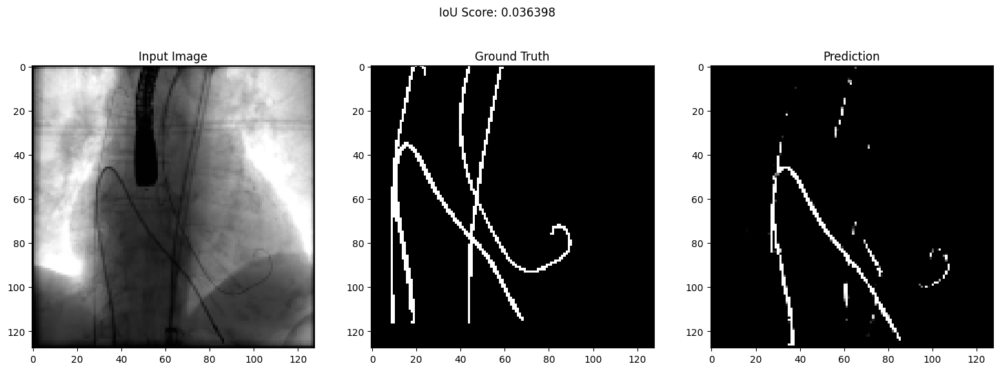

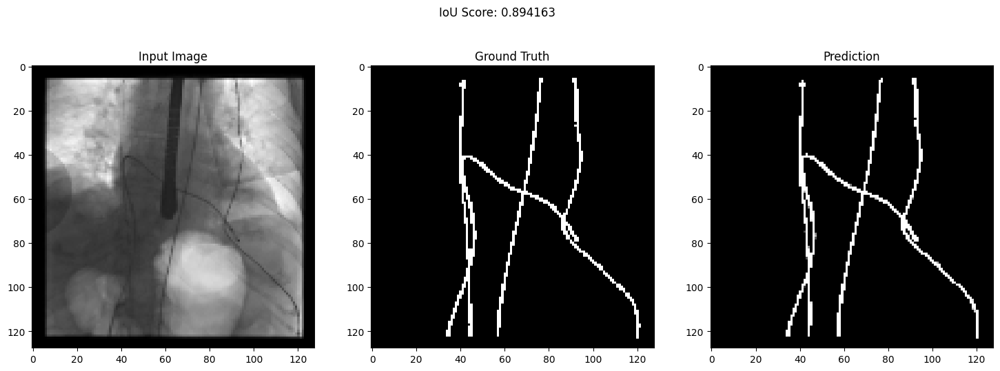

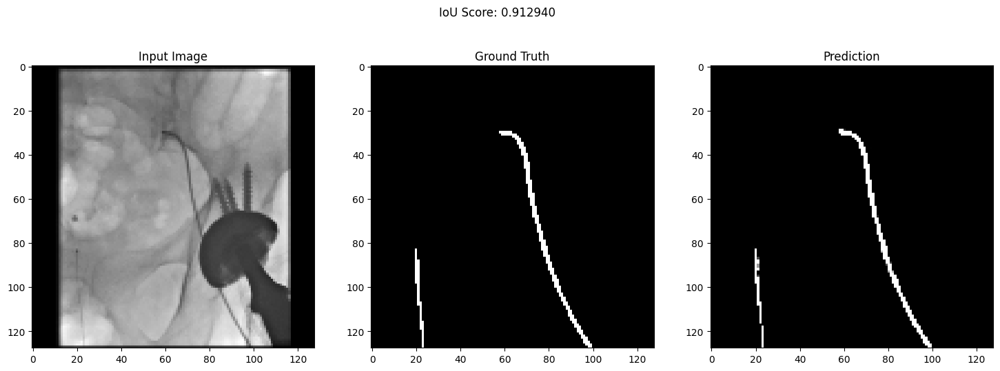

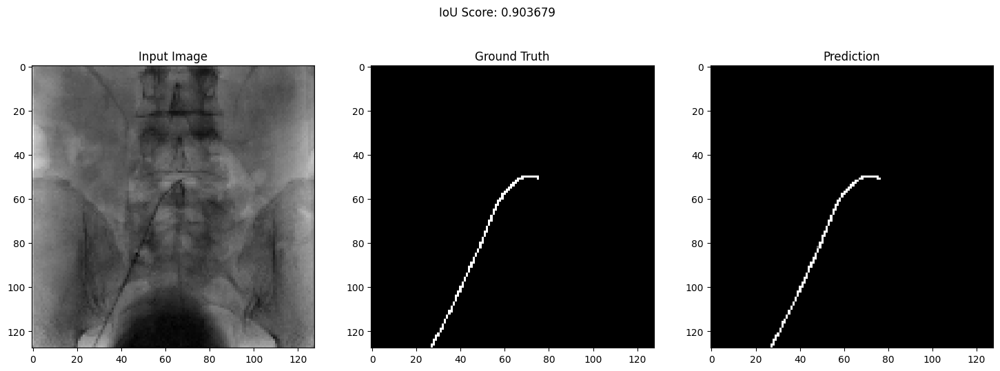

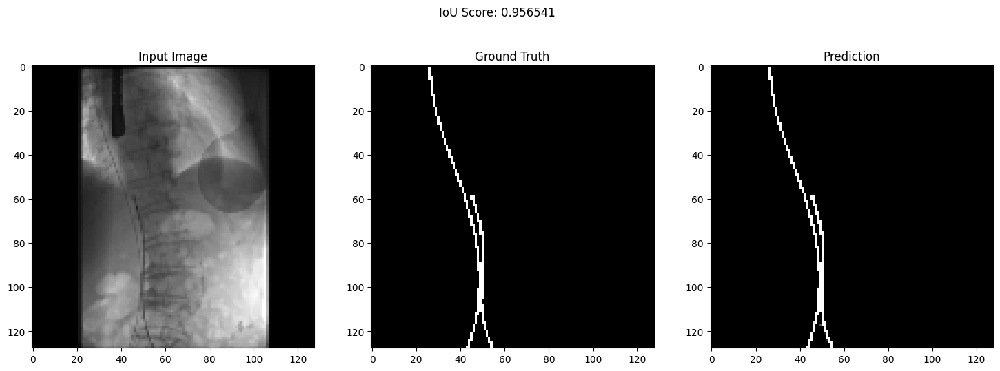

...

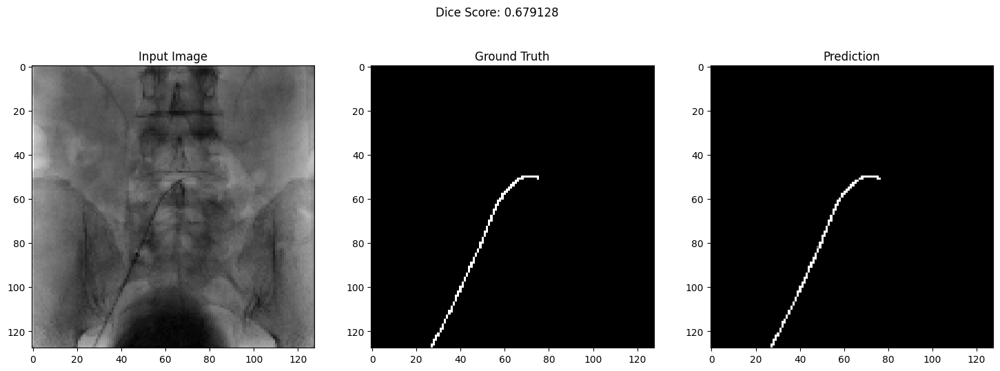

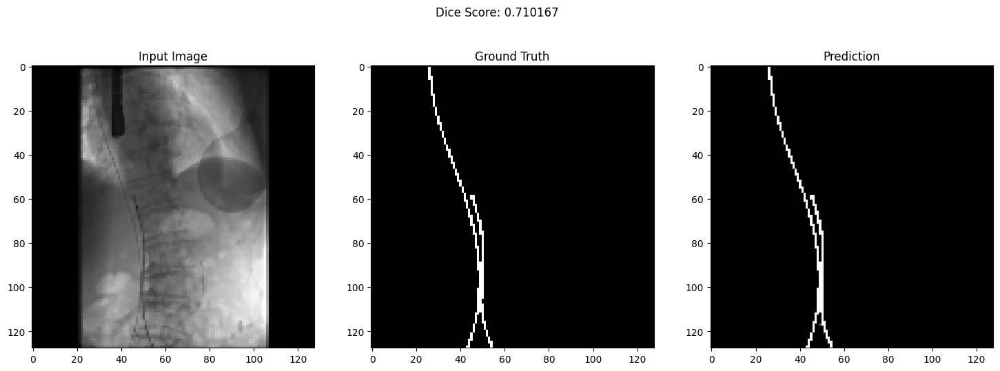

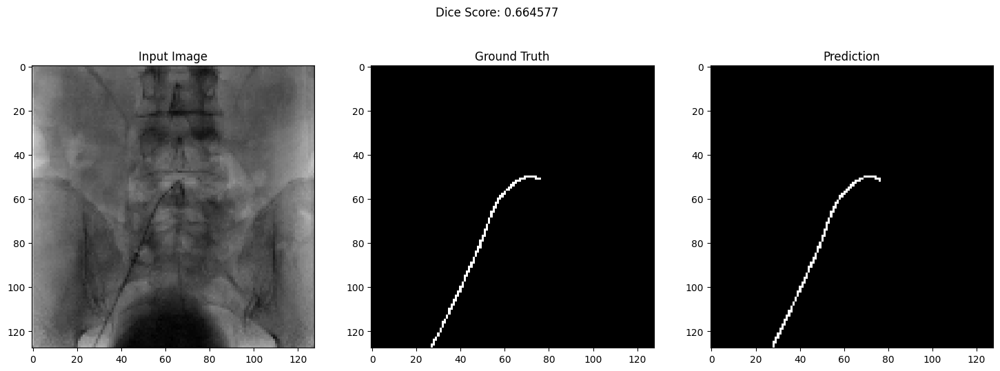

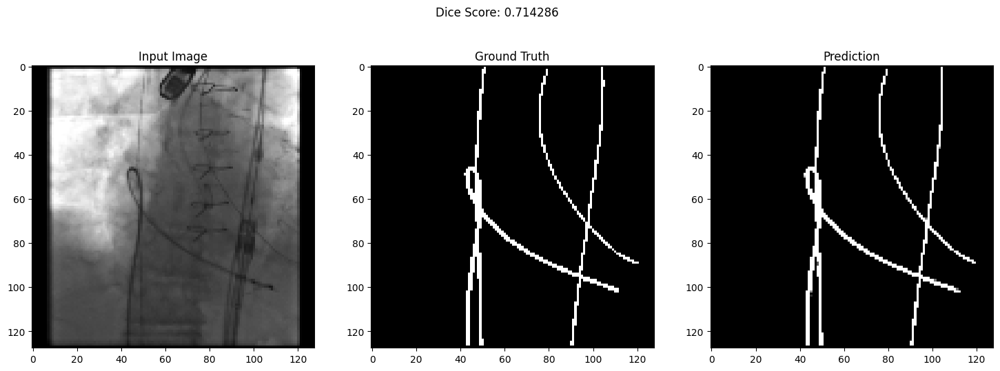

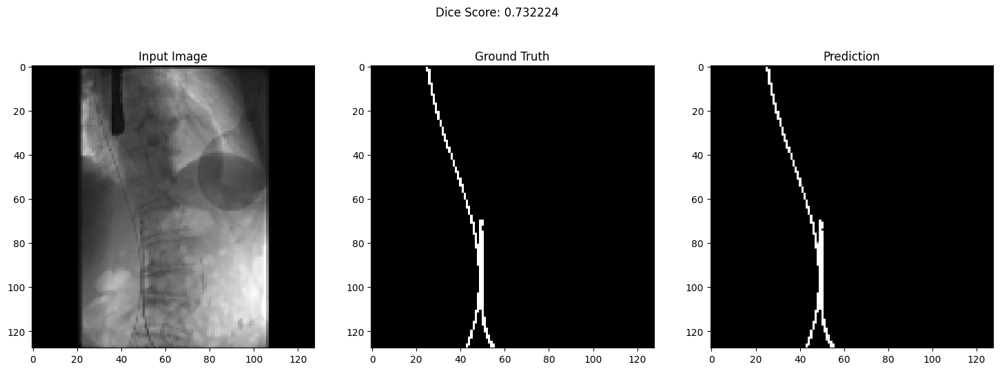

In [ ]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from scipy.ndimage import distance_transform_edt
# Define the necessary metric functions
def iou_score(output, target):
    smooth = 1e-6
    intersection = (output * target).sum()
    union = output.sum() + target.sum() - intersection
    iou = (intersection + smooth) / (union + smooth)
    return iou.item()

def dice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()
    intersection = (output * target).sum()
    dice = (2. * intersection + smooth) / (output.sum() + target.sum() + smooth)
    return dice.item()

def rdice_coefficient(output, target, smooth=1e-6):
    output = torch.sigmoid(output)
    output = output > 0.5
    output = output.float()
    target = target > 0.5
    target = target.float()
    intersection = (output * target).sum()
    target_sum = target.sum() + smooth
    rdice = (2. * intersection + smooth) / (output.sum() + target_sum + smooth)
    return rdice.item()

def cl_dice_coefficient(output, target, smooth=1e-6):
    def cl_score(mask1, mask2):
        S1 = (mask1 > 0.5).float()
        S2 = (mask2 > 0.5).float()
        S1_dt = torch.from_numpy(distance_transform_edt(S1.cpu().numpy())).to(S1.device)
        S2_dt = torch.from_numpy(distance_transform_edt(S2.cpu().numpy())).to(S2.device)
        cl_S = (S1 * S2_dt) + (S2 * S1_dt)
        cl_S = cl_S.sum()
        return 2 * cl_S / (S1.sum() + S2.sum() + smooth)
    output = torch.sigmoid(output)
    output = output.float()
    dice = dice_coefficient(output, target, smooth)
    cl_dice = cl_score(output, target)
    return (dice + cl_dice) / 2

def auc_score(output, target):
    output = torch.sigmoid(output)
    output = output.view(-1).detach().cpu().numpy()
    target = target.view(-1).detach().cpu().numpy()
    return roc_auc_score(target, output)

class Args:
    def __init__(self):
        self.root_dir = '/content/drive/My Drive/'
        self.Dir_Weights = self.root_dir + 'weightsT/'
        self.Dir_Log = self.root_dir + 'logsT/'
        self.save_path = self.root_dir + 'predictionsT/'
        self.save_path_max = self.root_dir + 'predictions_maxT/'
        self.model_name = 'dscnet_modelT.pth'
        self.model_name_max = 'dscnet_modelT_max.pth'
        self.image_folder_path = '/content/drive/My Drive/TestD'
        self.image_prefix = 'Fluoroscopy_Image'
        self.mask_prefix = 'Annotation'
        self.image_size = (128, 128)
        self.batch_size = 4
        self.lr = 1e-4
        self.n_epochs = 20
        self.start_train_epoch = 0
        self.start_verify_epoch = 2
        self.log_name = 'training_log.txt'
        self.if_retrain = False
        self.if_onlytest = False
        self.n_channels = 1
        self.n_classes = 1
        self.kernel_size = 3
        self.extend_scope = 1
        self.if_offset = True
        self.n_basic_layer = 64
        self.dim = 1
        self.ROI_shape = 128
        self.GPU_id = '0'
        self.pos_weight = 1.0

# Function to load the model
def load_model(model, weight_path, device):
    if os.path.exists(weight_path):
        model.load_state_dict(torch.load(weight_path, map_location=device))
        print(f"Model loaded successfully from {weight_path}")
    else:
        print(f"Model not found at {weight_path}")
    return model

# Function to evaluate 8 random samples from the dataset
def evaluate_model(model, dataset, args, device):
    model.eval()
    iou_scores = []
    dice_scores = []
    rdice_scores = []
    cldice_scores = []
    auc_scores = []

    # Randomly select 8 samples
    sample_indices = np.random.choice(len(dataset), 8, replace=False)

    for t in sample_indices:
        image, mask = dataset[t]
        image = image.to(device)
        mask = mask.to(device)

        output = model(image.unsqueeze(0))  # Adding batch dimension
        output = output.squeeze(0)  # Removing batch dimension

        iou = iou_score(output, mask)
        dice = dice_coefficient(output, mask)
        rdice = rdice_coefficient(output, mask)
        cldice = cl_dice_coefficient(output, mask)
        auc = auc_score(output, mask)

        iou_scores.append((iou, image.detach().cpu().numpy(), mask.detach().cpu().numpy(), output.detach().cpu().numpy()))
        dice_scores.append((dice, image.detach().cpu().numpy(), mask.detach().cpu().numpy(), output.detach().cpu().numpy()))

    # Print the average scores for the selected samples
    print(f'Average IoU: {np.mean([s[0] for s in iou_scores]):.4f}')
    print(f'Average Dice: {np.mean([s[0] for s in dice_scores]):.4f}')
    print(f'Average RDice: {np.mean([s[0] for s in rdice_scores]):.4f}')
    print(f'Average clDice: {np.mean([s[0] for s in cldice_scores]):.4f}')
    print(f'Average AUC: {np.mean([s[0] for s in auc_scores]):.4f}')

    return iou_scores, dice_scores

# Function to visualize the 8 samples
def visualize_samples(samples, title):
    for score, image, mask, prediction in samples:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        fig.suptitle(f'{title} Score: {score:.6f}')

        axes[0].imshow(image.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[0].set_title('Input Image')

        axes[1].imshow(mask.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[1].set_title('Ground Truth')

        axes[2].imshow(prediction.squeeze(), cmap='gray')  # Use squeeze to ensure 2D shape
        axes[2].set_title('Prediction')

        plt.show()

# Main function to load the model, evaluate the 8 samples, and visualize the results
def main(args, model, dataset):
    os.environ["CUDA_VISIBLE_DEVICES"] = args.GPU_id
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model = load_model(model, os.path.join(args.Dir_Weights, args.model_name_max), device)
    iou_scores, dice_scores = evaluate_model(model, dataset, args, device)

    visualize_samples(iou_scores, 'IoU')
    visualize_samples(dice_scores, 'Dice')

# Assuming args and net are defined
args = Args()
net = DSCNet(
        n_channels=args.n_channels,
        n_classes=args.n_classes,
        kernel_size=args.kernel_size,
        extend_scope=args.extend_scope,
        if_offset=args.if_offset,
        device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),
        number=args.n_basic_layer,
        dim=args.dim,
    )

dataset = Dataloader(args.image_folder_path, args.image_prefix, args.mask_prefix, args.image_size)
main(args, net, dataset)
